In [1]:
# general imports and IPymagics
%env ML_QSO_MODEL_LOCALPATH /Users/francesco/data/QUEST

# %reload_ext autoreload
# %autoreload 2

# where to save things
import multiprocessing
import os
import re
from pathlib import Path

import matplotlib as mpl
import matplotlib.patheffects as mpatheffects
import matplotlib.patheffects as pe
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from astropy import units as u
from astropy.convolution import Gaussian1DKernel, convolve
from astropy.coordinates import SkyCoord
from astropy.cosmology import Planck18 as cosmology_plank_18
from astropy.io import fits

# plotting utilities to make things look same size as paper
# this will be needed later!
from fg_utils import plots
from matplotlib import colors, gridspec, ticker
from matplotlib.gridspec import GridSpec
from matplotlib.legend_handler import HandlerTuple
from matplotlib.lines import Line2D
from matplotlib.patches import ConnectionPatch, Patch
from scipy.stats import binned_statistic
from simqso import hiforest, sqbase, sqmodels, sqrun
from simqso import sqgrids as sg
from sklearn.cluster import HDBSCAN
from sklearn.preprocessing import RobustScaler
from torch.utils.data import random_split
from umap.umap_ import UMAP

from QUEST import mlconfig as cfg
from QUEST.models.info_vae import InfoSpecVAE

# our things
from QUEST.photometry import qa_plots as qa_plots
from QUEST.plots import qa_plots_paper as gqap

# very nice looking colormap!
from QUEST.plots import tol_colors
from QUEST.qsogen.qsosed import Quasar_sed
from QUEST.utils import load as ld
from QUEST.utils import utilities

plots.set_publication_params()

cmap = tol_colors.tol_cmap(colormap="rainbow_PuRd")
rng = np.random.default_rng(42)

local_path = Path(os.getenv("ML_QSO_MODEL_LOCALPATH"))
project_path = Path.home() / "Documents" / "Papers" / "QUEST"


env: ML_QSO_MODEL_LOCALPATH=/Users/francesco/data/QUEST


In [3]:
def parse_sdss_line_dict(
    path="/Users/francesco/repo/QUEST/QUEST/personal/sdss_lines.csv",
):
    # wave,qso,name
    lines = pd.read_csv(path)

    strength, wave_pos = {}, {}
    for n, row in lines.iterrows():
        if row["name"] in strength:
            current_key = row["name"] + f"_{n}"
        else:
            current_key = row["name"]

        strength[current_key] = row["qso"]
        wave_pos[current_key] = row["wave"]

    return {"strength": strength, "wave_pos": wave_pos}


line_dict = parse_sdss_line_dict()


def annotate_lines(
    ax,
    min,
    max,
    ytext,
    x_delta,
    y_delta,
    line_dict=line_dict,
    th=-1,
    xmin=-1,
    xmax=np.inf,
    kwargs_text={},
    **kwargs,
):
    wpos = line_dict["wave_pos"]
    stre = line_dict["strength"]
    texts = []

    # x_delta is just a number make it into a "lambda"-ish
    if not callable(x_delta):

        def _x_delta(n, key):
            return x_delta
    else:
        _x_delta = x_delta

    ax_lim = ax.get_xlim() if xmin < 0 and np.isinf(xmax) else (xmin, xmax)
    for n, (key, value) in enumerate(wpos.items()):
        if (value > ax_lim[0]) & (value < ax_lim[1]) and stre[key] > th:
            ax.axvline(value, min, max, **kwargs)
            print_text = key.split("_")[0] if "_" in key else key
            if print_text == "Ly$\\alpha$":
                print_text = "Ly$\\alpha$, NV"
            if print_text == "NV":
                print_text = ""

            text = ax.text(
                value + _x_delta(n, key),
                ytext + ((n + 1) % 2) * y_delta,
                print_text,
                **kwargs_text,
            )  # , transform=ax[i, 0].transAxes,)
            texts.append(text)
    return texts


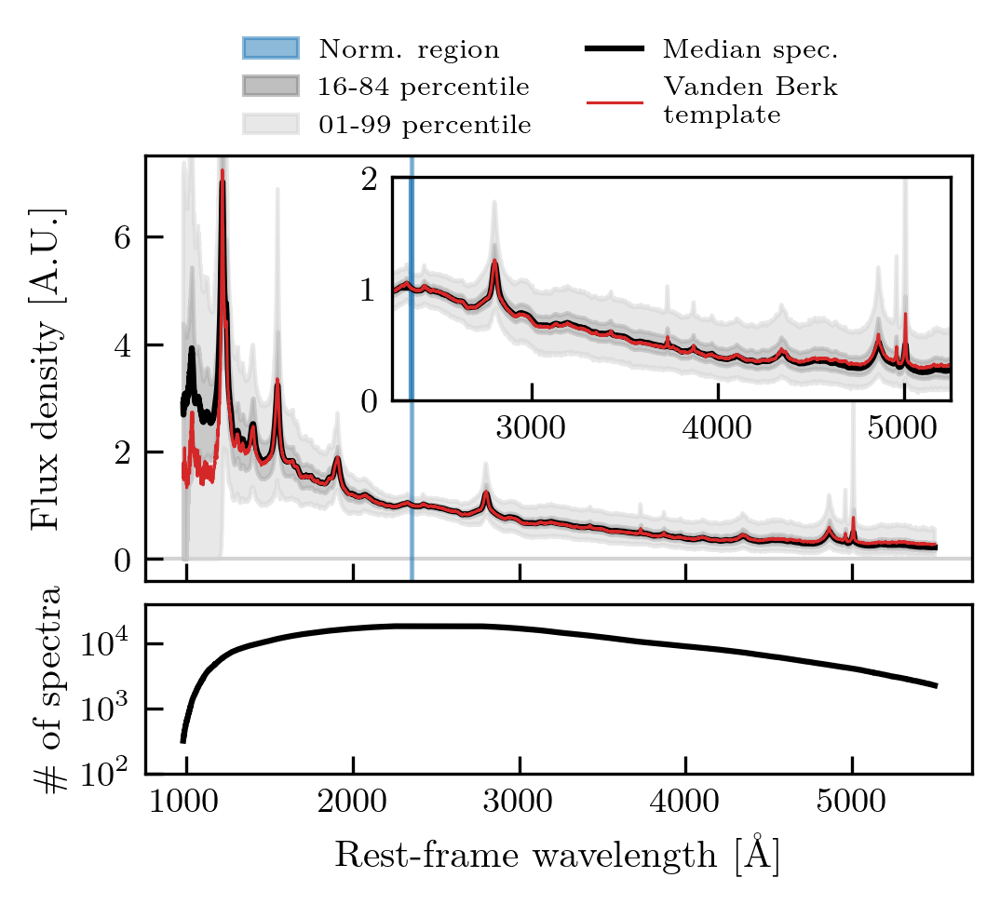

In [ ]:
# make composite as median and plot it
def plot_spec_and_percentile(ax, dispersion, percentiles):
    ax.plot(dispersion, percentiles[2], color="k", lw=1.5, label="Median spectrum")
    ax.fill_between(
        dispersion,
        percentiles[1],
        percentiles[3],
        color="grey",
        alpha=0.5,
        label="16-84 percentile",
    )

    ax.fill_between(
        dispersion,
        percentiles[0],
        percentiles[4],
        color="lightgrey",
        alpha=0.5,
        label="01-99 percentile",
    )

    ax.axvspan(
        2350,
        2360,
        color="C0",
        alpha=0.5,
        zorder=2,
        label="Normalisation region",
    )

# Plot the median spectrum with additional information
fig = plots.init_single_ax_figure(
    preset="single_col",
    axis_ratio=1.3,
    only_fig=True,
    dpi=300,
)

gs = GridSpec(2, 1, height_ratios=[2.5, 1], figure=fig, hspace=0.0)

ax = []
ax.append(fig.add_subplot(gs[0]))
ax.append(fig.add_subplot(gs[1], sharex=ax[0]))

# ================================================================ #

# load the data from the dataset (I'll take the dereddened and extended)
data = np.load(
    local_path
    / "SDSS_DR16Q_SNR15"
    / "SDSS_DR16Q_SNR15_3650_9800_2300_2600_dv140_SNR15.npz"
)

# get the actual fluxes for the plot
dispersion = data["dispersion"][0]
fluxes = data["flux"]
percentiles = np.nanpercentile(fluxes, [1, 16, 50, 84, 99], axis=0)

# Template from VDB
vdb = np.loadtxt(
    project_path / "data" / "vandenberk_template.csv",
    delimiter=",",
)

vdb_inds = np.where((vdb[:, 0] > dispersion[0]) & (vdb[:, 0] < dispersion[-1]))[0]
vdb_norm = np.nanmedian(vdb[(vdb[:, 0] > 2350) & (vdb[:, 0] < 2360), 1])

# ================================================================ #

plot_spec_and_percentile(ax[0], dispersion, percentiles)

ax[0].axhline(0.0, color="lightgrey", lw=1, zorder=-2)

# make inset to show a bit better the > 2100 region
axin = ax[0].inset_axes(
    [0.2984, 0.425, 0.675, 0.525],
    xlim=(2250, 5250),
    ylim=(0.0, 2.0),
    # yticklabels=[],
)

plot_spec_and_percentile(axin, dispersion, percentiles)
axin.axvspan(2350, 2360, color="C0", alpha=0.5, label="Norm. region")

# ================================================================ #

for ax_ in [ax[0], axin]:
    ax_.plot(
        vdb[vdb_inds, 0],
        vdb[vdb_inds, 1] / vdb_norm,
        color="C3",
        lw=0.75,
        label="Vanden Berk\ntemplate",
    )

# ================================================================ #

ax[0].set_ylabel(r"Flux density [A.U.]")
# axin.set_ylabel(r"Flux den.")

# final adjustments
ax[0].set_ylim(-0.4, 7.5)
ax[0].tick_params(axis="x", which="both", labelbottom=False)

# legend with some adjustment
# old legend, before Luisa's comment:
# legend = fig.legend(
#     bbox_to_anchor=(1.00, 0.625), bbox_transform=fig.transFigure, ncol=3
# )
# legend.get_frame().set_alpha(1.0)

legend = fig.legend(
    loc="outside upper center",
    bbox_to_anchor=(0.543, 1.175),
    ncol=2,
    frameon=False,
    fontsize=7,
)
legend.get_frame().set_alpha(1.0)

# ================================================================ #

## Bottom plot
ax[1].plot(
    dispersion,
    np.sum(np.isfinite(fluxes), axis=0),
    color="k",
    lw=1.5,
)

# not sure if it is a good idea to also include the overlap region
ax[1].axhline(0, color="lightgrey", lw=1)
ax[1].set_ylim(100, 40000)
ax[1].set_yticks([100, 1000, 10000])
ax[1].tick_params(axis="y", which="minor", left=False)
# ax[1].ticklabel_format(axis="y", scilimits=[0, 4])
ax[1].set_yscale("log")

ax[1].set_xlabel(r"Rest-frame wavelength [\AA]")
ax[1].set_ylabel(r"\# of spectra")

# adjust positioning of ylabels
fig.align_ylabels(ax)

# fig.savefig(
#     project_path / "figures" / "MedianCompositeSpec_oneColumn.png",
#     bbox_inches="tight",
# )
plt.show()

Current keys: dict_keys([0])


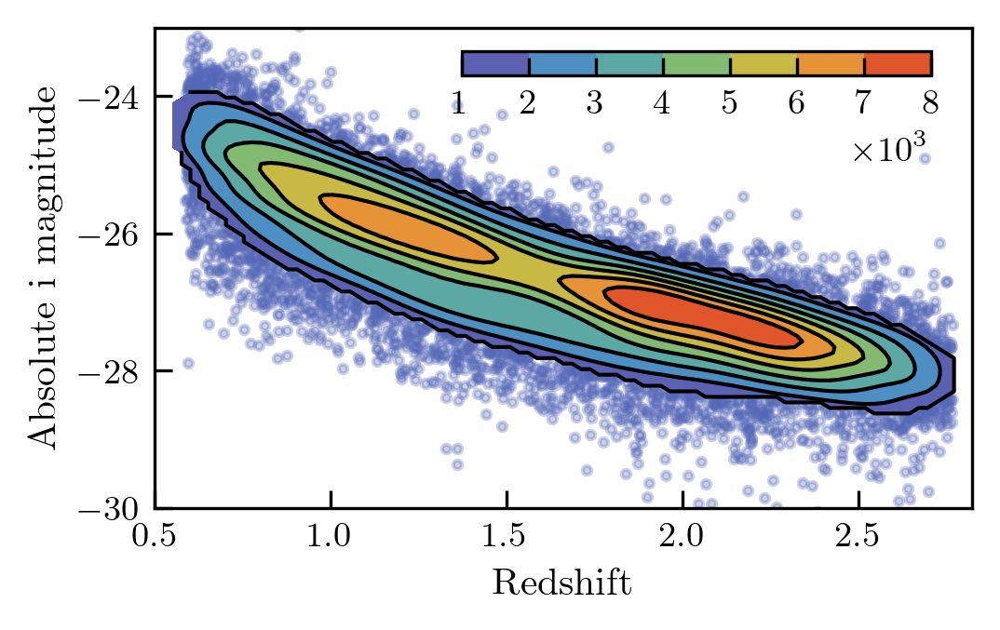

In [ ]:
# make plot to show redshift and magnitude distribition
# here a KDE plot might turn out to be useful
catalogue = pd.read_hdf(
    local_path
    / "SDSS_DR16Q_SNR15"
    / "SDSS_DR16Q_SNR15_3650_9800_2300_2600_dv140_SNR15_cleaned.hdf5"
)

# fig, ax = plt.subplots(1, 1, figsize=(8, 4), layout="compressed")
fig, ax = plots.init_single_ax_figure(preset="single_col", dpi=300)


def make_contour_plot(*args, **kwargs):
    cnt, cntf = qa_plots.kde_plot(*args, **kwargs)

    ax = args[0]  # risky
    ax.set_xlim(0.5, 2.825)
    ax.set_ylim(-30.0, -23)

    ax.set_xlabel("Redshift")
    ax.set_ylabel("Absolute i magnitude")

    # Is this useful in any way?
    axin = ax.inset_axes([0.375, 0.9, 0.575, 0.05])
    cbar = fig.colorbar(cntf, cax=axin, orientation="horizontal")
    cbar.formatter.set_powerlimits((0, 0))
    cbar.update_ticks()


make_contour_plot(
    ax,
    catalogue["Z_PIPE"],
    catalogue["M_I"],
    [0.5, 3.0],
    [-30, -22],
    tol=7e-2,
    kwargs_contour={"colors": "k", "linewidths": 1},
    kwargs_contourf={"cmap": cmap},
    kwargs_scatter={"s": 5, "c": "#5568B8", "alpha": 0.3},
    set_i=0,
    denorm=True,
)

# fig.savefig(project_path / "figures" / "z_MI.png", bbox_inches="tight")
plt.show()

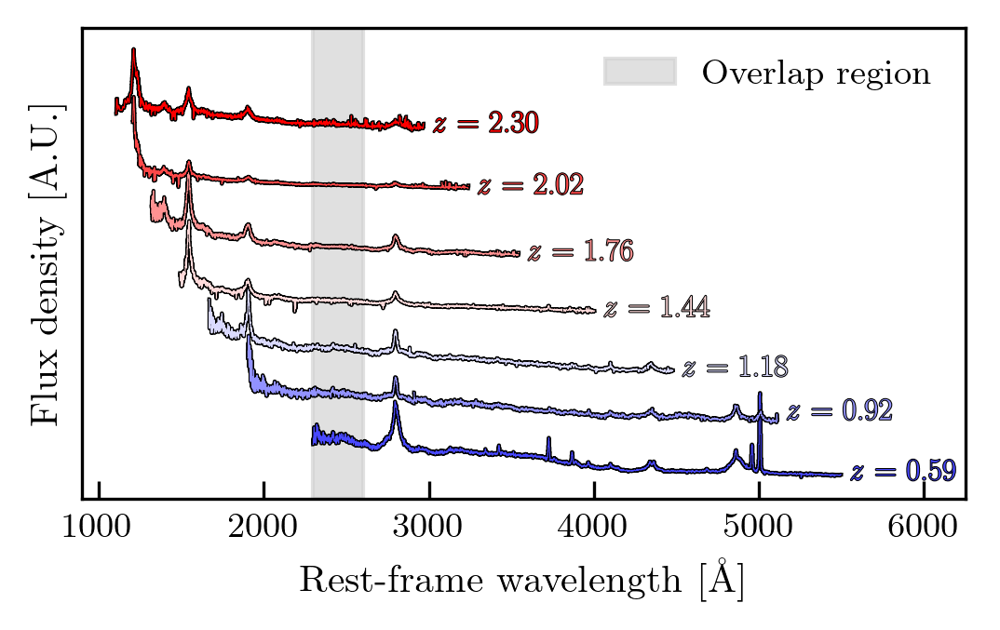

In [ ]:
N = 8
deltas = {0: -1, 1: 0, 2: -1, 3: 1, 4: 0, 5: 0, 6: 1, 7: 1}
shifts = {0: 0.0, 1: 0.5, 2: 1.25, 3: 1.8, 4: 2.5, 5: 3.0, 6: 3.6, 7: 4.3}

cmap_key = "bwr"
colors_ = mpl.colormaps[cmap_key + "_r"](np.linspace(0, 1, N))


def make_increase_z_plot(
    ax,
    dispersion,
    fluxes,
    z,
    N=N,
    colors=colors_,
    cmap_key=cmap_key,
    shifts=None,
):
    z_sorting_inds = np.argsort(z)
    fluxes = fluxes[z_sorting_inds, :]

    step = fluxes.shape[0] // (N - 1)
    for n, i in enumerate(np.arange(0, fluxes.shape[0], step)[::-1]):
        i += deltas[n]
        shift = -1 * shifts[n] if shifts else n * 0.2 * -1

        # cut away red
        # cut_away_inds = np.where(np.isfinite(fluxes[i, :]))[0][-100:]
        flux_plot = fluxes[i, :].copy()
        # flux_plot[cut_away_inds] = np.nan

        ax.step(
            dispersion,
            flux_plot / np.nanmax(fluxes[i, :]) + shift,
            color=colors[n],
            path_effects=[pe.Stroke(linewidth=1.0, foreground="k"), pe.Normal()],
            lw=0.25,
            zorder=-n,
        )

        # place text at the end of a spectrum
        if n != 10:  # len(np.arange(0, fluxes.shape[0], step)) - 1:
            text_ind = np.where(np.isfinite(fluxes[i, :]))[0][-2]
            ax.text(
                dispersion[text_ind] + 50,
                (flux_plot / np.nanmax(fluxes[i, :]) + shift)[text_ind] + 0.025,
                r"\textit{z} = " f"{z.iloc[z_sorting_inds].iloc[i]:.2f}",
                ha="left",
                va="center",
                fontsize=8,
                color=colors[n],
                path_effects=[pe.Stroke(linewidth=0.5, foreground="k"), pe.Normal()],
            )
        else:
            text_ind_last = np.where(np.isfinite(fluxes[i, :]))[0][-2]
            ax.text(
                dispersion[text_ind] + 50,
                (flux_plot / np.nanmax(fluxes[i, :]) + shift)[text_ind_last] - 0.25,
                r"\textit{z} = " f"{z.iloc[z_sorting_inds].iloc[i]:.2f}",
                ha="left",
                va="center",
                fontsize=8,
                color=colors[n],
                path_effects=[pe.Stroke(linewidth=0.5, foreground="k"), pe.Normal()],
            )

    ax.set_xlabel(r"Rest-frame wavelength [\AA]")
    ax.set_ylabel(r"Flux density [A.U.]")

    ax.set_xlim(900, 6250)
    # ax.set_ylim(-2.8, 0.3)

    ax.axvspan(
        2300, 2600, label="Overlap region", color="lightgrey", alpha=0.7, zorder=-100
    )
    ax.legend(loc="upper right", frameon = False)

    # remove label on the yaxis, it is completely unnecessary
    ax.tick_params(axis="y", which="both", labelleft=False, left=False)

# make pieces of plot to be assembled for the VAE
data = np.load(
    local_path
    / "SDSS_DR16Q_SNR15"
    / "SDSS_DR16Q_SNR15_3650_9800_2300_2600_dv140_SNR15.npz"
)
cat = pd.read_hdf(
    local_path
    / "SDSS_DR16Q_SNR15"
    / "SDSS_DR16Q_SNR15_3650_9800_2300_2600_dv140_SNR15_cleaned.hdf5"
)

dispersion = data["dispersion"][0]
fluxes = data["flux"]
gpm = data["gpm"].astype(bool)
fluxes[~gpm] = np.nan

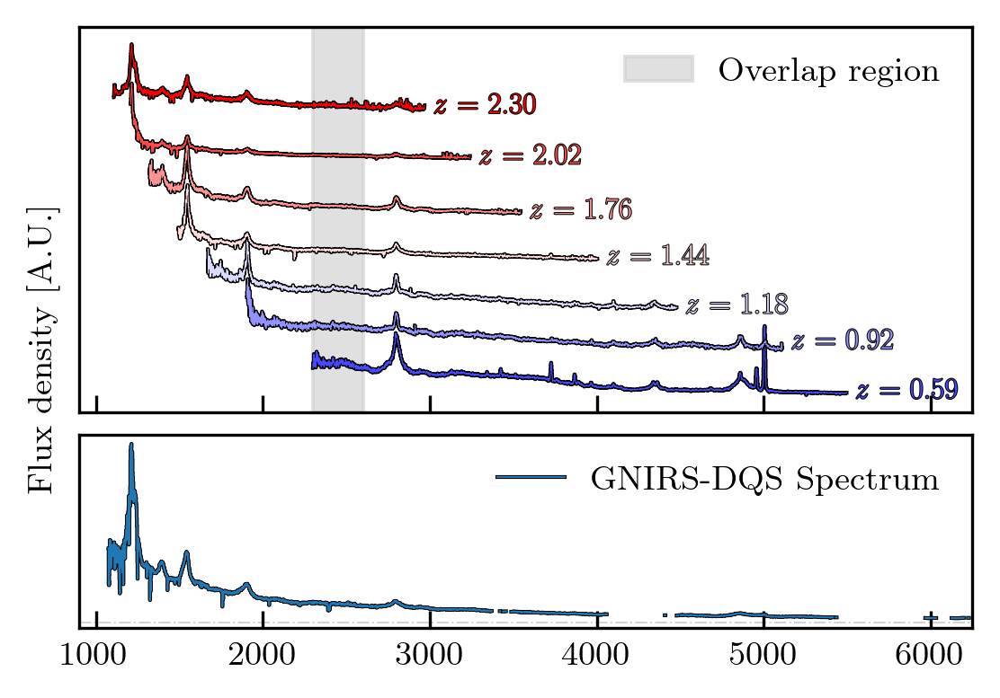

In [ ]:
# single panel, but adding also the GNIRS DQS data
fig = plots.init_single_ax_figure(
    preset="single_col", dpi=300, only_fig=True, axis_ratio=1.4
)
gs = gridspec.GridSpec(2, 1, figure=fig, height_ratios=[2, 1])

ax_sdss = fig.add_subplot(gs[0])
ax_dqs = fig.add_subplot(gs[1], sharex=ax_sdss)

make_increase_z_plot(ax_sdss, dispersion, fluxes, cat["Z_PIPE"], shifts=shifts)

ax_sdss.set_xlabel("")
ax_sdss.set_ylabel("")

ax_sdss.tick_params(axis="x", which="both", labelbottom=False)

# Add a GNRIS DQS spectrum from Daming
local_path_DY_ext = local_path / "GNIRS_DQS_spectra" / "sdss_nir_stack_data_clean.npz"

# Load in the extra data
DY_ext, DY_ext_nir = np.load(local_path_DY_ext), {}
DY_ext_nir["wave_rest_rebin"] = DY_ext["wave_rest_rebin"]
for key in ["flux_tot", "ivar_tot", "gpm_tot", "cont_final_tot", "gpm_cont_tot"]:
    DY_ext_nir[key] = DY_ext[key][DY_ext["is_nir"], :]
    DY_ext_nir[key][DY_ext_nir[key] < -1e3] = np.nan

# get the wavelength array
current_wave = DY_ext_nir["wave_rest_rebin"]

# plot the first one as an example
ax_dqs.step(
    current_wave,
    DY_ext_nir["flux_tot"][14, :] / np.nanmax(DY_ext_nir["flux_tot"][14, :]),
    where="mid",
    color="C0",
    lw=0.5,
    label="GNIRS-DQS Spectrum",
    path_effects=[pe.Stroke(linewidth=1.0, foreground="k"), pe.Normal()],
)

ax_dqs.axhline(0.0, color="lightgrey", lw=0.5, ls = "-.", zorder=-2)
ax_dqs.tick_params(axis="y", which="both", left=False, labelleft=False)
ax_dqs.legend(loc="upper right", frameon = False)

# ================================================================= #

fig.supylabel(r"Flux density [A.U.]", x=-0.025)

# fig.savefig(
#     project_path / "figures" / "SDSS_Redshift_sequence_with_DQS.png",
#     bbox_inches="tight",
# )
plt.show()

/Users/francesco/data/QUEST/dust_maps


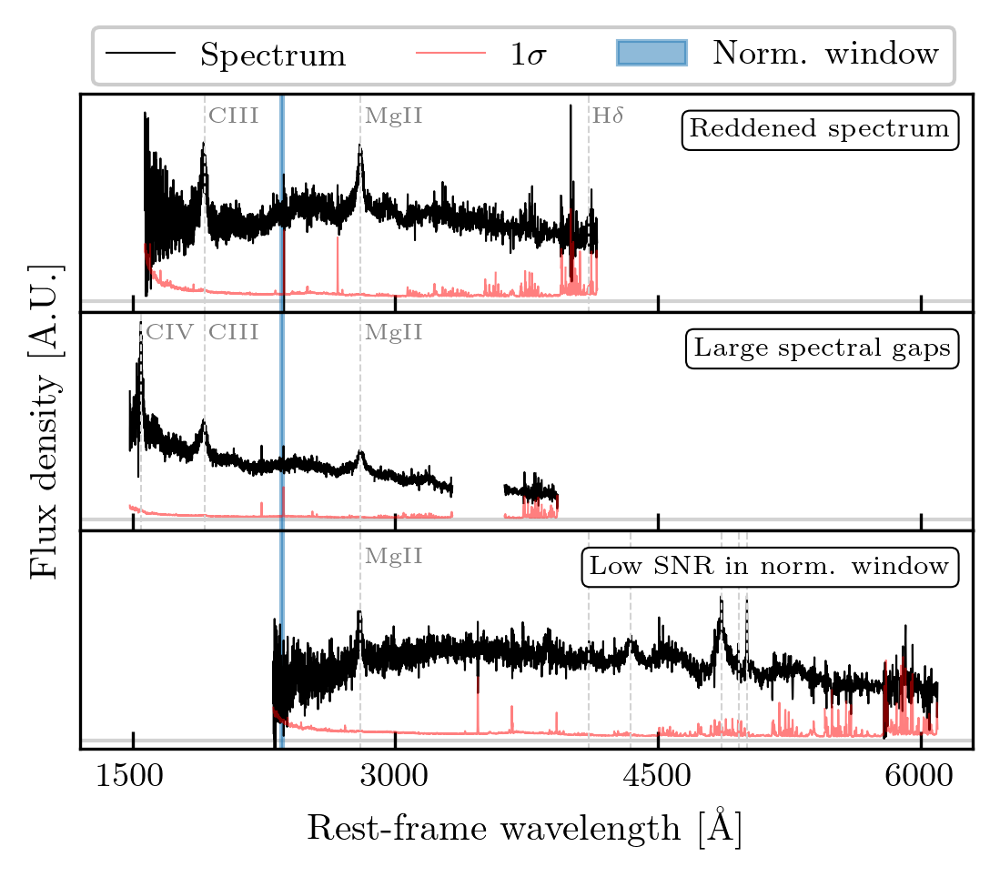

In [ ]:
from QUEST.utils import autofit, sdss

# spec-9345-57713-0519.fits -> Absorption line cleaning
# spec-7745-58077-0878.fits -> Too many interpolated pixels
# spec-6880-56543-0942.fits -> SNR low in normalisation range

obs_wave_range = [3700, 9800]

# example of removed spectra for different reasons
fig = plots.init_single_ax_figure(
    preset="single_col", axis_ratio=1.25, dpi=300, only_fig=True
)
axs = []
for i in range(3):
    if i == 0:
        axs.append(fig.add_subplot(3, 1, i + 1))
    else:
        axs.append(fig.add_subplot(3, 1, i + 1, sharex=axs[0]))

# function signature: log_lam_obs, log_lam_rest, flux, ivar, redsh
for n, spec_fname in enumerate(
    [
        "spec-9345-57713-0519.fits",
        "spec-7745-58077-0878.fits",
        "spec-6880-56543-0942.fits",
    ]
):
    # read the data and convert wavelength to linear scale
    spec_data = list(
        sdss.read_sdss_lite_spectrum(
            local_path / "SDSS_spectra", spec_fname, deredden=False
        )
    )
    for _ in [0, 1]:
        spec_data[_] = 10 ** spec_data[_]

    # normalise the spectrum using the same range as the script
    norm = np.nanmedian(spec_data[2][(spec_data[1] > 2350) & (spec_data[1] < 2360)])
    valid_inds = np.where(
        (spec_data[0] > obs_wave_range[0]) & (spec_data[0] < obs_wave_range[1])
    )[0]

    spec_data[2][spec_data[3] == 0.0] = np.nan  # remove bad pixels
    spec_data[3][spec_data[3] == 0.0] = np.nan  # remove bad pixels

    # plot the spectra
    axs[n].plot(
        spec_data[1][valid_inds],
        spec_data[2][valid_inds] / norm,
        lw=0.5,
        c="k",
        label="Spectrum" if n == 0 else None,
    )

    axs[n].plot(
        spec_data[1][valid_inds],
        np.sqrt(autofit.inverse(spec_data[3][valid_inds])) / norm,
        color="red",
        alpha=0.5,
        label=r"1$\sigma$" if n == 0 else None,
        lw=0.5,
        # edgecolor="none",
        zorder=2,
    )

    axs[n].axhline(0.0, color="lightgrey", lw=1, zorder=-2)
    axs[n].tick_params(axis="y", which="both", labelleft=False, left=False)
    if n != 2:
        axs[n].tick_params(axis="x", which="both", labelbottom=False)

    current_ylim = list(axs[n].get_ylim())
    if current_ylim[1] > 4 * np.median(spec_data[2][valid_inds] / norm):
        current_ylim[1] = np.median(spec_data[2][valid_inds] / norm) * 3

    if n != 2:
        axs[n].set_ylim(-current_ylim[1] * 0.05, current_ylim[1])
    else:
        axs[n].set_ylim(-current_ylim[1] * 0.05, current_ylim[1] * 1.35)

    if n == 0:
        axs[n].axvspan(
            2350, 2360, color="C0", alpha=0.5, label="Norm. window", zorder=-1
        )
    else:
        axs[n].axvspan(2350, 2360, color="C0", alpha=0.5, zorder=-1)


axs[-1].set_xlabel(r"Rest-frame wavelength [\AA]")
axs[1].set_ylabel(r"Flux density [A.U.]")

ll = fig.legend(loc="outside upper center", ncol=3, bbox_to_anchor=(0.525, 1.11))
ll.get_frame().set_alpha(1.0)

# add text
axs[0].text(
    0.975,
    0.8,
    r"Reddened spectrum",
    fontsize=7,
    transform=axs[0].transAxes,
    ha="right",
    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.5),
)
axs[1].text(
    0.975,
    0.8,
    r"Large spectral gaps",
    fontsize=7,
    transform=axs[1].transAxes,
    ha="right",
    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.5),
)
axs[2].text(
    0.975,
    0.8,
    r"Low SNR in norm. window",
    fontsize=7,
    transform=axs[2].transAxes,
    ha="right",
    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.5),
)

annotate_lines(
    axs[0],
    -0.1,
    1.0,
    2.15,
    25,
    0,
    line_dict=line_dict,
    th=1.0,
    lw=0.5,
    xmin=1700,
    xmax=4200,
    color="lightgrey",
    ls="--",
    kwargs_text={
        "ha": "left",
        "va": "center",
        "zorder": -1,
        "fontsize": 6,
        "color": "grey",
    },
)

annotate_lines(
    axs[1],
    -0.1,
    1.0,
    3.3,
    25,
    0,
    line_dict=line_dict,
    th=1.0,
    lw=0.5,
    xmin=1500,
    xmax=4000,
    color="lightgrey",
    ls="--",
    kwargs_text={
        "ha": "left",
        "va": "center",
        "zorder": -1,
        "fontsize": 6,
        "color": "grey",
    },
)

annotate_lines(
    axs[2],
    -0.1,
    1.0,
    3.3,
    25,
    0,
    line_dict=line_dict,
    th=1.0,
    lw=0.5,
    xmin=2000,
    xmax=6000,
    color="lightgrey",
    ls="--",
    kwargs_text={
        "ha": "left",
        "va": "center",
        "zorder": -1,
        "fontsize": 6,
        "color": "grey",
    },
)

axs[-1].set_xlim(1200, 6300)
axs[-1].set_xticks(np.arange(1500, 6001, 1500))

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.0, wspace=0.0)
fig.align_labels()

# fig.savefig(project_path / "figures" / "SDSS_rejected_example.png", bbox_inches="tight")
plt.show()

In [ ]:
def prepare_synth_data():
    # These are my magnites
    # Note that I might need to go to fluxes instead of this, it is probably safer
    # This essentially means that I need to use the _flux column instead of the _pert
    # Also note that the magnitudes are AB, and the fluxes are in Jansky!
    synth = pd.read_hdf(
        local_path
        / "generated_photometry_SDSS"
        / "20250626"
        / "GeneratedPhot-sdss2010-giruz_VISTA_SVO-HJKsYZ_UKIRT_SVO-HJKY_twomass-HJKs-0p5to6p0_M1450-m30tom20_20250626_214310.hdf5",
        # "2025" / "GeneratedPhot-sdss2010-giruz-0p5to4p0_M1450-m30tom20_20250522_145524.hdf5",
        key="data",
    )

    synth.rename(
        {
            "SDSS_U_Synt_pert": "PSFMAG_U",
            "SDSS_G_Synt_pert": "PSFMAG_G",
            "SDSS_R_Synt_pert": "PSFMAG_R",
            "SDSS_I_Synt_pert": "PSFMAG_I",
            "SDSS_Z_Synt_pert": "PSFMAG_Z",
            "UKIDSS_Y_Synt_pert": "PSFMAG_Y",
            "UKIDSS_J_Synt_pert": "PSFMAG_J",
            "UKIDSS_H_Synt_pert": "PSFMAG_H",
            "UKIDSS_K_Synt_pert": "PSFMAG_K",
            "SDSS_U_Synt_flux": "PSFFLUX_U",
            "SDSS_G_Synt_flux": "PSFFLUX_G",
            "SDSS_R_Synt_flux": "PSFFLUX_R",
            "SDSS_I_Synt_flux": "PSFFLUX_I",
            "SDSS_Z_Synt_flux": "PSFFLUX_Z",
            "UKIDSS_Y_Synt_flux": "PSFFLUX_Y",
            "UKIDSS_J_Synt_flux": "PSFFLUX_J",
            "UKIDSS_H_Synt_flux": "PSFFLUX_H",
            "UKIDSS_K_Synt_flux": "PSFFLUX_K",
        },
        axis=1,
        inplace=True,
    )

    synth.reset_index(drop=True).sort_values("redshift", axis=0, inplace=True)
    return synth


def prepare_sdss_data(use_only_clean_dataset=False):
    # from catalogue magnidutes
    if use_only_clean_dataset:
        dr16q = pd.read_hdf(
            local_path
            / "SDSS_DR16Q_SNR15"
            / "SDSS_DR16Q_SNR15_3650_9800_2300_2600_dv140_SNR15_cleaned.hdf5"
        )
    else:
        dr16q = pd.read_hdf(Path.home() / "data" / "catalogues" / "DR16Q_v4.hdf5")

    # cut in the same redshift and abs mag range
    dr16q.query(
        "ZWARNING == 0 and Z > 0.5 and Z < 5.3 and M_I > -30 and M_I < -20",
        inplace=True,
    )

    dr16q.rename(
        {
            "PSFMAG_0": "PSFMAG_U",
            "PSFMAG_1": "PSFMAG_G",
            "PSFMAG_2": "PSFMAG_R",
            "PSFMAG_3": "PSFMAG_I",
            "PSFMAG_4": "PSFMAG_Z",
            "PSFFLUX_0": "PSFFLUX_U",
            "PSFFLUX_1": "PSFFLUX_G",
            "PSFFLUX_2": "PSFFLUX_R",
            "PSFFLUX_3": "PSFFLUX_I",
            "PSFFLUX_4": "PSFFLUX_Z",
        },
        axis=1,
        inplace=True,
    )

    # This does not seem to work that well
    dr16q["PSFFLUX_U"] *= 3.631e-6  # This is now in Jansky!
    dr16q["PSFFLUX_G"] *= 3.631e-6  # This is now in Jansky!
    dr16q["PSFFLUX_R"] *= 3.631e-6  # This is now in Jansky!
    dr16q["PSFFLUX_I"] *= 3.631e-6  # This is now in Jansky!
    dr16q["PSFFLUX_Z"] *= 3.631e-6  # This is now in Jansky!
    dr16q["PSFFLUX_Z"] = (
        10 ** ((-2.5 * np.log10(dr16q["PSFFLUX_Z"] / 3631)) / (-2.5)) * 3631
    )

    # just take the columns we need to make the plot
    dr16q = dr16q.reset_index(drop=True)
    dr16q.sort_values("Z", axis=0, inplace=True)
    # dr16q.sample(n=50000, replace=False, random_state=42)

    # see https://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html
    #  for the zero points
    # TODO: There is a whole to figure out about twomass, the last plot I made was
    #  completely off and I still don't know why
    # These fluxes are now in Jansky
    dr16q["PSFLUX_J_2MASS"] = 1594.0 * 10 ** (-dr16q["JMAG"] / 2.5)
    dr16q["PSFLUX_H_2MASS"] = 1024.0 * 10 ** (-dr16q["HMAG"] / 2.5)
    dr16q["PSFLUX_K_2MASS"] = 666.7 * 10 ** (-dr16q["KMAG"] / 2.5)

    dr16q["PSFFLUX_Y"] = (
        (dr16q["YFLUX"].values * u.Watt / u.m**2 / u.Hz)
        .to(u.Jansky, equivalencies=u.spectral_density(1.0305 * u.micrometer))
        .value
    )
    dr16q["PSFFLUX_J"] = (
        (dr16q["JFLUX"].values * u.Watt / u.m**2 / u.Hz)
        .to(u.Jansky, equivalencies=u.spectral_density(1.2483 * u.micrometer))
        .value
    )
    dr16q["PSFFLUX_H"] = (
        (dr16q["HFLUX"].values * u.Watt / u.m**2 / u.Hz)
        .to(u.Jansky, equivalencies=u.spectral_density(1.6313 * u.micrometer))
        .value
    )
    dr16q["PSFFLUX_K"] = (
        (dr16q["KFLUX"].values * u.Watt / u.m**2 / u.Hz)
        .to(u.Jansky, equivalencies=u.spectral_density(2.2010 * u.micrometer))
        .value
    )

    return dr16q


def twoMass_to_AB(m, zp):
    flux = zp * 10 ** (-m / 2.5)
    return -2.5 * np.log10(flux / 3631.0)


# convert the stupid sdss magnitudes to fluxes
def sdss_mag_to_flux(m, b):
    A = -2.5 / np.log(10)
    return 2 * b * np.sinh((m - A * np.log(b)) / A)

In [ ]:
def make_color_redshift_subplot(
    fig,
    ax,
    dr16q,
    synth,
    name_flux_1,
    name_flux_2,
    plot_dr16q_median=True,
    dr16q_plotting_colors=["red", "darkred"],
    plot_synt_median=True,
    plot_synt_percentiles=False,
    add_scatter_pts=False,
    scatter_kwargs={},
    add_legend=True,
):
    binned_statistic_min, binned_statistic_max, binned_statistic_delta = 0.9, 5.1, 0.1
    binned_statistic_bins = np.arange(
        binned_statistic_min, binned_statistic_max, binned_statistic_delta
    )

    # binned stats for SDSS
    median = binned_statistic(
        dr16q["Z"],
        dr16q[name_flux_1] / dr16q[name_flux_2],
        bins=binned_statistic_bins,
        statistic="median",
    )[0]

    perc_16 = binned_statistic(
        dr16q["Z"],
        dr16q[name_flux_1] / dr16q[name_flux_2],
        bins=binned_statistic_bins,
        statistic=lambda x: np.nanpercentile(x, 16),
    )[0]

    perc_84 = binned_statistic(
        dr16q["Z"],
        dr16q[name_flux_1] / dr16q[name_flux_2],
        bins=binned_statistic_bins,
        statistic=lambda x: np.nanpercentile(x, 84),
    )[0]

    area_fill_qso = ax.fill_between(
        binned_statistic_bins[:-1] + binned_statistic_delta / 2,
        perc_84,
        perc_16,
        facecolor=dr16q_plotting_colors[0],
        edgecolor=dr16q_plotting_colors[0],
        alpha=0.3,
    )

    if plot_dr16q_median:
        median_line_qso = ax.plot(
            binned_statistic_bins[:-1] + binned_statistic_delta / 2,
            median,
            c=dr16q_plotting_colors[1],
            ls="--",
            lw=0.75,
        )

    # binned stats for synthetic
    # valid_inds for now is just all the inds, I need to check
    #  whether I need to include a mask or not
    name_mag_1 = name_flux_1.replace("PSFFLUX", "PSFMAG")
    name_mag_2 = name_flux_2.replace("PSFFLUX", "PSFMAG")
    valid_inds = (synth[name_mag_1] != 99.0) & (synth[name_mag_2] != 99.0)

    if add_scatter_pts:
        ax.scatter(
            synth["redshift"][valid_inds],
            (synth[name_flux_1] / synth[name_flux_2])[valid_inds],
            **scatter_kwargs,
        )

    median = binned_statistic(
        synth["redshift"][valid_inds],
        (synth[name_flux_1] / synth[name_flux_2])[valid_inds],
        bins=binned_statistic_bins,
        statistic="median",
    )[0]

    if plot_synt_percentiles:
        perc_16 = binned_statistic(
            synth["redshift"][valid_inds],
            (synth[name_flux_1] / synth[name_flux_2])[valid_inds],
            bins=binned_statistic_bins,
            statistic=lambda x: np.nanpercentile(x, 16),
        )[0]

        perc_84 = binned_statistic(
            synth["redshift"][valid_inds],
            (synth[name_flux_1] / synth[name_flux_2])[valid_inds],
            bins=binned_statistic_bins,
            statistic=lambda x: np.nanpercentile(x, 84),
        )[0]

        ax.plot(
            binned_statistic_bins[:-1] + binned_statistic_delta / 2,
            perc_16,
            c="k",
            lw=0.5,
            ls=(0, (3, 2, 1, 2, 1, 2)),
        )

        ax.plot(
            binned_statistic_bins[:-1] + binned_statistic_delta / 2,
            perc_84,
            c="k",
            lw=0.5,
            ls=(0, (3, 2, 1, 2, 1, 2)),
        )

    if plot_synt_median:
        median_line_syn = ax.plot(
            binned_statistic_bins[:-1] + binned_statistic_delta / 2,
            median,
            c="k",
            lw=1.0,
        )

        # add path effects to the binned statistic lines
        median_line_syn[0].set_path_effects(
            [pe.Stroke(linewidth=1.5, foreground="white"), pe.Normal()]
        )

    # ax.set_ylabel(f"{name_flux_1.split('_')[1]} - {name_flux_2.split('_')[1]}")

    if add_legend:
        ax.legend(ncol=2, loc="upper right", fontsize=7)


py.warnings - WARNING: /Users/francesco/uvp/QUEST/.venv/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)

py.warnings - WARNING: /Users/francesco/uvp/QUEST/.venv/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)



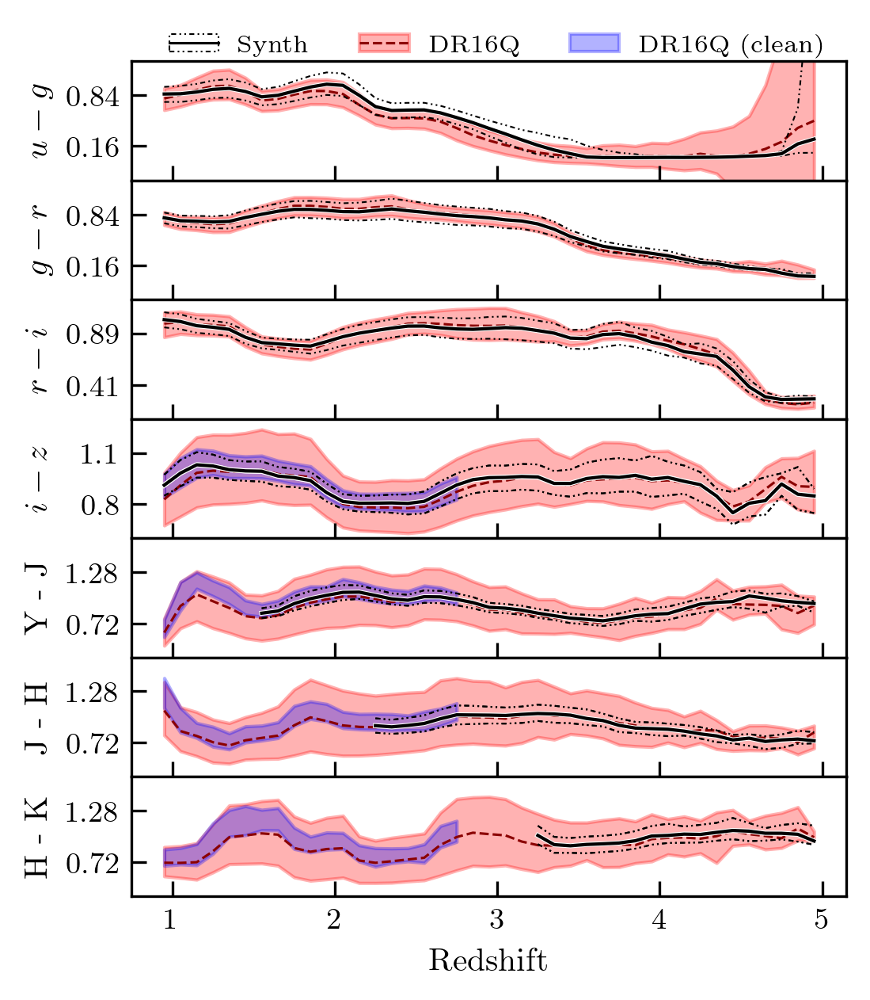

In [ ]:
# my magnidutes
synth = prepare_synth_data()

# from catalogue magnidutes
dr16q = prepare_sdss_data()

# from catalogue magnidutes
dr16q = prepare_sdss_data()
dr16q_train_dataset = prepare_sdss_data(use_only_clean_dataset=True)

fig = plots.init_single_ax_figure(
    preset="single_col", axis_ratio=0.9, dpi=300, only_fig=True
)
ax_UmG = fig.add_subplot(7, 1, 1)
ax_GmR = fig.add_subplot(7, 1, 2, sharex=ax_UmG)
ax_RmI = fig.add_subplot(7, 1, 3, sharex=ax_UmG)
ax_ImZ = fig.add_subplot(7, 1, 4, sharex=ax_UmG)
ax_YmJ = fig.add_subplot(7, 1, 5, sharex=ax_UmG)
ax_JmH = fig.add_subplot(7, 1, 6, sharex=ax_UmG)
ax_HmK = fig.add_subplot(7, 1, 7, sharex=ax_UmG)

# Test value, will then need to do this for all the colors
make_color_redshift_subplot(
    fig,
    ax_UmG,
    dr16q,
    synth,
    "PSFFLUX_U",
    "PSFFLUX_G",
    add_legend=False,
    plot_synt_percentiles=True,
)

make_color_redshift_subplot(
    fig,
    ax_GmR,
    dr16q,
    synth,
    "PSFFLUX_G",
    "PSFFLUX_R",
    add_legend=False,
    plot_synt_percentiles=True,
)

make_color_redshift_subplot(
    fig,
    ax_RmI,
    dr16q,
    synth,
    "PSFFLUX_R",
    "PSFFLUX_I",
    add_legend=False,
    plot_synt_percentiles=True,
)

make_color_redshift_subplot(
    fig,
    ax_ImZ,
    dr16q,
    synth,
    "PSFFLUX_I",
    "PSFFLUX_Z",
    add_legend=False,
    plot_synt_percentiles=True,
)

make_color_redshift_subplot(
    fig,
    ax_YmJ,
    dr16q.query("PSFFLUX_Y > -1.000000e+25 and PSFFLUX_J > -1.000000e+25"),
    synth.query("redshift > 1.5"),
    "PSFFLUX_Y",
    "PSFFLUX_J",
    add_legend=False,
    plot_synt_percentiles=True,
)

make_color_redshift_subplot(
    fig,
    ax_JmH,
    dr16q.query("PSFFLUX_J > -1.000000e+25 and PSFFLUX_H > -1.000000e+25"),
    synth.query("redshift > 2.2"),
    "PSFFLUX_J",
    "PSFFLUX_H",
    add_legend=False,
    plot_synt_percentiles=True,
)

make_color_redshift_subplot(
    fig,
    ax_HmK,
    dr16q.query("PSFFLUX_H > -1.000000e+25 and PSFFLUX_K > -1.000000e+25"),
    synth.query("redshift > 3.2"),
    "PSFFLUX_H",
    "PSFFLUX_K",
    add_legend=False,
    plot_synt_percentiles=True,
)

make_color_redshift_subplot(
    fig,
    ax_ImZ,
    dr16q_train_dataset,
    synth,
    "PSFFLUX_I",
    "PSFFLUX_Z",
    plot_dr16q_median=False,
    dr16q_plotting_colors=["blue", "darkblue"],
    add_legend=False,
    plot_synt_percentiles=True,
)

make_color_redshift_subplot(
    fig,
    ax_YmJ,
    dr16q_train_dataset.query(
        "PSFFLUX_Y > -1.000000e+25 and PSFFLUX_J > -1.000000e+25"
    ),
    synth.query("redshift > 1.5"),
    "PSFFLUX_Y",
    "PSFFLUX_J",
    plot_dr16q_median=False,
    dr16q_plotting_colors=["blue", "darkblue"],
    add_legend=False,
    plot_synt_median=False,
    plot_synt_percentiles=True,
)

make_color_redshift_subplot(
    fig,
    ax_JmH,
    dr16q_train_dataset.query(
        "PSFFLUX_J > -1.000000e+25 and PSFFLUX_H > -1.000000e+25"
    ),
    synth.query("redshift > 2.2"),
    "PSFFLUX_J",
    "PSFFLUX_H",
    plot_dr16q_median=False,
    dr16q_plotting_colors=["blue", "darkblue"],
    add_legend=False,
    plot_synt_median=False,
    plot_synt_percentiles=True,
)

make_color_redshift_subplot(
    fig,
    ax_HmK,
    dr16q_train_dataset.query(
        "PSFFLUX_H > -1.000000e+25 and PSFFLUX_K > -1.000000e+25"
    ),
    synth.query("redshift > 3.2"),
    "PSFFLUX_H",
    "PSFFLUX_K",
    plot_dr16q_median=False,
    dr16q_plotting_colors=["blue", "darkblue"],
    add_legend=False,
    plot_synt_median=False,
    plot_synt_percentiles=True,
)

# fix the intermediate ticks and remove as much space as possible
for _ in [ax_UmG, ax_GmR, ax_RmI, ax_ImZ, ax_YmJ, ax_JmH]:
    _.tick_params(axis="x", which="both", labelbottom=False)

ax_UmG.set_ylim(-0.3, 1.3)
ax_UmG.set_yticks([0.16, 0.84])

ax_GmR.set_ylim(-0.3, 1.3)
ax_GmR.set_yticks([0.16, 0.84])

ax_RmI.set_ylim(0.1, 1.2)
ax_RmI.set_yticks([0.41, 0.89])

ax_ImZ.set_ylim(0.6, 1.3)
ax_ImZ.set_yticks([0.8, 1.1])

ax_YmJ.set_ylim(0.35, 1.65)
ax_YmJ.set_yticks([0.72, 1.28])

ax_JmH.set_ylim(0.35, 1.65)
ax_JmH.set_yticks([0.72, 1.28])

ax_HmK.set_ylim(0.35, 1.65)
ax_HmK.set_yticks([0.72, 1.28])

ax_HmK.set_xlabel("Redshift")
ax_UmG.set_ylabel(r"$u - g$")
ax_GmR.set_ylabel(r"$g - r$")
ax_RmI.set_ylabel(r"$r - i$")
ax_ImZ.set_ylabel(r"$i - z$")
ax_YmJ.set_ylabel(r"Y - J")
ax_JmH.set_ylabel(r"J - H")
ax_HmK.set_ylabel(r"H - K")

# manually make the legend so that I can put it outside the plot
black_line = Line2D([], [], color="k", label="Synth")
red_line = Line2D([], [], color="red", label="DR16Q")
blue_line = Line2D([], [], color="blue", label="DR16Q (clean)")

handlers = [black_line, red_line, blue_line]
# it's always line -> Path
handlers_renderers = [
    gqap.Handler(
        {"color": "k", "lw": 0.75},
        {
            "facecolor": "none",
            "edgecolor": "k",
            "ls": (0, (3, 2, 1, 2, 1, 2)),
            "lw": 0.5,
        },
    ),
    gqap.Handler(
        {"color": "darkred", "linestyle": "--", "lw": 0.75},
        {"facecolor": "red", "edgecolor": "red", "alpha": 0.3},
    ),
    gqap.Handler(
        {},
        {
            "facecolor": "blue",
            "edgecolor": "blue",
            "alpha": 0.3,
        },
        no_line=True,
    ),
]

handlers_map = dict(zip(handlers, handlers_renderers))

# Final adjustments
fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.0, wspace=0.0)
fig.align_labels()

# figure legend
legend = fig.legend(
    handles=handlers,
    handler_map=handlers_map,
    loc="outside upper center",
    bbox_to_anchor=(0.575, 1.055),
    ncol=3,
    frameon=False,
    fontsize=7.5,
)
legend.get_frame().set_alpha(1.0)

# save the megaplot
# fig.savefig(
#     project_path
#     / "figures"
#     / "SDSS_photometry_sanity_check_no_zmY_with_synth_percentile.png",
#     bbox_inches="tight",
# )

plt.show()

In [20]:
TGEN = torch.Generator().manual_seed(42)
DEVICE = utilities.set_device(force=None)


def load_model_for_plotting(json_path_):
    parameter_path = json_path_ / "params.json"

    parameters = cfg.MLConfig().from_json(path=parameter_path)
    training_set_dir = root_dir = local_path / parameters.input_dataset_parent_dir

    dataset, dispersion, scaling_factor = utilities.load_dataset(
        training_set_dir,
        parameters.input_dataset_name,
        subsample=1,
        replace_nan=True,
        replace_val=0,
        device=DEVICE,
        scale_spectra=parameters.scale_spectra,
        scale_method=parameters.scale_method,
        scale_by=parameters.scale_by,
        use_dereddened=False,
        # scale_spectra -> False
        # scale_method  -> None
        #  If we need to make this explicit.
        # Here I do to make sure things are NOT being scaled!
    )

    train_set, valid_set = random_split(dataset, [0.9, 0.1], generator=TGEN)

    # trained model, change to load the appropriate one
    trained_model, _, _, _, _ = ld.load_model(
        InfoSpecVAE,
        root_dir,
        dispersion,
        DEVICE,
        parameters=parameters,
        scaling_factor=scaling_factor,
        trained_model_dir=None,
        trained_model_fname="InfoSpecVAE.pt",
        use_dereddened_spectra=False,
    )

    qa_dataloader = torch.utils.data.DataLoader(
        valid_set,
        batch_size=parameters.default_batch_size,
        shuffle=False,
    )

    gmm, qa_z = utilities.create_latent_space_gmm(
        trained_model,
        qa_dataloader,
        n_components=10,
    )

    return trained_model, train_set, valid_set, gmm

In [ ]:
# Load the model for GP
json_path_ = Path.home() / "VAE_QA" / "best" / "GP" / "InfoSpecVAE"
trained_model_GP, train_set_GP, valid_set_GP, gmm_GP = load_model_for_plotting(
    json_path_
)

# Load the model for FOR
json_path_ = Path.home() / "VAE_QA" / "best" / "FOR" / "InfoSpecVAE"
trained_model_FOR, train_set_FOR, valid_set_FOR, gmm_FOR = load_model_for_plotting(
    json_path_
)

# # Load the model for FOB
json_path_ = Path.home() / "VAE_QA" / "best" / "FOB" / "InfoSpecVAE"
trained_model_FOB, train_set_FOB, valid_set_FOB, gmm_FOB = load_model_for_plotting(
    json_path_
)

QUEST.mlconfig - INFO: Setting runtime parameters to default values:
QUEST.mlconfig - INFO: Runtime parameter overwrite set to False.
QUEST.mlconfig - INFO: Runtime parameter overwrite_cpu_defaults set to False.
QUEST.mlconfig - INFO: Runtime parameter n_cpu set to 8.
QUEST.mlconfig - INFO: Runtime parameter niceness set to None.
QUEST.mlconfig - INFO: Runtime parameter make_checkpoint_plot set to False.
QUEST.mlconfig - INFO: Runtime parameter checkpoint_epoch set to None.
QUEST.mlconfig - INFO: Runtime parameter dry_run set to False.
QUEST.mlconfig - INFO: Runtime parameter no_qa set to False.
QUEST.mlconfig - INFO: Runtime parameter tag set to .
QUEST.mlconfig - INFO: Runtime parameter json_full_path set to None.
QUEST.mlconfig - INFO: Runtime parameter early_stopping set to False.
QUEST.mlconfig - INFO: Runtime parameter es_patience set to None.
QUEST.mlconfig - INFO: Runtime parameter es_rel_delta set to None.
QUEST.mlconfig - INFO: Runtime parameter debug set to False.
QUEST.mlco

QUEST.mlconfig - WARNING: 	Parameter default_batch_size already set to 128, found 128 in the json file. Not updating.
QUEST.mlconfig - WARNING: `--early-stopping` not set, setting `es_upd_lr`, `es_patience` and `es_rel_delta` to None.


QUEST.utils.utilities - INFO: Loading dataset.
QUEST.utils.spec_dataset - INFO: Loading dataset from /Users/francesco/data/QUEST/SDSS_DR16Q_SNR15/SDSS_DR16Q_SNR15_3650_9800_2300_2600_dv140_SNR15.npz
QUEST.utils.spec_dataset - INFO: Using non-dereddened spectra.
QUEST.utils.utilities - INFO: Dataset loaded.
QUEST.utils.load - INFO: No trained model directory provided but loading parameters from a json file. Trying to find a model in the same folder.
QUEST.utils.load - INFO: Found model: /Users/francesco/VAE_QA/best/GP/InfoSpecVAE/InfoSpecVAE.pt.
QUEST.utils.load - INFO: Loading model /Users/francesco/VAE_QA/best/GP/InfoSpecVAE/InfoSpecVAE.pt from /Users/francesco/VAE_QA/best/GP/InfoSpecVAE.
QUEST.utils.load - INFO: Inferred timestamp from folder structure: GP
QUEST.utils.load - INFO: Invalid timestamp, using timestamp: 20250921_180831p36

Current set of parameters:
Call the script with the --help flag for additional details.

  Parameter               | Value
  ------------------------+

QUEST.mlconfig - WARNING: 	Parameter default_batch_size already set to 128, found 128 in the json file. Not updating.
QUEST.mlconfig - WARNING: `--early-stopping` not set, setting `es_upd_lr`, `es_patience` and `es_rel_delta` to None.


QUEST.utils.utilities - INFO: Loading dataset.
QUEST.utils.spec_dataset - INFO: Loading dataset from /Users/francesco/data/QUEST/SDSS_DR16Q_FOR_SNR5/SDSS_DR16Q_FOR_SNR5_3650_9800_2300_5500_dv140_SNR5.npz
QUEST.utils.spec_dataset - INFO: Using non-dereddened spectra.
QUEST.utils.utilities - INFO: Dataset loaded.
QUEST.utils.load - INFO: No trained model directory provided but loading parameters from a json file. Trying to find a model in the same folder.
QUEST.utils.load - INFO: Found model: /Users/francesco/VAE_QA/best/FOR/InfoSpecVAE/InfoSpecVAE.pt.
QUEST.utils.load - INFO: Loading model /Users/francesco/VAE_QA/best/FOR/InfoSpecVAE/InfoSpecVAE.pt from /Users/francesco/VAE_QA/best/FOR/InfoSpecVAE.
QUEST.utils.load - INFO: Inferred timestamp from folder structure: FOR
QUEST.utils.load - INFO: Invalid timestamp, using timestamp: 20250921_180833p27

Current set of parameters:
Call the script with the --help flag for additional details.

  Parameter               | Value
  ----------------

QUEST.mlconfig - WARNING: 	Parameter default_batch_size already set to 128, found 128 in the json file. Not updating.
QUEST.mlconfig - WARNING: `--early-stopping` not set, setting `es_upd_lr`, `es_patience` and `es_rel_delta` to None.


QUEST.utils.utilities - INFO: Loading dataset.
QUEST.utils.spec_dataset - INFO: Loading dataset from /Users/francesco/data/QUEST/SDSS_DR16Q_FOB_SNR5/SDSS_DR16Q_FOB_SNR5_3650_9800_1175_2950_dv140_SNR5.npz
QUEST.utils.spec_dataset - INFO: Using non-dereddened spectra.
QUEST.utils.utilities - INFO: Dataset loaded.
QUEST.utils.load - INFO: No trained model directory provided but loading parameters from a json file. Trying to find a model in the same folder.
QUEST.utils.load - INFO: Found model: /Users/francesco/VAE_QA/best/FOB/InfoSpecVAE/InfoSpecVAE.pt.
QUEST.utils.load - INFO: Loading model /Users/francesco/VAE_QA/best/FOB/InfoSpecVAE/InfoSpecVAE.pt from /Users/francesco/VAE_QA/best/FOB/InfoSpecVAE.
QUEST.utils.load - INFO: Inferred timestamp from folder structure: FOB
QUEST.utils.load - INFO: Invalid timestamp, using timestamp: 20250921_180835p01

Current set of parameters:
Call the script with the --help flag for additional details.

  Parameter               | Value
  ----------------

QUEST.plots.qa_plots_paper - INFO: Passed an existing `ax` instance, ignoring `dpi` argument.
QUEST.plots.qa_plots_paper - INFO: Passed an existing `ax` instance, ignoring `dpi` argument.


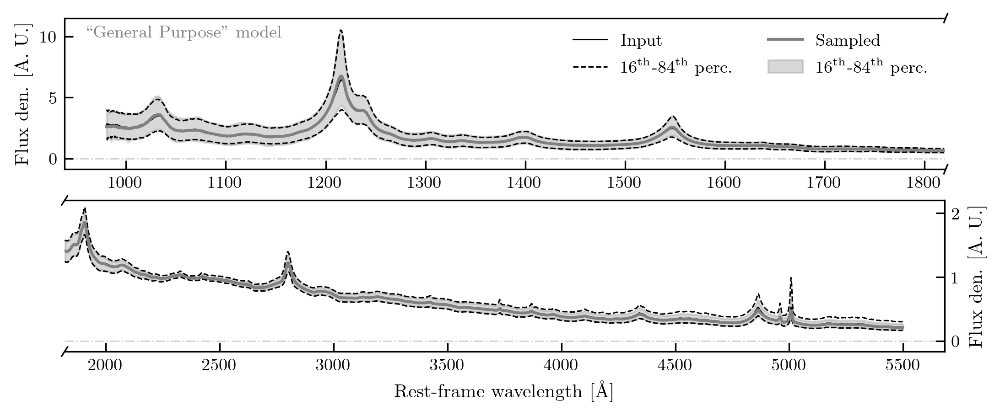

In [ ]:
fig = plots.init_single_ax_figure(
    preset="double_cols",
    only_fig=True,
    axis_ratio=2.5,
    dpi=300,
)

gs = GridSpec(2, 1, figure=fig)

ax_to = fig.add_subplot(gs[0])
ax_bo = fig.add_subplot(gs[1])

gqap.compare_sampled_input_paper(
    trained_model_GP.dispersion,
    # what a beast of a line
    valid_set_GP.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_GP,
    gmm_GP,
    main_color="grey",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_to,
    data_lims=(980, 1820),
    delta=-0.75,
    hide_xticks=False,
    show_x_labels=False,
)

gqap.compare_sampled_input_paper(
    trained_model_GP.dispersion,
    # still amazed by this
    valid_set_GP.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_GP,
    gmm_GP,
    main_color="grey",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_bo,
    data_lims=(1820, 5500),
    delta=0.0,
    hide_xticks=False,
    show_x_labels=False,
    make_legend=False,
)

# ================================================================ #

ax_to.set_xlim(ax_to.get_xlim()[0], 1820)
ax_bo.set_xlim(1820, ax_ct.get_xlim()[1])

# ================================================================ #

_top, _mult = 11.5, 7.5
ax_to.set_ylim(-_top / 100 * _mult, _top)
_top = 2.2
ax_bo.set_ylim(-_top / 100 * _mult, _top)

# ================================================================ #

# GP model
ax_to.spines[["right"]].set_visible(False)

ax_bo.tick_params(axis="y", labelleft=False, left=False, labelright=True, right=True)
ax_bo.yaxis.set_label_position("right")
ax_bo.spines[["left"]].set_visible(False)

# ================================================================ #

ax_to.text(
    0.025,
    0.875,
    r'``General Purpose" model',
    fontsize=9,
    transform=ax_to.transAxes,
    color="grey",
)

# ================================================================ #
# silines and axis breaks

d = 0.01
kwargs = dict(transform=ax_to.transAxes, color="k", clip_on=False, lw=0.8)

ax_to.plot((1.0025 - d / 3, 1 + d / 3), (-d * 3, +d * 3), **kwargs)
ax_to.plot((1.0025 - d / 3, 1 + d / 3), (1 - d * 3, 1 + d * 3), **kwargs)

kwargs.update(transform=ax_bo.transAxes)
ax_bo.plot((-d / 3, +d / 3), (1 - d * 3, 1 + d * 3), **kwargs)
ax_bo.plot((-d / 3, +d / 3), (-d * 3, +d * 3), **kwargs)

# ================================================================ #
# Spacing and final details

ax_bo.set_xlabel(r"Rest-frame wavelength [\AA]")

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.025, wspace=0.0)
fig.align_labels()

# fig.savefig(
#     project_path / "figures" / "sampled_vs_input_GP_only.png", bbox_inches="tight"
# )

plt.show()

QUEST.plots.qa_plots_paper - INFO: Passed an existing `ax` instance, ignoring `dpi` argument.
QUEST.plots.qa_plots_paper - INFO: Passed an existing `ax` instance, ignoring `dpi` argument.
QUEST.plots.qa_plots_paper - INFO: Passed an existing `ax` instance, ignoring `dpi` argument.


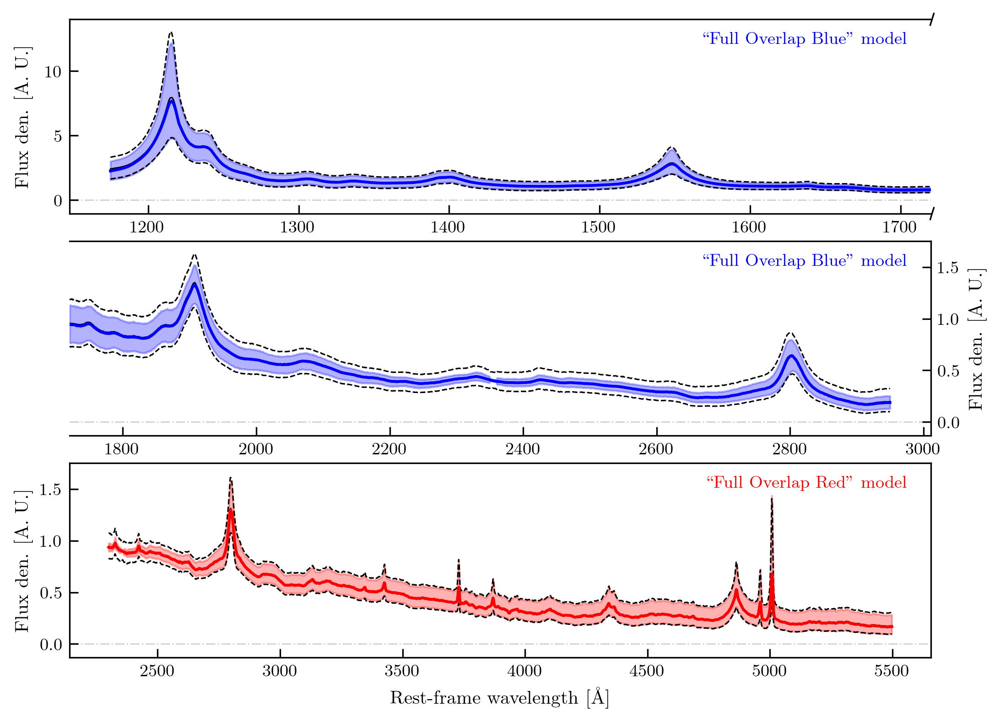

In [ ]:
fig = plots.init_single_ax_figure(
    preset="double_cols",
    only_fig=True,
    axis_ratio=1.4,
    dpi=300,
)

gs = GridSpec(3, 1, figure=fig)

ax_to = fig.add_subplot(gs[0])
ax_ce = fig.add_subplot(gs[1])
ax_bo = fig.add_subplot(gs[2])


gqap.compare_sampled_input_paper(
    trained_model_FOB.dispersion,
    valid_set_FOB.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_FOB,
    gmm_FOB,
    main_color="blue",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_to,
    delta=-0.75,
    hide_xticks=False,
    show_x_labels=False,
    make_legend=False,
    data_lims=(980, 1720),
)

gqap.compare_sampled_input_paper(
    trained_model_FOB.dispersion,
    valid_set_FOB.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_FOB,
    gmm_FOB,
    main_color="blue",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_ce,
    delta=-0.60,
    hide_xticks=False,
    show_x_labels=False,
    make_legend=False,
    data_lims=(1720, 5500),
)

gqap.compare_sampled_input_paper(
    trained_model_FOR.dispersion,
    # still amazed by this
    valid_set_FOR.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_FOR,
    gmm_FOR,
    main_color="red",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_bo,
    delta=-0.1,
    hide_xticks=False,
    show_x_labels=False,
    make_legend=False,
)

# ================================================================ #

ax_to.set_xlim(ax_to.get_xlim()[0], 1720)
ax_ce.set_xlim(1720, ax_cb.get_xlim()[1])

# ================================================================ #

_top, _mult = 14, 7.5
ax_to.set_ylim(-_top / 100 * _mult, _top)
_top = 1.75
ax_ce.set_ylim(-_top / 100 * _mult, _top)
_top = 1.75
ax_bo.set_ylim(-_top / 100 * _mult, _top)

# ================================================================ #

# FOB model
ax_to.spines[["right"]].set_visible(False)

ax_ce.tick_params(axis="y", labelleft=False, left=False, labelright=True, right=True)
ax_ce.yaxis.set_label_position("right")
ax_ce.spines[["left"]].set_visible(False)

# ================================================================ #

ax_to.text(
    0.975,
    0.875,
    r'``Full Overlap Blue" model',
    fontsize=9,
    # bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.5),
    transform=ax_to.transAxes,
    color="blue",
    ha="right",
)

ax_ce.text(
    0.975,
    0.875,
    r'``Full Overlap Blue" model',
    fontsize=9,
    # bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.5),
    transform=ax_ce.transAxes,
    color="blue",
    ha="right",
)

ax_bo.text(
    0.975,
    0.875,
    r'``Full Overlap Red" model',
    fontsize=9,
    # bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=0.5),
    transform=ax_bo.transAxes,
    color="red",
    ha="right",
)

# ================================================================ #
# silines and axis breaks

d = 0.01
kwargs = dict(transform=ax_to.transAxes, color="k", clip_on=False, lw=0.8)

ax_to.plot((1.0025 - d / 3, 1 + d / 3), (-d * 3, +d * 3), **kwargs)
ax_to.plot((1.0025 - d / 3, 1 + d / 3), (1 - d * 3, 1 + d * 3), **kwargs)

# ================================================================ #
# Spacing and final details

ax_bo.set_xlabel(r"Rest-frame wavelength [\AA]")

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.025, wspace=0.0)
fig.align_labels()

# fig.savefig(
#     project_path / "figures" / "sampled_vs_input_FOR_FOB.png", bbox_inches="tight"
# )

plt.show()

QUEST.plots.qa_plots_paper - INFO: Using the provided dataloader to compute the `ls_range`.
QUEST.plots.qa_plots_paper - INFO: Ignoring the provided `ls_range`.


QUEST.plots.qa_plots_paper - WARNING: `n_dims_to_plot` is not iterable, assuming it's an integer and computing the indexes. If you want to pass specific indeces, provide an iterable (e.g., a list or a numpy array). Values in use: 5, True


QUEST.plots.qa_plots_paper - INFO: Using the provided dataloader to compute the `ls_range`.
QUEST.plots.qa_plots_paper - INFO: Ignoring the provided `ls_range`.


QUEST.plots.qa_plots_paper - WARNING: `n_dims_to_plot` is not iterable, assuming it's an integer and computing the indexes. If you want to pass specific indeces, provide an iterable (e.g., a list or a numpy array). Values in use: 5, True


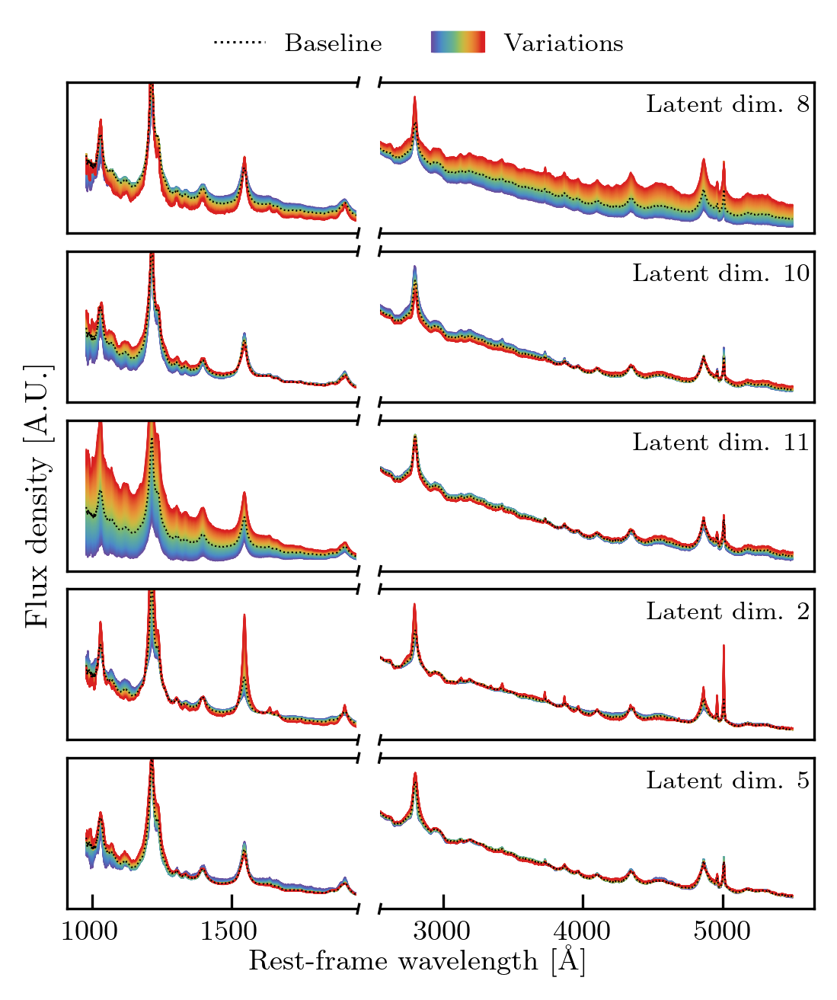

In [ ]:
# Due to size constrain, I am only plotting the first N dimensions, the ones with the largest variation
#  in latent space
N_DIMS_TO_PLOT = 5
SPLIT_W = 2350
SPLIT_W_LOW, SPLIT_W_HIGH = 1950, 2550
ADD_BASELINE = True

fig = plots.init_single_ax_figure(
    preset="single_col",
    only_fig=True,
    # axis_ratio=0.9,
    height=10,
    dpi=300,
)

gs_ratio = 1.5
gs = GridSpec(5, 2, figure=fig, width_ratios=[1, gs_ratio])

axs = []
axs.append(fig.add_subplot(gs[0, 0]))
axs.append(fig.add_subplot(gs[1, 0]))
axs.append(fig.add_subplot(gs[2, 0]))
axs.append(fig.add_subplot(gs[3, 0]))
axs.append(fig.add_subplot(gs[4, 0]))

axs.append(fig.add_subplot(gs[0, 1]))
axs.append(fig.add_subplot(gs[1, 1]))
axs.append(fig.add_subplot(gs[2, 1]))
axs.append(fig.add_subplot(gs[3, 1]))
axs.append(fig.add_subplot(gs[4, 1]))

# ====================================================== #

train_dataloder = torch.utils.data.DataLoader(
    train_set_GP,
    batch_size=128,
    shuffle=False,
)

gqap.plot_latent_space_dims(
    fig,
    axs[:5],
    trained_model_GP,
    100,
    N_DIMS_TO_PLOT,
    dataloader=train_dataloder,
    save=False,
    dpi=300,
    cmap=cmap,
    mask_=trained_model_GP.dispersion < SPLIT_W_LOW,
    ylim_func=lambda x: np.nanpercentile(x, 99),
    plot_baseline=ADD_BASELINE,
)

gqap.plot_latent_space_dims(
    fig,
    axs[5:],
    trained_model_GP,
    100,
    N_DIMS_TO_PLOT,
    dataloader=train_dataloder,
    save=False,
    dpi=300,
    cmap=cmap,
    mask_=trained_model_GP.dispersion > SPLIT_W_HIGH,
    add_ld_text=True,
    text_alignment="right",
    plot_baseline=ADD_BASELINE,
)

# ====================================================== #
frac_ = 0.05
d = 0.01
kwargs = dict(transform=ax_to.transAxes, color="k", clip_on=False, lw=0.8)

for _ in axs:
    _.tick_params(bottom=False, labelbottom=False)
    # _.set_ylim(-0.05, 0.6)
    # _.axhline(0.0, color="lightgrey", lw=1, zorder=-2, ls = "--")


for _ in axs[:5]:
    _.tick_params(axis="y", which="both", labelleft=False, left=False)
    _.set_xlim(
        trained_model_GP.dispersion.min()
        - (SPLIT_W - trained_model_GP.dispersion.min()) * frac_,
        SPLIT_W_LOW,
    )
    _.spines[["right"]].set_visible(False)

    kwargs.update(transform=_.transAxes)
    _.plot((1.005 - d / 3, 1.005 + d / 3), (-d * 3, +d * 3), **kwargs)
    _.plot((1.005 - d / 3, 1.005 + d / 3), (1 - d * 3, 1 + d * 3), **kwargs)

for _ in axs[5:]:
    _.tick_params(axis="y", which="both", labelleft=False, left=False)
    _.set_xlim(
        SPLIT_W_HIGH, trained_model_GP.dispersion.max() * (1 + frac_) - SPLIT_W * frac_
    )
    _.spines[["left"]].set_visible(False)

    kwargs.update(transform=_.transAxes)
    _.plot((0 - d / 3 / gs_ratio, d / 3 / gs_ratio), (-d * 3, d * 3), **kwargs)
    _.plot((0 - d / 3 / gs_ratio, d / 3 / gs_ratio), (1 - d * 3, 1 + d * 3), **kwargs)

axs[4].tick_params(bottom=True, labelbottom=True)
axs[9].tick_params(bottom=True, labelbottom=True)

# ====================================================== #

# make figure legend if you add the baseline
if ADD_BASELINE:
    baseline_line = Line2D([], [], color="k", label="Baseline", lw=0.75, ls=":")

    variation_patch_colors = cmap(np.linspace(0, 1, 100))
    variation_patch = [
        [
            Patch(facecolor=c, edgecolor=c, label="Variations")
            for c in variation_patch_colors
        ]
    ]
    # variation_patch = Patch(color="lightgrey", edgecolor="none", label="Variations")
    handlers = [baseline_line, variation_patch]
    labels = ["Baseline", "Variations"]

    legend = fig.legend(
        handles=handlers,
        labels=labels,
        handler_map={list: HandlerTuple(ndivide=None, pad=0)},
        loc="outside upper center",
        bbox_to_anchor=(0.5, 1.075),
        ncol=2,
        frameon=False,
        fontsize=8,
    )
    legend.get_frame().set_alpha(1.0)

fig.supxlabel(r"Rest-frame wavelength [\AA]")
axs[2].set_ylabel(r"Flux density [A.U.]")

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.05, wspace=0.05)
fig.align_labels()

# if ADD_BASELINE:
#     fig.savefig(
#         project_path / "figures" / "latent_space_variations_GP_with_baseline.png",
#         bbox_inches="tight",
#     )
# else:
#     fig.savefig(
#         project_path / "figures" / "latent_space_variations_GP_no_baseline.png",
#         bbox_inches="tight",
#     )

plt.show()

QUEST.plots.qa_plots_paper - INFO: Using the provided dataloader to compute the `ls_range`.
QUEST.plots.qa_plots_paper - INFO: Ignoring the provided `ls_range`.
QUEST.plots.qa_plots_paper - INFO: Using the provided dataloader to compute the `ls_range`.
QUEST.plots.qa_plots_paper - INFO: Ignoring the provided `ls_range`.
QUEST.plots.qa_plots_paper - INFO: Using the provided dataloader to compute the `ls_range`.
QUEST.plots.qa_plots_paper - INFO: Ignoring the provided `ls_range`.
QUEST.plots.qa_plots_paper - INFO: Using the provided dataloader to compute the `ls_range`.
QUEST.plots.qa_plots_paper - INFO: Ignoring the provided `ls_range`.


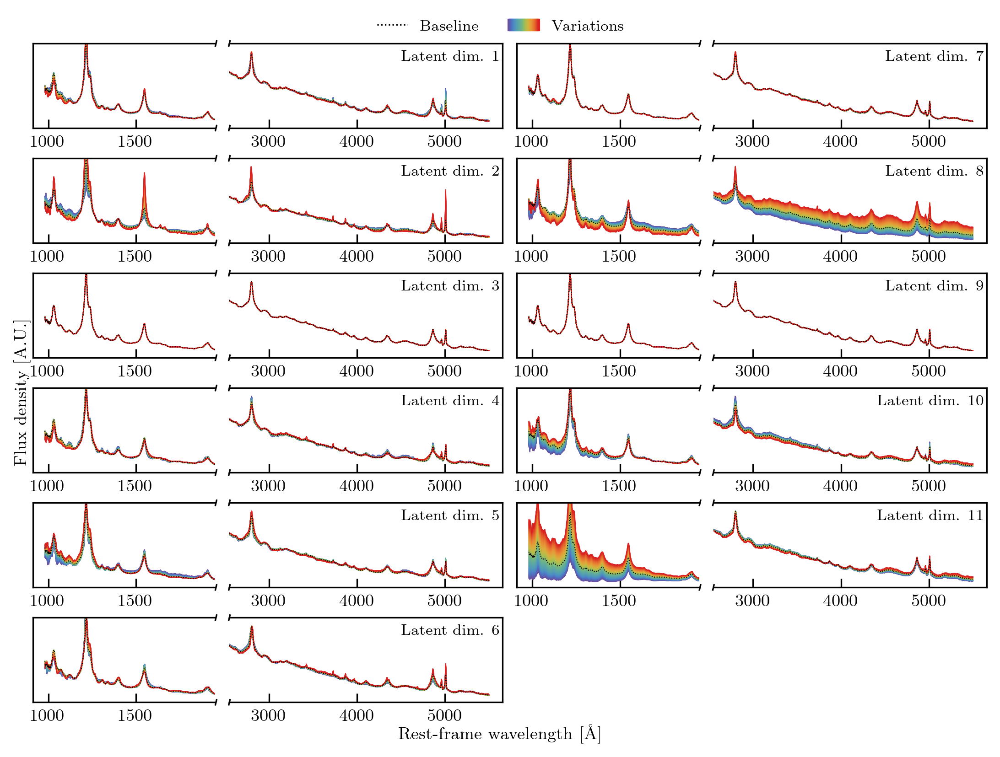

In [ ]:
# Same as before, but plot all dimensions for appendix
fig = plots.init_single_ax_figure(
    width=18.0,  # This is double col
    height=13.0,
    only_fig=True,
    dpi=300,
)

gs_ratio = 1.5
gs = GridSpec(6, 4, figure=fig, width_ratios=[1, gs_ratio, 1, gs_ratio])

axs = []
for i in range(4):
    for j in range(6):
        axs.append(fig.add_subplot(gs[j, i]))

# ====================================================== #

train_dataloder = torch.utils.data.DataLoader(
    train_set_GP,
    batch_size=128,
    shuffle=False,
)

gqap.plot_latent_space_dims(
    fig,
    axs[:6],
    trained_model_GP,
    100,
    np.arange(6),  # n_dims_to_plot, here we want them all but split in two sets
    dataloader=train_dataloder,
    save=False,
    dpi=300,
    cmap=cmap,
    mask_=trained_model_GP.dispersion < SPLIT_W_LOW,
    ylim_func=lambda x: np.nanpercentile(x, 99),
    sort_by_max_variation=False,
    plot_baseline=ADD_BASELINE,
)

gqap.plot_latent_space_dims(
    fig,
    axs[6:12],
    trained_model_GP,
    100,
    np.arange(6),  # n_dims_to_plot, here we want them all but split in two sets
    dataloader=train_dataloder,
    save=False,
    dpi=300,
    cmap=cmap,
    mask_=trained_model_GP.dispersion > SPLIT_W_HIGH,
    add_ld_text=True,
    text_alignment="right",
    plot_baseline=ADD_BASELINE,
)

gqap.plot_latent_space_dims(
    fig,
    axs[12:18],
    trained_model_GP,
    100,
    np.arange(6, 11),  # n_dims_to_plot, here we want them all but split in two sets
    dataloader=train_dataloder,
    save=False,
    dpi=300,
    cmap=cmap,
    mask_=trained_model_GP.dispersion < SPLIT_W_LOW,
    ylim_func=lambda x: np.nanpercentile(x, 99),
    plot_baseline=ADD_BASELINE,
)

gqap.plot_latent_space_dims(
    fig,
    axs[18:],
    trained_model_GP,
    100,
    np.arange(6, 11),  # n_dims_to_plot, here we want them all but split in two sets
    dataloader=train_dataloder,
    save=False,
    dpi=300,
    cmap=cmap,
    mask_=trained_model_GP.dispersion > SPLIT_W_HIGH,
    add_ld_text=True,
    text_alignment="right",
    plot_baseline=ADD_BASELINE,
)

# ====================================================== #

frac_ = 0.05
d = 0.01
kwargs = dict(transform=ax_to.transAxes, color="k", clip_on=False, lw=0.8)

for _ in axs:
    _.tick_params(bottom=False, labelbottom=False)
    # _.set_ylim(-0.05, 0.6)
    # _.axhline(0.0, color="lightgrey", lw=1, zorder=-2, ls = "--")


for __ in [axs[:6], axs[12:18]]:
    for _ in __:
        _.tick_params(axis="y", which="both", labelleft=False, left=False)
        _.set_xlim(
            trained_model_GP.dispersion.min()
            - (SPLIT_W - trained_model_GP.dispersion.min()) * frac_,
            SPLIT_W_LOW,
        )
        _.spines[["right"]].set_visible(False)

        kwargs.update(transform=_.transAxes)
        _.plot((1.005 - d / 3, 1.005 + d / 3), (-d * 3, +d * 3), **kwargs)
        _.plot((1.005 - d / 3, 1.005 + d / 3), (1 - d * 3, 1 + d * 3), **kwargs)

for __ in [axs[6:12], axs[18:]]:
    for _ in __:
        _.tick_params(axis="y", which="both", labelleft=False, left=False)
        _.set_xlim(
            SPLIT_W_HIGH,
            trained_model_GP.dispersion.max() * (1 + frac_) - SPLIT_W * frac_,
        )
        _.spines[["left"]].set_visible(False)

        kwargs.update(transform=_.transAxes)
        _.plot((0 - d / 3 / gs_ratio, d / 3 / gs_ratio), (-d * 3, d * 3), **kwargs)
        _.plot(
            (0 - d / 3 / gs_ratio, d / 3 / gs_ratio), (1 - d * 3, 1 + d * 3), **kwargs
        )

for _ in axs:
    _.tick_params(bottom=True, labelbottom=True)
    _.tick_params(bottom=True, labelbottom=True)
    _.tick_params(bottom=True, labelbottom=True)
    _.tick_params(bottom=True, labelbottom=True)

axs[-7].remove()
axs[-1].remove()

# ====================================================== #

if ADD_BASELINE:
    baseline_line = Line2D([], [], color="k", label="Baseline", lw=0.75, ls=":")

    variation_patch_colors = cmap(np.linspace(0, 1, 100))
    variation_patch = [
        [
            Patch(facecolor=c, edgecolor=c, label="Variations")
            for c in variation_patch_colors
        ]
    ]
    # variation_patch = Patch(color="lightgrey", edgecolor="none", label="Variations")
    handlers = [baseline_line, variation_patch]
    labels = ["Baseline", "Variations"]

    legend = fig.legend(
        handles=handlers,
        labels=labels,
        handler_map={list: HandlerTuple(ndivide=None, pad=0)},
        loc="outside upper center",
        bbox_to_anchor=(0.5, 1.05),
        ncol=2,
        frameon=False,
        fontsize=8,
    )
    legend.get_frame().set_alpha(1.0)

fig.supxlabel(r"Rest-frame wavelength [\AA]")
fig.supylabel(r"Flux density [A.U.]")

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.05, wspace=0.05)
fig.align_labels()

# fig.savefig(
#     project_path / "figures" / "latent_space_variations_GP_all.png",
#     bbox_inches="tight",
# )

plt.show()

In [29]:
# ================================================================ #
# Make spectra and reconstruction to be shown in the preview/model #
#                             schematic                            #
# ================================================================ #


def plot_spec_and_gpm(
    i, ax, dispersion, flux, gpm, flux_inds, leave_bottom_labels=True
):
    flux_i = flux[flux_inds[i]]
    flux_i[np.isnan(flux_i)] = 0
    gpm_i = gpm[flux_inds[i]]

    ax[i, 0].plot(dispersion, flux_i / np.nanmax(flux_i), color="blue", lw=0.75)
    ax[i, 1].plot(dispersion, gpm_i, color="red", lw=0.75)

    for ax in [ax[i, 0], ax[i, 1]]:
        ax.tick_params(axis="both", which="both", left=False, labelleft=False)
        ax.axhline(
            0.0,
            c="lightgrey",
            lw=0.5,
            ls="--",
            zorder=-1,
        )
        ax.set_ylim(-0.1, 1.2)
        if not leave_bottom_labels:
            ax.tick_params(axis="x", which="both", labelbottom=False)


# ================================================================ #


def plot_empty(i, ax, *args, **kwargs):
    ax[i, 0].text(
        0.5,
        0.5,
        "All spectra",
        ha="center",
        va="center",
        transform=ax[i, 0].transAxes,
    )
    ax[i, 1].text(
        0.5,
        0.5,
        "All GPMs",
        ha="center",
        va="center",
        transform=ax[i, 1].transAxes,
    )

    for ax in [ax[i, 0], ax[i, 1]]:
        ax.tick_params(axis="both", which="both", left=False, labelleft=False)
        ax.set_ylim(-0.1, 1.2)


# ================================================================ #


def plot_reconstructed(ax, dispersion, flux, no_conn_patches=False, **kwargs):
    x1, x2, y1, y2 = 2000, 5250, 0.1, 1.55

    axin = ax.inset_axes(
        [0.2985, 0.425, 0.675, 0.525],
        xlim=(x1, x2),
        ylim=(y1, y2),
        yticklabels=[],
    )
    axin.patch.set_alpha(0.0)
    # ax.indicate_inset_zoom(axin, edgecolor="black", lw=0.5)

    if not no_conn_patches:
        rect = (x1, y1, x2 - x1, y2 - y1)
        box = ax.indicate_inset(rect, edgecolor="black", lw=1.0, zorder=-10)

        cp1 = ConnectionPatch(
            xyA=(x1, y2),
            xyB=(0, 0),
            axesA=ax,
            axesB=axin,
            coordsA="data",
            coordsB="axes fraction",
            lw=0.75,
            ls="--",
            zorder=-10,
        )
        cp2 = ConnectionPatch(
            xyA=(x2, y2),
            xyB=(1, 0),
            axesA=ax,
            axesB=axin,
            coordsA="data",
            coordsB="axes fraction",
            lw=0.75,
            ls="--",
            zorder=-10,
        )

        ax.add_patch(cp1)
        ax.add_patch(cp2)

    for spine_side in ["bottom", "left", "right", "top"]:
        axin.spines[spine_side].set_linewidth(0.75)

    for _ax in [ax, axin]:
        _ax.tick_params(
            axis="both",
            which="both",
            left=False,
            labelleft=False,
            bottom=False,
            labelbottom=False,
        )
        _ax.step(dispersion, flux, **kwargs)
        _ax.axhline(
            0.0,
            c="lightgrey",
            lw=0.5,
            ls="--",
            zorder=-1,
        )


# ================================================================ #

# make pieces of plot to be assembled for the VAE
dispersion = train_set_GP.dataset.dispersion
flux = train_set_GP.dataset[train_set_GP.indices][:, 0, :].detach().cpu().numpy()
gpm = train_set_GP.dataset[train_set_GP.indices][:, 1, :].detach().cpu().numpy()

# ================================================================ #
# ================================================================ #
# ================================================================ #

# remake the dataloader for the reconstruction
train_dataloder = torch.utils.data.DataLoader(
    train_set_GP,
    batch_size=128,
    shuffle=False,
)

reconstructed = (
    trained_model_GP.reconstruct_all(train_dataloder)["reconstruction"]
    .detach()
    .cpu()
    .numpy()
)

100%|██████████| 129/129 [01:16<00:00,  1.69it/s]


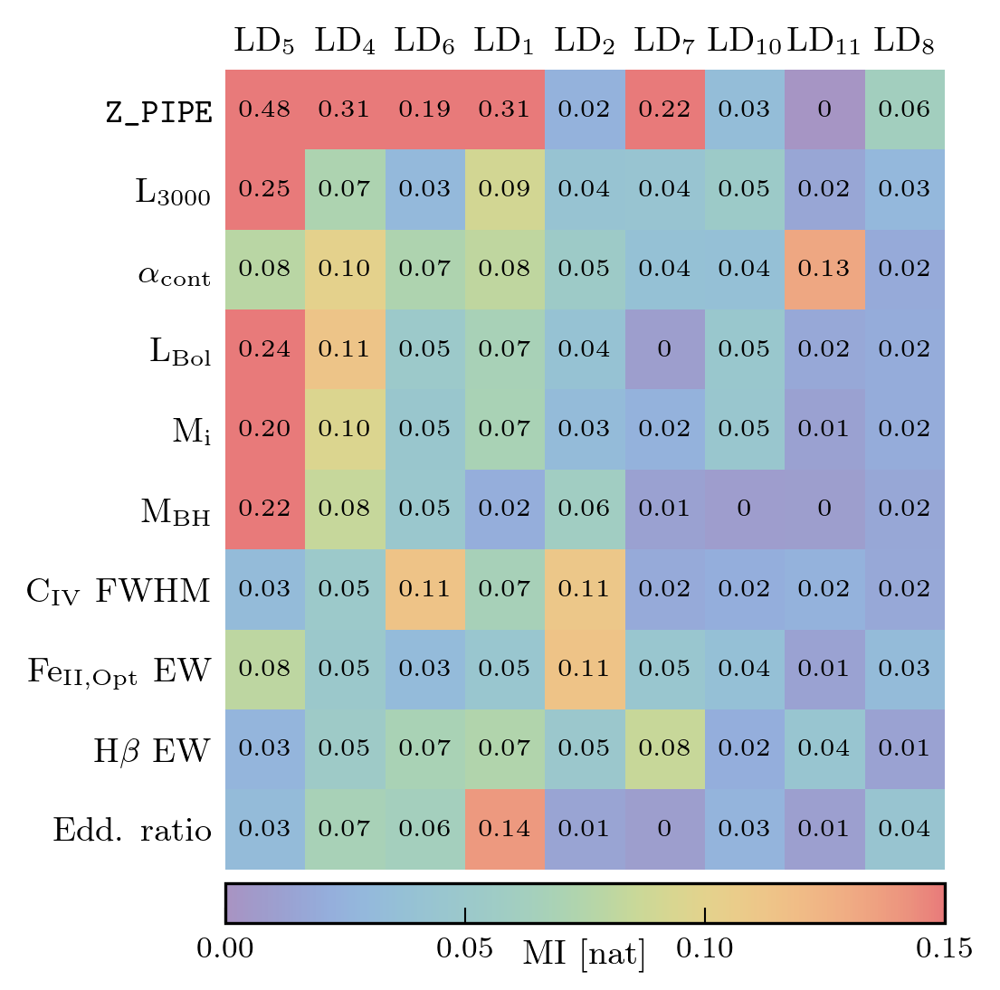

In [59]:
# plot the mutual infomation from GMMMI
# Load the model for GP
from gmm_mi.utils.plotting import annotate_heatmap, create_heatmap

json_path_ = Path.home() / "VAE_QA" / "best" / "GP" / "InfoSpecVAE"

gmm_res_dir = json_path_ / "GMM-MI20250710_193309p18"
gmm_fig_dir = gmm_res_dir / "figures"
gmm_res_fname = gmm_res_dir / "GMM-MI_out.npy"

# add information regarding z_pipe
gmm_res_zpipe_fname = (
    Path.home()
    / "VAE_QA"
    / "best"
    / "GP"
    / "InfoSpecVAE"
    / "GMM-MI20250921_180030p39"
    / "GMM-MI_out_only_z_pipe.npy"
)

MI_value_zpipe = np.load(gmm_res_zpipe_fname)[:, :, 0]

# Load and fix the x_labels - took way too long to figure this out...
x_labels, x_labels_tmp = np.load(gmm_res_fname.with_name("GMM-MI_out_xlabels.npy")), []
for i, label in enumerate(x_labels):
    ld_num = label.split("_")[1][:-1]

    # Use consistent names and latex formatting
    x_labels_tmp.append(r"LD$_{" + ld_num + r"}$")

    # if len(ld_num) > 1:
    #     string_example = r"LD$_{" + ld_num + r"}$"
    #     x_labels_tmp.append(string_example)  # label.replace(ld_num, "{" + ld_num + "}")
    # else:
    #     x_labels_tmp.append(x_labels[i].replace("z", "LD"))

x_labels = np.array(x_labels_tmp)
x_labels

# load y labels
y_labels = np.load(gmm_res_fname.with_name("GMM-MI_out_ylabels.npy"))

MI_values = np.load(gmm_res_fname)[:, :, 0]

# add the z_pipe information as an extra row
MI_values = np.vstack([MI_values, MI_value_zpipe])
y_labels = np.append(y_labels, "z_pipe")

# set negative values back to zero
MI_values[MI_values < 0] = 0.0

threshold_feature = np.max(MI_values) / 2

# get once again the first N_DIMS_TO_PLOT in terms of overall MI
inds_to_keep = np.argsort(np.sum(MI_values, axis=0))[::-1][:-2]  # [:N_DIMS_TO_PLOT]
MI_values = MI_values[:, inds_to_keep]
x_labels = x_labels[inds_to_keep]

# also remove properties below a certain threshold, or the first 10
inds_to_keep = np.argsort(np.sum(MI_values, axis=1))[::-1][:10]
MI_values = MI_values[inds_to_keep, :]
y_labels = y_labels[inds_to_keep]

# inds_to_keep = np.where(np.sum(MI_values, axis=1) > threshold_feature)[0]
# MI_values = MI_values[inds_to_keep, :]
# y_labels = y_labels[inds_to_keep]

# uncomment if you want the labels to start from 0
# x_labels = [i.split("_")[0] + "_" + str(int(i.split("_")[1][:-1]) - 1) + "$" for i in x_labels]

# these are the first 10
y_labels_fmt = [
    r"$\texttt{Z_PIPE}$",
    r"L$_{3000}$",
    r"$\alpha_{\rm cont}$",
    r"L$_{\rm Bol}$",
    r"M$_{\rm i}$",
    r"M$_{\rm BH}$",
    r"C$_{\rm IV}$ FWHM",
    r"Fe$_{\rm II, Opt}$ EW",
    r"H$\beta$ EW",
    r"Edd. ratio",
    # r"H${\beta}$ L. Lum",
]

# make the plot, with some adjustments
fig, ax = fig = plots.init_single_ax_figure(
    preset="single_col",
    axis_ratio=0.9,
    dpi=300,
)

im, cbar = create_heatmap(
    MI_values,
    y_labels_fmt,
    x_labels,
    cmap=cmap,
    cbarlabel="MI [nat]",
    alpha=0.6,
    fsize=9,
    ax=ax,
    vmin=0,
    vmax=0.15,
    cbar_kw={
        "orientation": "horizontal",
    },
)
cbar.set_ticks([0, 0.05, 0.1, 0.15])
cbar.solids.set_alpha = 1
cbar.ax.yaxis.set_label_coords(0.5, -1.25)

texts = annotate_heatmap(
    im,
    valfmt="{x:.2f}",
    save_fig=True,
    save_path=project_path / "figures" / "MI_GP.pdf",
    fontsize=6.5,
)

ax.tick_params(top=False, left=False)

plt.savefig(project_path / "figures" / "MI_GP.pdf", bbox_inches="tight")
plt.show()

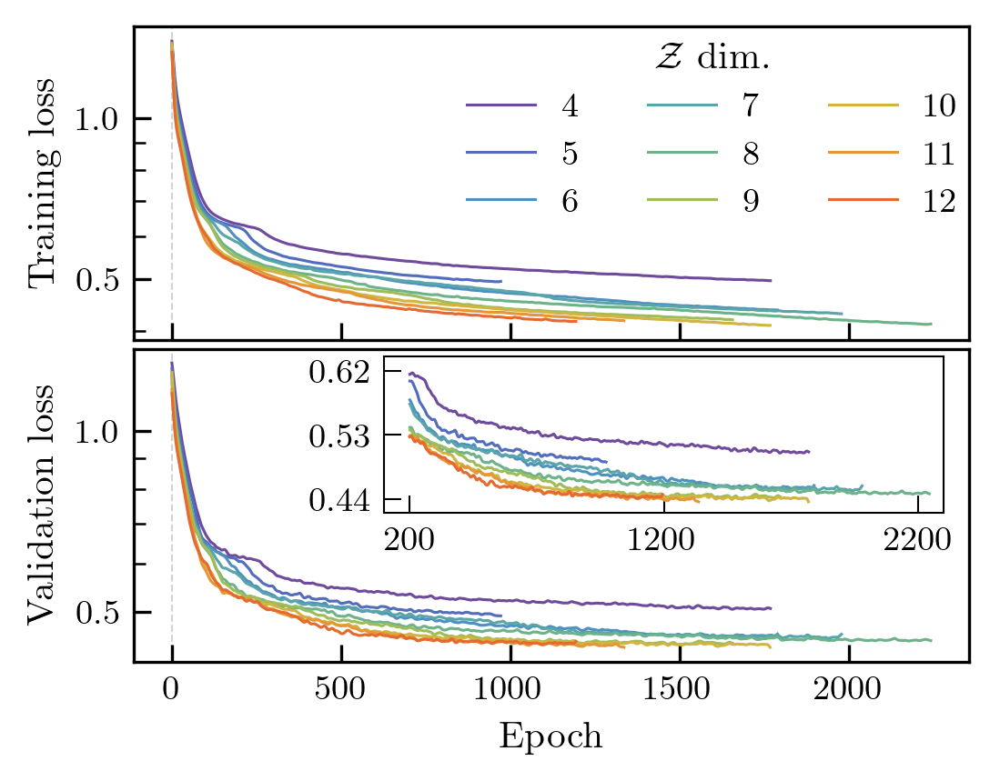

In [ ]:
base_dir = Path.home() / "VAE_QA" / "from_server_GP"
timestamps = [
    "20250508_043826p81",
    "20250508_163915p63",
    "20250509_042019p65",
    "20250509_153014p97",
    "20250510_022200p14",
    "20250510_140624p01",
    "20250511_020829p35",
    "20250511_133206p05",
    "20250512_003044p57",
]

# make plot to visualise the training
fig = plots.init_single_ax_figure(
    preset="single_col",
    dpi=300,
    axis_ratio=1.3,
    only_fig=True,
)

ax_top = fig.add_subplot(2, 1, 1)
ax_bottom = fig.add_subplot(2, 1, 2, sharex=ax_top)

for n, fld in enumerate(timestamps):
    train_loss = pd.read_csv(base_dir / fld / "InfoSpecVAE" / "loss_history.csv")[
        "reconstruction_loss"
    ].values * (n + 4)

    valid_loss = pd.read_csv(
        base_dir / fld / "InfoSpecVAE" / "loss_history_val.csv"
    ).values * (n + 4)

    train_loss = convolve(
        train_loss[train_loss != 0], convolve_kernel, boundary="extend"
    )

    valid_loss = convolve(
        valid_loss[valid_loss != 0], convolve_kernel, boundary="extend"
    )

    ax_top.plot(train_loss, lw=0.75, c=cmap(n / len(timestamps)), label=(n + 4))
    ax_bottom.plot(valid_loss, lw=0.75, c=cmap(n / len(timestamps)), label=(n + 4))


for _ in (ax_top, ax_bottom):
    _.set_yscale("log")
    _.yaxis.set_major_formatter(ticker.ScalarFormatter())
    _.tick_params(axis="y", which="minor", labelleft=False)
    _.set_yticks((0.5, 1.0))
    _.axvline(
        0,
        color="lightgrey",
        lw=0.5,
        ls="--",
        label="_Training start",
        zorder=-10,
    )


# Inset axis after we've done everything
x_left_inset, x_right_inset, y_bottom_inset, y_top_inset = (
    100,
    2300,
    0.42,
    0.64,
)

ax_inset = ax_bottom.inset_axes(
    [0.3, 0.475, 0.67, 0.5],
    xlim=(x_left_inset, x_right_inset),
    ylim=(y_bottom_inset, y_top_inset),
    yticklabels=[],
)

for n, fld in enumerate(timestamps):
    valid_loss = pd.read_csv(
        base_dir / fld / "InfoSpecVAE" / "loss_history_val.csv"
    ).values * (n + 4)

    valid_loss = convolve(
        valid_loss[valid_loss != 0], convolve_kernel, boundary="extend"
    )

    valid_loss[:200] = np.nan

    ax_inset.plot(
        np.arange(len(valid_loss)),
        valid_loss,
        lw=0.75,
        c=cmap(n / len(timestamps)),
        label=(n + 4),
    )

# ax_inset.set_yscale("log")
ax_inset.yaxis.set_major_formatter(ticker.ScalarFormatter())
# ax_inset.yaxis.set_minor_formatter(ticker.ScalarFormatter())
# ax_inset.tick_params(axis="y", which="minor", labelleft=False)
ax_inset.set_yticks((0.44, 0.53, 0.62))
ax_inset.set_xticks((200, 1200, 2200))


# labels and stuff
ax_top.set_ylabel("Training loss")
ax_top.tick_params(axis="x", which="both", labelbottom=False)

ax_bottom.set_xlabel("Epoch")
ax_bottom.set_ylabel("Validation loss")

ax_inset.xaxis.set_tick_params(width=0.5)
ax_inset.yaxis.set_tick_params(width=0.5)
for _ in ax_inset.spines.values():
    _.set_linewidth(0.5)

ax_top.legend(
    ncol=3,
    title=r"$\mathcal{Z}$ dim.",
    loc="upper right",
    frameon=False,
    bbox_to_anchor=(1.0256, 1.05),
)

# ax_bottom.indicate_inset_zoom(ax_inset, edgecolor="grey", lw = 0.5)

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.025, wspace=0.0)
# fig.savefig(
#     project_path / "figures" / "training_validation_loss_inset.png", bbox_inches="tight"
# )


plt.show()

In [73]:
# see if you can plot the median for the objects in the tail for dim 7
def get_object_from_tail(model, dataloader, plot=False):
    model.eval()

    z = model.latent_space_posterior(
        dataloader,
        random_mask_flag=False,
        coverage_mask_flag=False,
    )["z"]

    mask = (z[:, 6] > 1.2) & (z[:, 7] > 2.5)

    if plot:
        fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=200)
        ax.scatter(z[:, 6], z[:, 7])
        ax.scatter(z[:, 6][mask], z[:, 7][mask])
        plt.show()

    spectra_mask = (
        dataloader.dataset.dataset.input[dataloader.dataset.indices, 0, :][mask]
        .detach()
        .cpu()
        .numpy()
    )

    spectra_non_mask = (
        dataloader.dataset.dataset.input[dataloader.dataset.indices, 0, :][~mask]
        .detach()
        .cpu()
        .numpy()
    )

    for sp in spectra_mask, spectra_non_mask:
        sp[sp == 0.0] = np.nan

    dispersion = train_dataloder.dataset.dataset.dispersion

    return dispersion, spectra_mask, spectra_non_mask, z, mask


# ============================================================================= #


def get_object_from_blob(model, dataloader, plot=False):
    model.eval()

    z = model.latent_space_posterior(
        dataloader,
        random_mask_flag=False,
        coverage_mask_flag=False,
    )["z"]

    mask = (
        (-z[:, 4] + z[:, 0] > 0.0)
        & (-z[:, 4] + z[:, 0] < 1.0)
        & (z[:, 4] + z[:, 0] < -0.9)
        & (z[:, 4] + z[:, 0] > -2.0)
    )

    if plot:
        fig, ax = plt.subplots(1, 1, figsize=(4, 4), dpi=200)
        ax.scatter(z[:, 0], z[:, 4], alpha=0.01)
        ax.scatter(z[:, 0][mask], z[:, 4][mask], alpha=0.01)
        plt.show()

    spectra_mask = (
        dataloader.dataset.dataset.input[dataloader.dataset.indices, 0, :][mask]
        .detach()
        .cpu()
        .numpy()
    )

    spectra_non_mask = (
        dataloader.dataset.dataset.input[dataloader.dataset.indices, 0, :][~mask]
        .detach()
        .cpu()
        .numpy()
    )

    for sp in spectra_mask, spectra_non_mask:
        sp[sp == 0.0] = np.nan

    dispersion = train_dataloder.dataset.dataset.dispersion

    return dispersion, spectra_mask, spectra_non_mask, z, mask


# ============================================================================= #


tail = get_object_from_tail(trained_model_GP, train_dataloder)
blob = get_object_from_blob(trained_model_GP, train_dataloder)

py.warnings - WARNING: /Users/francesco/uvp/QUEST/.venv/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(

py.warnings - WARNING: /Users/francesco/uvp/QUEST/.venv/lib/python3.12/site-packages/numpy/lib/_nanfunctions_impl.py:1217: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a, func=_nanmedian, keepdims=keepdims,

py.warnings - WARNING: /var/folders/rm/h1prb1710t70p18xbdxx9s740000gn/T/ipykernel_1710/338440989.py:100: RuntimeWarning: All-NaN slice encountered
  np.nanmedian(tail[1], axis=0),



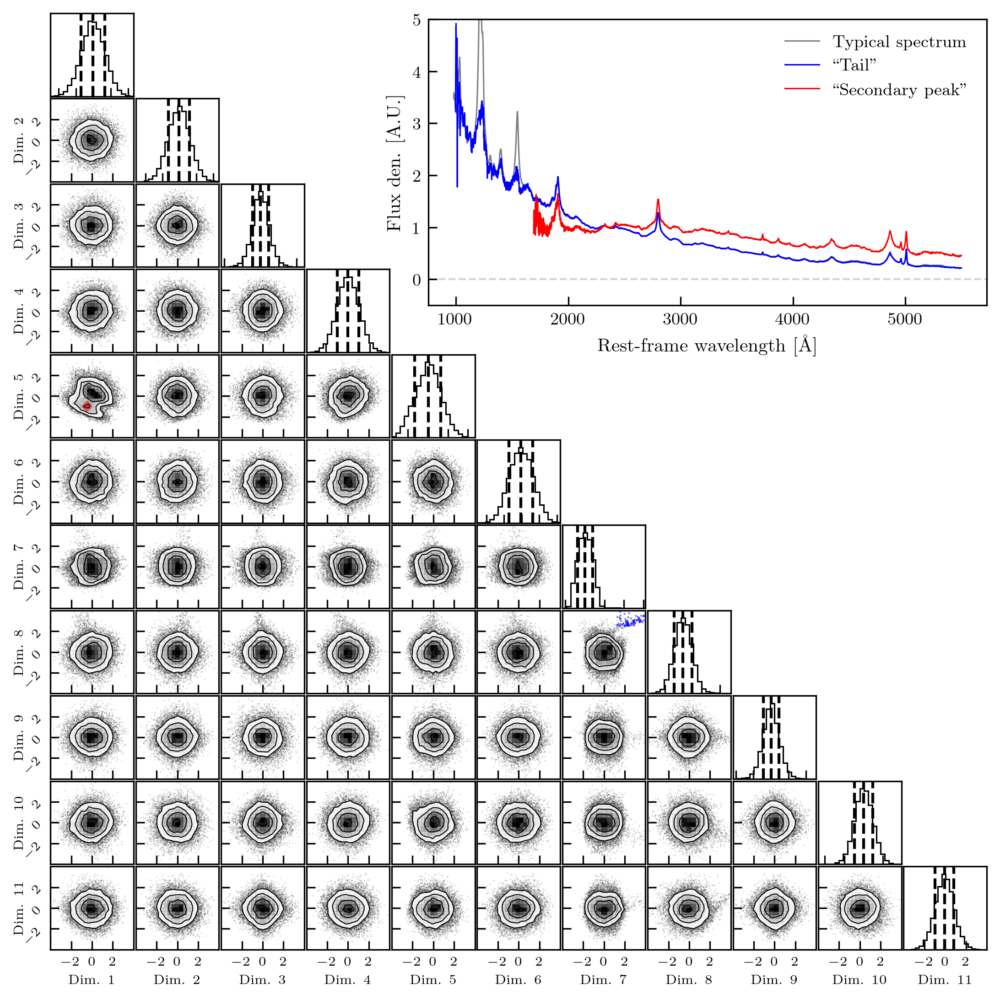

In [ ]:
# corner plot for the best model, + decoded spectra on top
fig = plots.init_single_ax_figure(
    preset="double_cols",
    dpi=300,
    axis_ratio=1.0,
    only_fig=True,
    layout="constrained",  # None, "constrained"
)

# plt.close()
# fig = plt.figure(figsize=(15, 15), dpi=300)

train_dataloder = torch.utils.data.DataLoader(
    train_set_GP,
    batch_size=128,
    shuffle=False,
)

custom_labelsize = 7
gqap.plot_latent_space_corner(
    fig,
    trained_model_GP,
    dataloader=train_dataloder,
    save=False,
    save_dir=project_path / "figures",
    save_name="latent_space_dims_corner.png",
    random_mask_flag=False,
    coverage_mask_flag=False,
    title_kwargs=dict(
        fontsize=custom_labelsize,
    ),
    label_kwargs=dict(
        fontsize=custom_labelsize,
    ),
    data_kwargs=dict(
        alpha=0.15,
        ms=0.75,
    ),
    contour_kwargs=dict(
        linewidths=0.5,
    ),
)


all_axes = fig.get_axes()
for n, _ in enumerate(all_axes):
    if n % 11 == n // 11:
        _.set_title("")
        continue

    if n // 11 < (n % 11) + 1:
        continue

    _.tick_params(axis="both", which="both", labelsize=custom_labelsize)
    _.tick_params(axis="x", which="both", labelrotation=0)
    _.set_xlabel(_.get_xlabel(), fontsize=custom_labelsize)
    _.set_ylabel(_.get_ylabel(), fontsize=custom_labelsize)

    # no comment on this bunch of code to make sure the title does not
    #  break things, otherwise it would probably break some funding rule
    # I wish I knew more Python to make this cleaner and avoid this
    #  terrible spaghetti code

    _.set_xlim(-4, 4)
    _.set_ylim(-4, 4)
    _.set_xticks((-2, 0, 2))
    _.set_yticks((-2, 0, 2))

_.tick_params(axis="both", which="both", labelsize=custom_labelsize)
_.tick_params(axis="x", which="both", labelrotation=0)
_.set_xlabel(_.get_xlabel(), fontsize=custom_labelsize)
_.set_ylabel(_.get_ylabel(), fontsize=custom_labelsize)
_.set_xlim(-4, 4)
_.set_xticks((-2, 0, 2))

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.025, wspace=0.025)

#  surely not the intended usage, but it works
# subfig = fig.subfigures(2, 2, width_ratios=(0.45, 1), height_ratios=(0.8, 2.0))
subfig = fig.subfigures(2, 2, width_ratios=(0.6, 1), height_ratios=(1.11, 2.0))
ax_subfig = subfig[0, 1].subplots(1, 1)

# blob, top panel
ax_subfig.plot(
    blob[0],
    np.nanmedian(blob[2], axis=0),
    lw=0.75,
    color="grey",
    label=r"Typical spectrum",
)
ax_subfig.plot(
    blob[0],
    np.nanmedian(blob[1], axis=0),
    lw=0.75,
    color="b",
    label=r'``Tail"',
)
ax_subfig.plot(
    tail[0],
    np.nanmedian(tail[1], axis=0),
    lw=0.75,
    color="r",
    label=r'``Secondary peak"',
)

ax_subfig.axhline(0.0, color="lightgrey", lw=1, zorder=-2, ls="--")
ax_subfig.set_ylim(-0.5, 5.0)

ax_subfig.set_xlabel(r"Rest-frame wavelength [\AA]")
ax_subfig.set_ylabel(r"Flux den. [A.U.]")
ax_subfig.legend(
    loc="upper right",
    ncol=1,
    fontsize=9,
    frameon=False,
    bbox_to_anchor=(1.0, 1.0),
)

# tail and blob mask
tail_mask = tail[-1]
# mask = (z[:, 6] > 1.5) & (z[:, 7] > 2.0)
blob_mask = blob[-1]
# mask = ((-z[:, 4] + z[:, 0] > 0.0) & (-z[:, 4] + z[:, 0] < 1.0) & (z[:, 4] + z[:, 0] < -0.75) & (z[:, 4] + z[:, 0] > -2.0))

# axes are 44 (blob) and 83 (tail)
all_axes[44].scatter(
    blob[-2][blob[-1], 0],
    blob[-2][blob[-1], 4],
    s=1.0,
    c="r",
    edgecolor="none",
    alpha=0.015,
    label="_Blob mask",
    zorder=100,
)

all_axes[83].scatter(
    tail[-2][tail[-1], 6],
    tail[-2][tail[-1], 7],
    s=1.0,
    c="b",
    edgecolor="none",
    alpha=0.5,
    label="_Tail mask",
    zorder=100,
)

# fig.savefig(
#     project_path / "figures" / "latent_space_dims_corner+spectra.png",
#     bbox_inches="tight",
# )

plt.show()

In [77]:
# plot generated photometry against high-z quasars from Fan+2023
# load the photometry
from astropy import units
from astropy.table import Table

fan_catalogue = Table.read(
    Path.home()
    / "data"
    / "error_functions"
    / "aa61_fan_qso_database_matched_with_ps_0.5arcsec_with_UKIDSS.fits"
)

for col in fan_catalogue.columns:
    fan_catalogue[col] = fan_catalogue[col].flatten()

# Convert wise to AB magnitudes - the name does not reflect the actual unit!
# I probably fucked something up in the conversions, I need to double check
#  and ideally find a paper that has the tracks and the numbers already
# TODO: Check this
fan_catalogue["mag_w1"] = (
    ((fan_catalogue["FW1"] * 3.613e-6) * units.Jansky).to(units.ABmag)
).value + 2.699
fan_catalogue["mag_w2"] = ((fan_catalogue["FW2"] * 3.613e-6) * units.Jansky).to(
    units.ABmag
).value + 3.339

fan_catalogue["Yap3_VHS"] += 0.618
fan_catalogue["Jap3_VHS"] += 0.937
fan_catalogue["Hap3_VHS"] += 1.384
fan_catalogue["Ksap3_VHS"] += 1.839

fan_catalogue["Yap3_VIKINGS"] += 0.618
fan_catalogue["Jap3_VIKINGS"] += 0.937
fan_catalogue["Hap3_VIKINGS"] += 1.384
fan_catalogue["Ksap3_VIKINGS"] += 1.839

fan_catalogue["yapermag3"] += 0.633
fan_catalogue["japermag3"] += 0.938
fan_catalogue["hapermag3"] += 1.380
fan_catalogue["kapermag3"] += 1.900

for col in [
    "gPSFMag",
    "rPSFMag",
    "iPSFMag",
    "zPSFMag",
    "yPSFMag",
    "yapermag3",
    "japermag3",
    "hapermag3",
    "kapermag3",
]:
    mask = fan_catalogue[col] < 0
    if mask.any():
        fan_catalogue[col][mask] = np.nan

# ======================================================= #
# ======================================================= #
# ======================================================= #

# Load the synthetic photometry
synth = Table.from_pandas(
    pd.read_hdf(
        local_path
        / "generated_photometry_Fan_23"
        / "20250702"
        / "GeneratedPhot-LuminosityFunctionJTS23-PanSTARRS_SVO-giryz_VISTA_SVO-HJKsYZ_wise2010-W1W2_UKIRT_SVO-HJKY-5p0to10p0_M1450-m30tom20_20250702_052520.hdf5"
    )
)

for col in synth.columns[21:]:
    mask = synth[col] > 98.0
    if np.any(mask):
        synth[col][mask] = np.nan

# ======================================================= #
# ======================================================= #
# ======================================================= #

# rename synth columns to match the Fan+2023 catalogue
synth.rename_column("PanSTARRS_G_pert", "gPSFMag")
synth.rename_column("PanSTARRS_R_pert", "rPSFMag")
synth.rename_column("PanSTARRS_I_pert", "iPSFMag")
synth.rename_column("PanSTARRS_Z_pert", "zPSFMag")
synth.rename_column("PanSTARRS_Y_pert", "yPSFMag")

synth.rename_column("VIKINGS_Y_Synt_pert", "yapermag3_VIKINGS")
synth.rename_column("VIKINGS_J_Synt_pert", "japermag3_VIKINGS")
synth.rename_column("VIKINGS_H_Synt_pert", "hapermag3_VIKINGS")
synth.rename_column("VIKINGS_K_Synt_pert", "kapermag3_VIKINGS")

synth.rename_column("UKIDSS_Y_Synt_pert", "yapermag3_UKIDSS")
synth.rename_column("UKIDSS_J_Synt_pert", "japermag3_UKIDSS")
synth.rename_column("UKIDSS_H_Synt_pert", "hapermag3_UKIDSS")
synth.rename_column("UKIDSS_K_Synt_pert", "kapermag3_UKIDSS")

synth.rename_column("VHS_Y_Synt_pert", "yapermag3_VHS")
synth.rename_column("VHS_J_Synt_pert", "japermag3_VHS")
synth.rename_column("VHS_H_Synt_pert", "hapermag3_VHS")
synth.rename_column("VHS_K_Synt_pert", "kapermag3_VHS")

synth.rename_column("unWISE_W1_pert", "mag_w1")
synth.rename_column("unWISE_W2_pert", "mag_w2")

# rename Fan+2023 columns to be consistent with the IR bands
fan_catalogue.rename_column("Yap3_VHS", "yapermag3_VHS")
fan_catalogue.rename_column("Jap3_VHS", "japermag3_VHS")
fan_catalogue.rename_column("Hap3_VHS", "hapermag3_VHS")
fan_catalogue.rename_column("Ksap3_VHS", "kapermag3_VHS")

fan_catalogue.rename_column("Yap3_VIKINGS", "yapermag3_VIKINGS")
fan_catalogue.rename_column("Jap3_VIKINGS", "japermag3_VIKINGS")
fan_catalogue.rename_column("Hap3_VIKINGS", "hapermag3_VIKINGS")
fan_catalogue.rename_column("Ksap3_VIKINGS", "kapermag3_VIKINGS")

fan_catalogue.rename_column("yapermag3", "yapermag3_UKIDSS")
fan_catalogue.rename_column("japermag3", "japermag3_UKIDSS")
fan_catalogue.rename_column("hapermag3", "hapermag3_UKIDSS")
fan_catalogue.rename_column("kapermag3", "kapermag3_UKIDSS")

# ======================================================= #
# ======================================================= #
# ======================================================= #

# get rid of a bunch of unrealistic values
synth = synth[synth["zPSFMag"] - synth["yPSFMag"] > -5]
# fan_catalogue = fan_catalogue[(fan_catalogue["zPSFMag"] - fan_catalogue["yPSFMag"]) > -5]

# nan the synth W1 where the filter does not cover the wavelength range
synth["mag_w1"][synth["redshift"] < 6.0] = np.nan

py.warnings - WARNING: /Users/francesco/uvp/QUEST/.venv/lib/python3.12/site-packages/astropy/units/function/logarithmic.py:67: RuntimeWarning: divide by zero encountered in log10
  return dex.to(self._function_unit, np.log10(x))



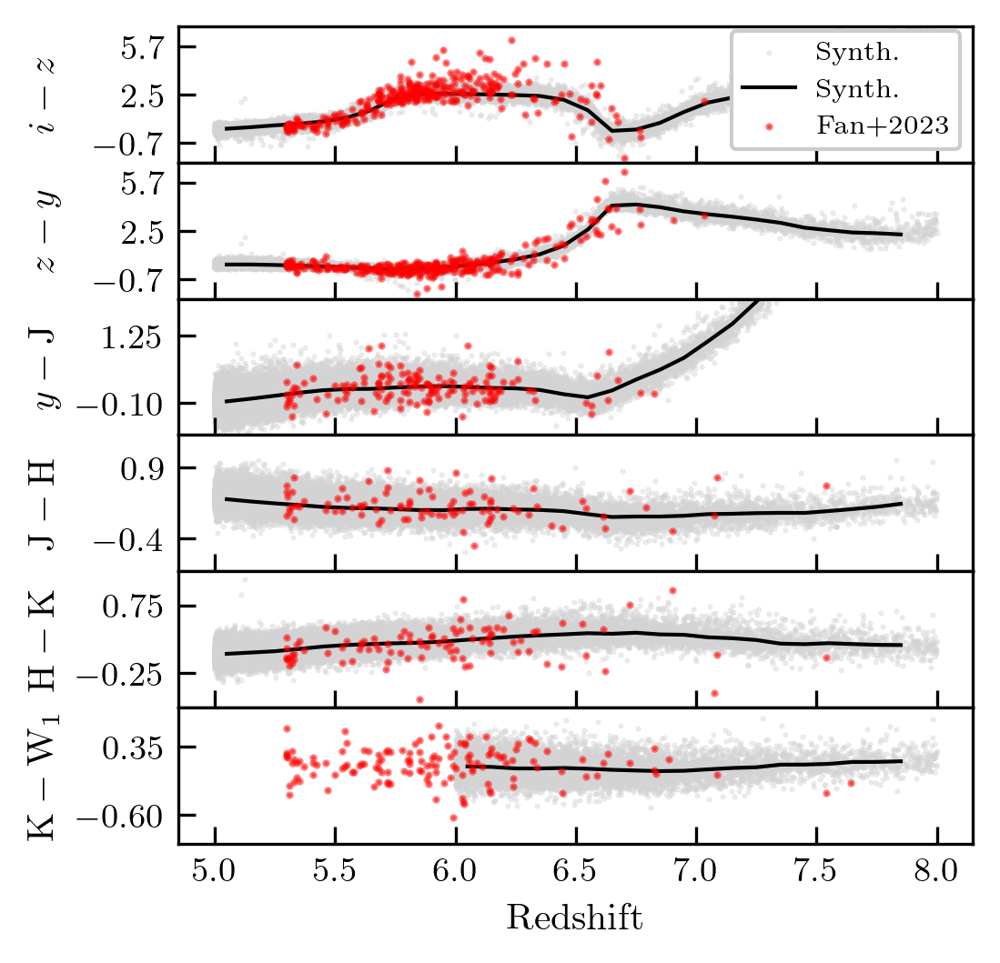

In [ ]:
# Make the plot of Fan+23 vs synth photometry
fig = plots.init_single_ax_figure(
    preset="single_col",
    dpi=300,
    axis_ratio=0.8,
    only_fig=True,
)

ir_survey = "VHS"  # "UKIDSS", "VHS", "VIKINGS"
axs = [
    fig.add_subplot(8, 1, 1),
]

axs = axs + [
    fig.add_subplot(8, 1, 2, sharex=axs[0]),
    fig.add_subplot(8, 1, 3, sharex=axs[0]),
    fig.add_subplot(8, 1, 4, sharex=axs[0]),
    fig.add_subplot(8, 1, 5, sharex=axs[0]),
    fig.add_subplot(8, 1, 6, sharex=axs[0]),
]

min_max_z_synth = (2.5, 8.0)
mask_synth = (synth["redshift"] > min_max_z_synth[0]) & (
    synth["redshift"] < min_max_z_synth[1]
)
binned_statistic_delta = 0.1
binned_statistic_bins = np.arange(
    min_max_z_synth[0], min_max_z_synth[1], binned_statistic_delta
)

for n, col_comb in enumerate(
    [
        ("iPSFMag", "zPSFMag"),
        ("zPSFMag", "yPSFMag"),
        ("yPSFMag", f"japermag3_{ir_survey}"),
        (f"japermag3_{ir_survey}", f"hapermag3_{ir_survey}"),
        (f"hapermag3_{ir_survey}", f"kapermag3_{ir_survey}"),
        (f"kapermag3_{ir_survey}", "mag_w1"),
    ]
):
    axs[n].scatter(
        synth["redshift"][mask_synth],
        (synth[col_comb[0]] - synth[col_comb[1]])[mask_synth],
        s=0.2,
        alpha=0.5,
        label="Synth.",
        color="lightgrey",
        zorder=-2,
    )

    median = binned_statistic(
        synth["redshift"][mask_synth],
        (synth[col_comb[0]] - synth[col_comb[1]])[mask_synth],
        bins=binned_statistic_bins,
        statistic="median",
    )[0]

    median_line_syn = axs[n].plot(
        binned_statistic_bins[:-1] + binned_statistic_delta / 2,
        median,
        c="k",
        label="Synth." if n == 0 else "_Synth.",
        lw=1.0,
        zorder=-1,
    )

    # Use all magnitudes you have, consider them equivalent
    if "apermag3_" in col_comb[0] or "apermag3_" in col_comb[1]:
        for ir_survey in ["UKIDSS", "VHS", "VIKINGS"]:
            upd_col_comb = ["", ""]
            upd_col_comb[0] = (
                col_comb[0].split("_")[0] + "_" + ir_survey
                if "apermag" in col_comb[0]
                else col_comb[0]
            )
            upd_col_comb[1] = (
                col_comb[1].split("_")[0] + "_" + ir_survey
                if "apermag" in col_comb[1]
                else col_comb[1]
            )
            axs[n].scatter(
                fan_catalogue["redshift"],
                fan_catalogue[upd_col_comb[0]] - fan_catalogue[upd_col_comb[1]],
                s=1.0,
                alpha=0.5,
                label="Fan+2023" if n == 0 and ir_survey == "VHS" else "_Fan+2023",
                color="r",
            )
    else:
        axs[n].scatter(
            fan_catalogue["redshift"],
            fan_catalogue[col_comb[0]] - fan_catalogue[col_comb[1]],
            s=1.0,
            alpha=0.5,
            label="Fan+2023" if n == 0 else "_Fan+2023",
            color="r",
        )


for ax in axs[:-1]:
    ax.tick_params(axis="x", which="both", labelbottom=False)

# manual adjustments
axs[0].set_ylabel(r"$i - z$")
axs[1].set_ylabel(r"$z - y$")
axs[2].set_ylabel(r"$y - {\rm J}$")
axs[3].set_ylabel(r"${\rm J} - {\rm H}$")
axs[4].set_ylabel(r"${\rm H} - {\rm K}$")
axs[5].set_ylabel(r"${\rm K} - {\rm W}_1$")

axs[0].set_ylim([-2.0, 7.0])
axs[1].set_ylim([-2.0, 7.0])
axs[2].set_ylim([-0.75, 1.99])
axs[3].set_ylim([-0.999, 1.499])
axs[4].set_ylim([-0.7499, 1.249])
axs[5].set_ylim([-1.0, 0.9])

axs[0].set_yticks((-0.7, 2.5, 5.7))
axs[1].set_yticks((-0.7, 2.5, 5.7))
axs[2].set_yticks((-0.1, 1.25))
axs[3].set_yticks((-0.4, 0.9))
axs[4].set_yticks((-0.25, 0.75))
axs[5].set_yticks((-0.6, 0.35))

axs[5].set_xlabel(r"Redshift")
_ = axs[0].legend(loc="lower right", fontsize=7, ncol=1)
_.get_frame().set_alpha(1.0)

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.00)
fig.align_labels()

# fig.savefig(project_path / "figures" / "Synth_vs_Fan+23_alt_2.png", bbox_inches="tight")
plt.show()

In [81]:
# use UMAP to visualise the latent space
# start by getting posteriors form the dataloader
train_dataloder = torch.utils.data.DataLoader(
    train_set_GP,
    batch_size=128,
    shuffle=False,
)

trained_model_GP.eval()
z = trained_model_GP.latent_space_posterior(
    train_dataloder,
    random_mask_flag=False,
    coverage_mask_flag=False,
)["z"]

# ======================================================== #

# Color coding for the UMAP plot, this is for the general purpose dataset
#  so I am simply hardcoding the filepath
sdss_names = pd.read_hdf(
    local_path
    / "SDSS_DR16Q_SNR15"
    / "SDSS_DR16Q_SNR15_3650_9800_2300_2600_dv140_SNR15_cleaned.hdf5"
).iloc[train_set_GP.indices]

# Clean up useless columns
for col in sdss_names.columns:
    if "EXTINCTION" in col:
        sdss_names.drop(columns=col, inplace=True)

    if "SPECTRO_DUPLICATE" in col:
        sdss_names.drop(columns=col, inplace=True)

    if "PLATE_DUPLICATE" in col:
        sdss_names.drop(columns=col, inplace=True)

    if "FIBERID_DUPLICATE" in col:
        sdss_names.drop(columns=col, inplace=True)

    if "MJD_DUPLICATE" in col:
        sdss_names.drop(columns=col, inplace=True)

    if "NHI_DLA" in col:
        sdss_names.drop(columns=col, inplace=True)

    if "PSFFLUX" in col:
        sdss_names.drop(columns=col, inplace=True)

    if "PSFMAGERR" in col:
        sdss_names.drop(columns=col, inplace=True)

    if "CONF_DLA" in col:
        sdss_names.drop(columns=col, inplace=True)

    if "Z_DLA" in col:
        sdss_names.drop(columns=col, inplace=True)

# bytes to string, I hate Pandas
sdss_names["SDSS_NAME"] = sdss_names["SDSS_NAME"].str.decode("utf-8")

# from here: https://iopscience.iop.org/article/10.3847/1538-4365/ac9ead
wu22_catalogue = utilities.table_to_pandas(
    Table.read("/Users/francesco/data/Niklas/SDSS_DR16Q_MergedWu_2022.fits")
)

# Drop more useless columns
for col in sdss_names.columns:
    if col in wu22_catalogue.columns and col != "SDSS_NAME":
        wu22_catalogue.drop(columns=col, inplace=True)

wu22_catalogue["SDSS_NAME"] = wu22_catalogue["SDSS_NAME"].str.decode("utf-8")
metadata = sdss_names.merge(wu22_catalogue, on="SDSS_NAME")

# Compute coordinates in galactic
coord = SkyCoord(
    metadata["RA_DR16Q"].to_numpy() * units.deg,
    metadata["DEC_DR16Q"].to_numpy() * units.deg,
    frame="icrs",
).galactic
metadata["l_gal"] = coord.galactic.l.value
metadata["b_gal"] = coord.galactic.b.value

QUEST.utils.utilities - INFO: The resulting df has more than 100 columns.


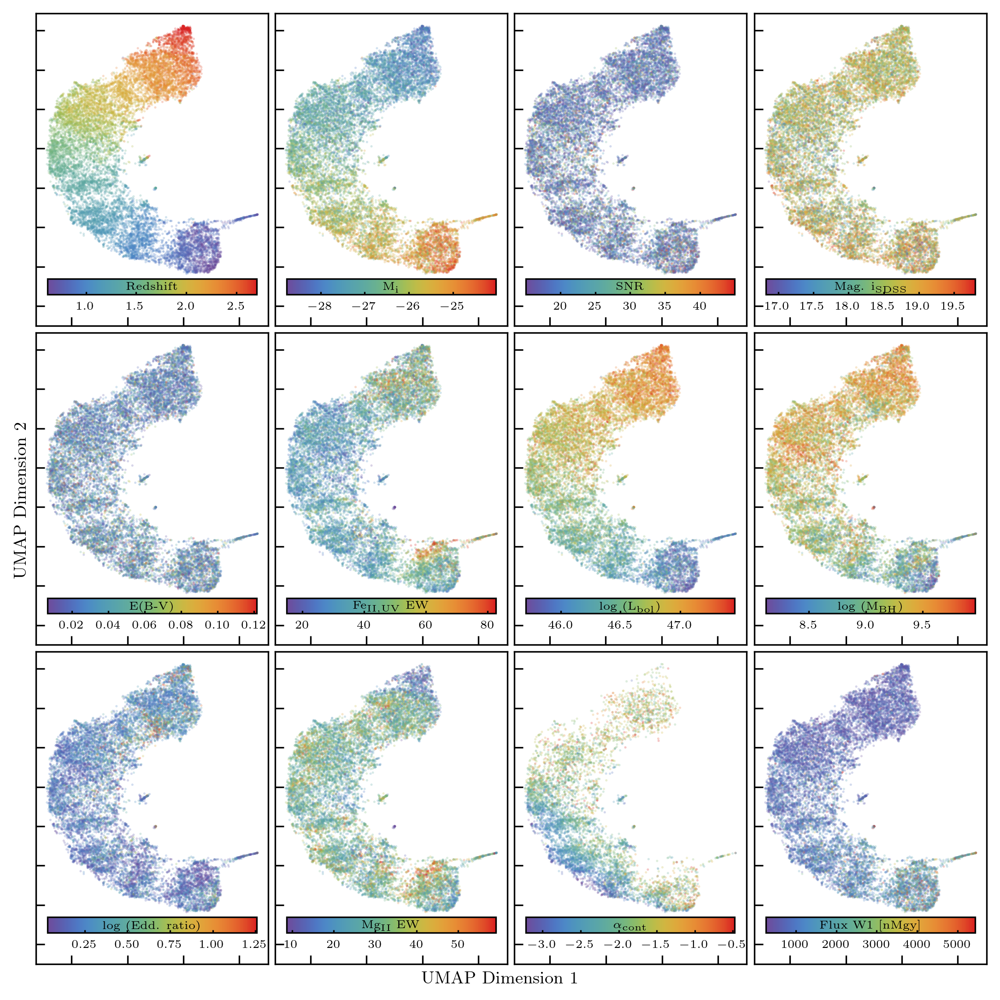

In [ ]:
# %%script echo Skipped!
# results are a bit finnicky, load the data to be safe, and the model too
import joblib

UMAP_model_filename = project_path / "data" / "UMAP_fitted_reducer.sav"
UMAP_model = joblib.load(UMAP_model_filename)

z_umap = np.load(project_path / "data" / "UMAP_latent_space_reduction.npy")


# properties that I would like to plot
def generate_coloring_standard(colname, dummy, sort=True):
    coloring = metadata[colname].values.copy()

    if sort:
        coloring_sorting_inds = np.argsort(coloring)
    else:
        coloring_sorting_inds = np.arange(len(coloring))

    # Clamp to make sure we have no big outliers
    coloring = np.clip(coloring, *np.nanpercentile(coloring, [1, 99]))
    return coloring, coloring_sorting_inds


def generate_coloring_contifit(colname, dummy, sort=True):
    coloring = metadata[colname].values.copy()
    coloring = np.vstack(coloring)[:, 1]
    coloring[coloring > 0] = np.nan

    if sort:
        coloring_sorting_inds = np.argsort(coloring)
    else:
        coloring_sorting_inds = np.arange(len(coloring))

    # Clamp to make sure we have no big outliers
    coloring = np.clip(coloring, *np.nanpercentile(coloring, [1, 99]))
    return coloring, coloring_sorting_inds


def generate_coloring_contifit_cont_lum(colname, dummy, sort=True):
    # uses the continuum luminosity to color the points as a proxy
    #  for the continuum slope
    logl1350 = metadata["LOGL1350"].values.copy()
    logl2500 = metadata["LOGL2500"].values.copy()
    logl5100 = metadata["LOGL5100"].values.copy()

    logl1350[logl1350 < 1] = np.nan
    logl2500[logl2500 < 1] = np.nan
    logl5100[logl5100 < 1] = np.nan

    coloring = logl1350 - logl2500

    if sort:
        coloring_sorting_inds = np.argsort(coloring)
    else:
        coloring_sorting_inds = np.arange(len(coloring))

    # Clamp to make sure we have no big outliers
    coloring = np.clip(coloring, *np.nanpercentile(coloring, [1, 99]))
    return coloring, coloring_sorting_inds


def generate_coloring_line(colname, idx, sort=True):
    coloring = metadata[colname].values.copy()
    coloring = np.vstack(coloring)[:, idx]
    coloring[coloring == 0] = np.nan

    if sort:
        coloring_sorting_inds = np.argsort(coloring)
    else:
        coloring_sorting_inds = np.arange(len(coloring))

    # Clamp to make sure we have no big outliers
    coloring = np.clip(coloring, *np.nanpercentile(coloring, [1, 99]))
    return coloring, coloring_sorting_inds


qso_prop_color_to = {
    "Z_PIPE": generate_coloring_standard,
    "M_I": generate_coloring_standard,
    "SN_MEDIAN_ALL": generate_coloring_standard,
    "PSFMAG_3": generate_coloring_standard,
    "EBV": generate_coloring_standard,
    "FEII_UV_EW": generate_coloring_standard,
    "LOGLBOL": generate_coloring_standard,
    "LOGMBH": generate_coloring_standard,
    "LOGLEDD_RATIO": generate_coloring_standard,
    "MGII": generate_coloring_line,
    "CONTI_FIT": generate_coloring_contifit,
    "W1_FLUX": generate_coloring_standard,
}

qso_display_names = {
    "Z_PIPE": r"Redshift",
    "M_I": r"${\rm M_i}$",
    "SN_MEDIAN_ALL": r"SNR",
    "PSFMAG_3": r"Mag. i$_{\rm SDSS}$",
    "EBV": r"E(B-V)",
    "FEII_UV_EW": r"Fe$_{\rm II, UV}$ EW",
    "LOGLBOL": r"$\log$ (L$_{\rm bol})$",
    "LOGMBH": r"$\log$ (M$_{\rm BH})$",
    "LOGLEDD_RATIO": r"$\log$ (Edd. ratio)",
    "MGII": r"Mg$_{\rm II}$ EW",
    "CONTI_FIT": r"$\alpha_{\rm cont}$",
    "W1_FLUX": r"Flux W1 [nMgy]",
}

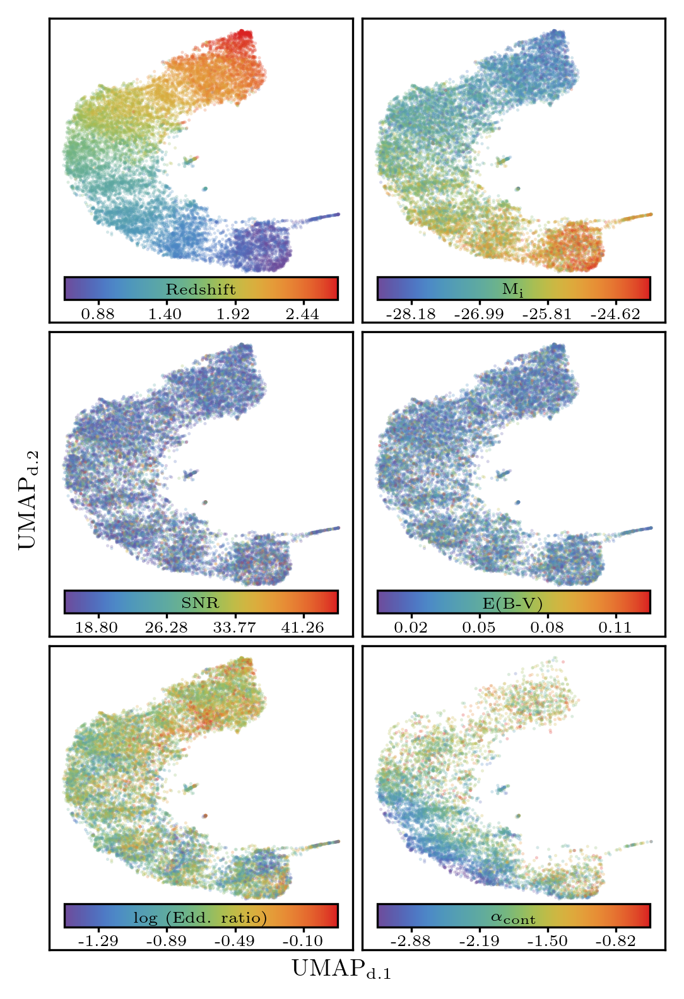

In [ ]:
# same as before, but use line properties instead. Something related to MgII is probably for the best, as most objects whould have it
#  results are a bit finnicky, load the data to be safe, and the model too
qso_prop_color_to = {
    "Z_PIPE": generate_coloring_standard,
    "M_I": generate_coloring_standard,
    "SN_MEDIAN_ALL": generate_coloring_standard,
    "EBV": generate_coloring_standard,
    # use either of these three
    # "MGII": generate_coloring_line,
    # "HBETA": generate_coloring_line,
    "LOGLEDD_RATIO": generate_coloring_standard,
    "CONTI_FIT": generate_coloring_contifit,
}

qso_display_names = {
    "Z_PIPE": r"Redshift",
    "M_I": r"${\rm M_i}$",
    "SN_MEDIAN_ALL": r"SNR",
    "EBV": r"E(B-V)",
    # "LOGLBOL": r"$\log({\rm L}_{\rm bol})$", -> replaced with MgII, Hbeta or Eddington ratio
    # "MGII": r"Mg$_{\rm II}$ EW",
    # "HBETA": r"H$\beta$ EW",
    "LOGLEDD_RATIO": r"$\log$ (Edd. ratio)",
    "CONTI_FIT": r"$\alpha_{\rm cont}$",
}

# make the canvas
fig = plots.init_single_ax_figure(
    preset="single_col",
    dpi=300,
    axis_ratio=0.675,
    only_fig=True,
    layout="constrained",
)

# Create a 3 by 4 axis grid for plotting
axs = []
for i in range(3):
    row = []
    for j in range(2):
        if i == 0 and j == 0:
            ax = fig.add_subplot(3, 2, 1)
        else:
            ax = fig.add_subplot(3, 2, i * 2 + j + 1)

        ax.tick_params(axis="both", which="both", labelbottom=False, labelleft=False)
        row.append(ax)
    axs.append(row)
axs = np.array(axs)

# Actually plot things
for n, ax in enumerate(axs.flatten()):
    this_ax_column = list(qso_prop_color_to.keys())[n]

    coloring_fun = qso_prop_color_to[this_ax_column]
    coloring, coloring_sorting_inds = coloring_fun(this_ax_column, 3)

    if this_ax_column == "LOGLEDD_RATIO ":
        # For the Eddington ratio, we want to plot the log of the values
        coloring = 10 ** (coloring)

    # ax.scatter(z_umap[:, 0], z_umap[:, 1], s=1.5, alpha=0.25, c="k", edgecolors="none")
    this_ax_scatter = ax.scatter(
        z_umap[:, 0],
        z_umap[:, 1],
        s=1.5,
        alpha=0.25,
        c=coloring,
        edgecolors="none",
        cmap=cmap,
    )

    # colorbar
    cax = ax.inset_axes([0.05, 0.075, 0.9, 0.075])

    # colorbar stuff
    coloring_no_nan = coloring[~np.isnan(coloring)]

    cbar_min, cbar_max, n_cbar_int = (coloring_no_nan.min(), coloring_no_nan.max(), 4)
    delta = (cbar_max - cbar_min) / n_cbar_int

    # Make colorbar inside the subplot
    cbar = plt.colorbar(
        this_ax_scatter,
        cax=cax,
        orientation="horizontal",
    )
    cbar.ax.tick_params(axis="x", direction="out", pad=1)
    cbar.ax.get_xaxis().labelpad = -14.75
    cbar.ax.tick_params(labelsize=6, size=2.0)
    cbar.set_label(qso_display_names[this_ax_column], fontsize=6)
    cbar.solids.set(alpha=1)
    cbar.set_ticks([cbar_min + delta * (_ + 0.5) for _ in np.arange(n_cbar_int)])
    cbar.set_ticklabels(
        [f"{(cbar_min + delta * (_ + 0.5)):.2f}" for _ in np.arange(n_cbar_int)]
    )

    # ax.set_xlim(ax.get_xlim()[0], 6.5)
    ax.set_ylim(-5, ax.get_ylim()[1])
    ax.set_xticks([-2.0, 0.0, 2.0, 4.0])

    ax.tick_params(axis="both", which="both", left=False, bottom=False)

# Final adjustments
fig.supxlabel(r"UMAP$_{\rm d. 1}$")
fig.supylabel(r"UMAP$_{\rm d. 2}$")

fig.align_labels()
fig.get_layout_engine().set(w_pad=0.025, h_pad=0.025, hspace=0.00, wspace=0.00)

# fig.savefig(
#     project_path / "figures" / "UMAP_color_coding_subset_alt.png",
#     bbox_inches="tight",
# )

plt.show()

Found 5 clusters


py.warnings - WARNING: /var/folders/rm/h1prb1710t70p18xbdxx9s740000gn/T/ipykernel_1710/2967106272.py:79: RuntimeWarning: All-NaN slice encountered
  np.nanmedian(spectra[hdbscan_obj.labels_ == hdbscan_label, :], axis=0),

py.warnings - WARNING: /var/folders/rm/h1prb1710t70p18xbdxx9s740000gn/T/ipykernel_1710/2967106272.py:87: RuntimeWarning: All-NaN slice encountered
  np.nanmedian(spectra[hdbscan_obj.labels_ == hdbscan_label, :], axis=0)[

py.warnings - WARNING: /var/folders/rm/h1prb1710t70p18xbdxx9s740000gn/T/ipykernel_1710/2967106272.py:103: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.savefig(

py.warnings - WARNING: /Users/francesco/uvp/QUEST/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)



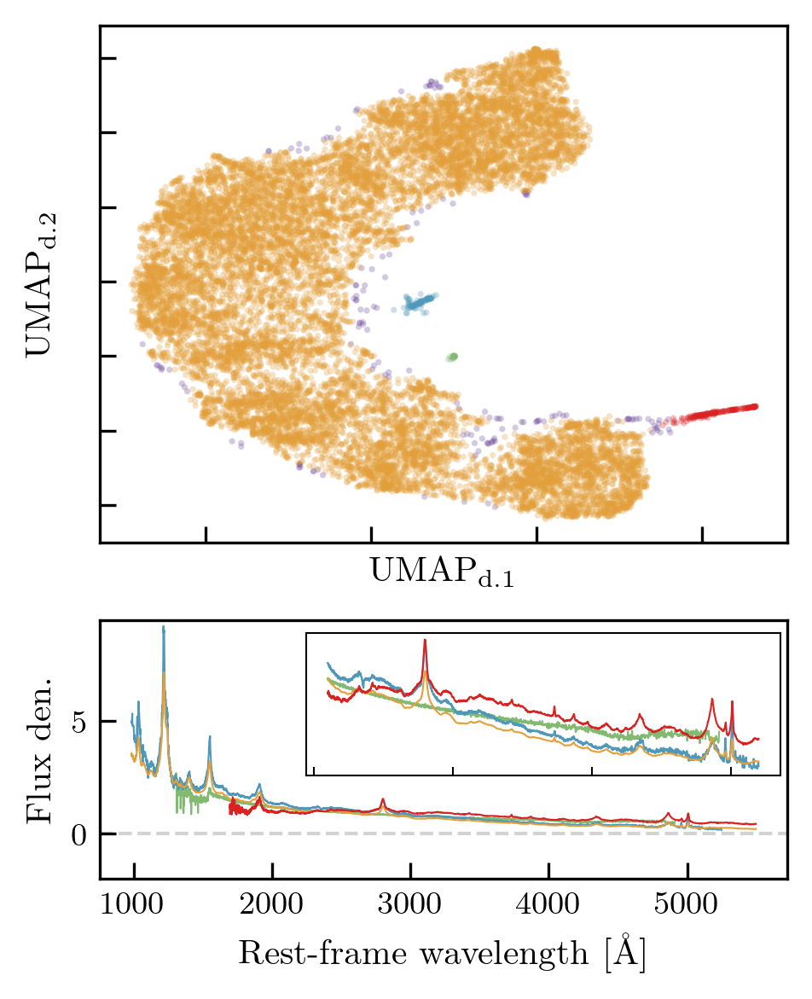

In [ ]:
hdbscan_obj = HDBSCAN(min_cluster_size=20, min_samples=20)

hdbscan_obj.fit(z_umap)

fig = plots.init_single_ax_figure(
    preset="single_col",
    dpi=300,
    only_fig=True,
    axis_ratio=0.8,
)

gs = gridspec.GridSpec(2, 1, height_ratios=[2, 1])

ax = fig.add_subplot(gs[0])

# Generate a colormap with enough colors for all clusters (+1 for noise)
num_clusters = hdbscan_obj.labels_.max() + 2
cluster_cmap = colors.ListedColormap(cmap(np.linspace(0, 1, num_clusters)))
cluster_cmap.colors = cluster_cmap.colors[[0, 2, 1, 3, 4]]

ax.scatter(
    z_umap[:, 0],
    z_umap[:, 1],
    s=3.0,
    alpha=0.3,
    edgecolors="none",
    c=hdbscan_obj.labels_,
    cmap=cluster_cmap,
)

ax.tick_params(
    axis="both",
    which="both",
    labelleft=False,
    labelbottom=False,
)

ax.set_xlabel(r"UMAP$_{\rm d. 1}$")
ax.set_ylabel(r"UMAP$_{\rm d. 2}$")

print(f"Found {len(np.unique(hdbscan_obj.labels_))} clusters")

# ======================================================== #

ax = fig.add_subplot(gs[1])

dispersion = train_set_GP.dataset.dispersion
spectra = train_set_GP.dataset[train_set_GP.indices][:, 0, :].detach().cpu().numpy()
spectra[spectra == 0.0] = np.nan

# try to also show better the differences between the median spectra
x1, x2 = 2100, 5200
axins = ax.inset_axes([0.3, 0.4, 0.69, 0.55], xticklabels=[], yticklabels=[])
axins.tick_params(width=0.5, size=2.5)
axins.tick_params(axis="y", left=False)

# see https://stackoverflow.com/a/20703611
for _spine in ["top", "bottom", "left", "right"]:
    axins.spines[_spine].set_linewidth(0.5)

axins_mask = (dispersion > x1) & (dispersion < x2)

# ======================================================== #

for _, hdbscan_label in enumerate(np.unique(hdbscan_obj.labels_)):
    if hdbscan_label == -1:  # skip noise points
        continue

    # # switch around blue and green for consistency with the text
    # if _ == 0:
    #     hdbscan_color_n = cmap(np.linspace(0, 1, num_clusters)[_ + 1])
    # elif _ == 1:
    #     hdbscan_color_n = cmap(np.linspace(0, 1, num_clusters)[_ - 1])
    # else:
    hdbscan_color_n = cluster_cmap.colors[_]

    ax.plot(
        dispersion,
        np.nanmedian(spectra[hdbscan_obj.labels_ == hdbscan_label, :], axis=0),
        label=f"Cluster {hdbscan_label}",
        color=hdbscan_color_n,
        lw=0.5,
    )

    axins.plot(
        dispersion[axins_mask],
        np.nanmedian(spectra[hdbscan_obj.labels_ == hdbscan_label, :], axis=0)[
            axins_mask
        ],
        label=f"Cluster {hdbscan_label}",
        color=hdbscan_color_n,
        lw=0.5,
    )


ax.set_xlabel(r"Rest-frame wavelength [\AA]")
ax.set_ylabel(r"Flux den.")

ax.axhline(0.0, color="lightgrey", lw=1, zorder=-2, ls="--")
ax.set_ylim(-2, 9.5)

fig.align_labels()
# fig.savefig(
#     project_path / "figures" / "HDBSCAN_clusters_spectra.png",
#     bbox_inches="tight",
# )

plt.show()

In [90]:
%%script echo Skipped!
# figure out which object belongs to which cluster, and save the list of ids
# I want labels 0, 1, 3 -> 2 is orange
SDSS_ids = metadata["SDSS_NAME"].values

for n in np.unique(hdbscan_obj.labels_):
    SDSS_id_mask = hdbscan_obj.labels_ == n
    SDSS_ids_in_clusters = SDSS_ids[SDSS_id_mask]
    np.savetxt(
        project_path / "data" / f"SDSS_DR16Q_SNR15_UMAP_HDBSCAN_clusters_id_{n}.txt",
        SDSS_ids_in_clusters,
        fmt="%s",
    )

Skipped!


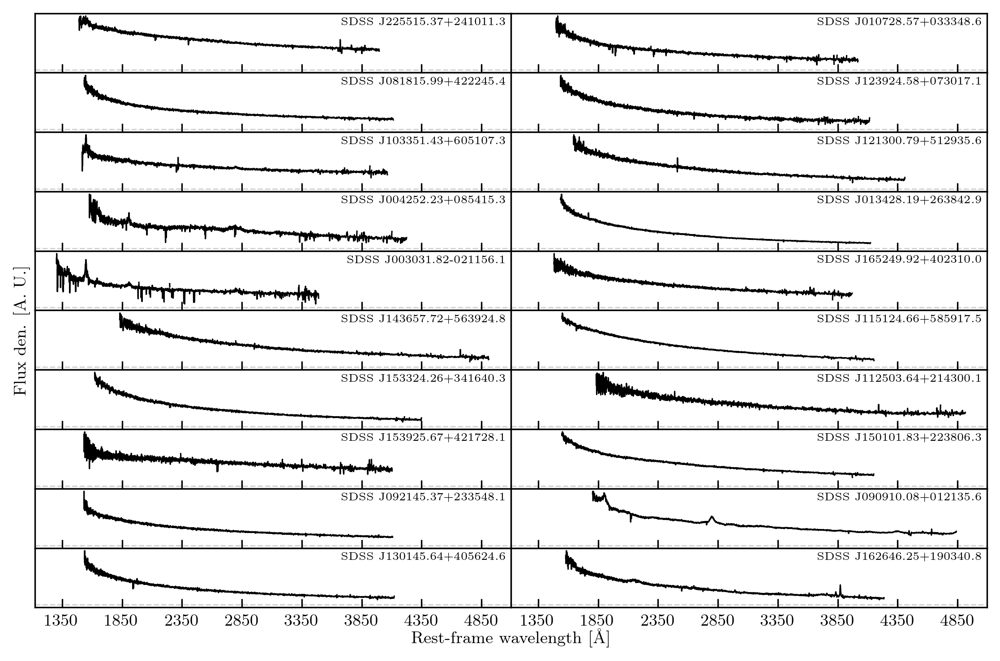

In [ ]:
# Make a nice-ish plot of the now green spectra
fig = plots.init_single_ax_figure(
    preset="double_cols",
    dpi=300,
    only_fig=True,
    axis_ratio=1.5,
)

axs = []
gs = GridSpec(10, 2, figure=fig)

axs.append(fig.add_subplot(gs[0, 0]))
for i in range(1, 20):
    axs.append(fig.add_subplot(gs[i // 2, i % 2], sharex=axs[0]))

# need to figure out the IDs now...

for n, ax in enumerate(axs):
    spec_to_plot = spectra[hdbscan_obj.labels_ == 0, :][n]
    spec_to_plot = spec_to_plot - np.nanmin(spec_to_plot) / 2
    ax.plot(dispersion, spec_to_plot, color="k", lw=0.75)
    ax.axhline(0.0, color="lightgrey", lw=0.75, zorder=-2, ls="--")

    ax.text(
        0.99,
        0.8,
        f"SDSS J{metadata.SDSS_NAME.values[hdbscan_obj.labels_ == 0][n]}",
        transform=ax.transAxes,
        fontsize=6,
        color="k",
        ha="right",
    )

    ax.tick_params(left=False)
    ax.label_outer()

    # also remove the left labels
    if n % 2 == 0:
        ax.tick_params(labelleft=False)
        ax.set_xticks(np.arange(1350, 5000, 500))

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.00, wspace=0.00)

fig.supxlabel(r"Rest-frame wavelength [\AA]")
fig.supylabel(r"Flux den. [A. U.]", x=-0.0225)
fig.align_labels()

# fig.savefig(
#     project_path / "figures" / "HDBSCAN_maybe_misclassified.png",
#     bbox_inches="tight",
# )

plt.show()

py.warnings - WARNING: /var/folders/rm/h1prb1710t70p18xbdxx9s740000gn/T/ipykernel_2049/2040547546.py:53: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter_ax.scatter(



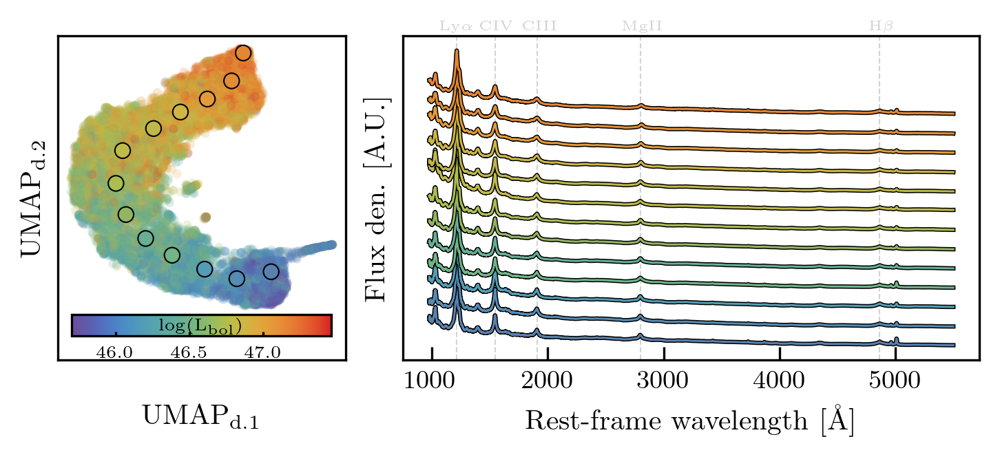

In [ ]:
fig = plots.init_single_ax_figure(
    width=12,
    dpi=300,
    only_fig=True,
    axis_ratio=2.25,
)
gs = GridSpec(1, 2, fig, width_ratios=[1, 2])

scatter_ax = fig.add_subplot(gs[:, :1])
spectra_axis = fig.add_subplot(gs[:, 1:])

# Use umap.plot to plot to the major axis
# umap.plot.points(mapper, labels=labels, ax=scatter_ax)
sc_embedding = scatter_ax.scatter(
    UMAP_model.embedding_[:, 0],
    UMAP_model.embedding_[:, 1],
    c=generate_coloring_standard("LOGLBOL", None)[0],
    cmap=cmap,
    s=10,
    alpha=0.2,
    edgecolors="none",
)
scatter_ax.set(xticks=[], yticks=[])

plt.draw()
embedding_colors = sc_embedding.get_facecolors()

# Plot each of the generated digit images
for i in range(len(test_pts)):
    _x, _y = test_pts[i, 0], test_pts[i, 1]
    # get the index of the closest point in the UMAP embedding
    dist = np.sqrt(
        (_x - UMAP_model.embedding_[:, 0]) ** 2
        + (_y - UMAP_model.embedding_[:, 1]) ** 2
    )
    closest_index = np.argsort(dist)[0:10]
    coloring = embedding_colors[closest_index]
    coloring = np.median(coloring, axis=0)
    if coloring[-1] < 1.0:
        coloring[-1] = 1.0

    spectra_axis.plot(
        dispersion,
        (decoded[i, :].detach().cpu().numpy()) + i * 2.0,
        color=coloring,
        lw=0.75,
        path_effects=[
            mpatheffects.Stroke(linewidth=1.5, foreground="k"),
            mpatheffects.Normal(),
        ],
    )

    scatter_ax.scatter(
        test_pts[i, 0],
        test_pts[i, 1],
        marker="o",
        c=coloring,
        s=15,
        path_effects=[
            mpatheffects.Stroke(linewidth=2, foreground="k"),
            mpatheffects.Normal(),
        ],
    )

# colorbar on the left
cax = scatter_ax.inset_axes([0.05, 0.075, 0.9, 0.065])
# Make colorbar inside the subplot
cbar = plt.colorbar(
    sc_embedding,
    cax=cax,
    orientation="horizontal",
)
cbar.ax.get_xaxis().labelpad = -15.5
cbar.ax.tick_params(labelsize=6, size=1.5)
cbar.set_label(qso_display_names["LOGLBOL"], fontsize=6)
cbar.solids.set(alpha=1)

scatter_ax.set_ylim(-5, scatter_ax.get_ylim()[1])

scatter_ax.set_xlabel(r"UMAP$_{\rm d. 1}$")
scatter_ax.set_ylabel(r"UMAP$_{\rm d. 2}$")
spectra_axis.set_xlabel(r"Rest-frame wavelength [\AA]")
spectra_axis.set_ylabel(r"Flux den. [A.U.]")

spectra_axis.axvline(1215.67, color="lightgrey", lw=0.5, zorder=-2, ls="--")
spectra_axis.axvline(1549.48, color="lightgrey", lw=0.5, zorder=-2, ls="--")
spectra_axis.axvline(1908.73, color="lightgrey", lw=0.5, zorder=-2, ls="--")
spectra_axis.axvline(2799.12, color="lightgrey", lw=0.5, zorder=-2, ls="--")
spectra_axis.axvline(4862.68, color="lightgrey", lw=0.5, zorder=-2, ls="--")

spectra_axis.text(
    1220,
    spectra_axis.get_ylim()[1] * 1.01,
    r"Ly$\alpha$",
    color="lightgrey",
    zorder=-2,
    ha="center",
    va="bottom",
    fontsize=5,
)
spectra_axis.text(
    1570,
    spectra_axis.get_ylim()[1] * 1.01,
    r"CIV",
    color="lightgrey",
    zorder=-2,
    ha="center",
    va="bottom",
    fontsize=5,
)
spectra_axis.text(
    1940,
    spectra_axis.get_ylim()[1] * 1.01,
    r"CIII",
    color="lightgrey",
    zorder=-2,
    ha="center",
    va="bottom",
    fontsize=5,
)
spectra_axis.text(
    2820,
    spectra_axis.get_ylim()[1] * 1.01,
    r"MgII",
    color="lightgrey",
    zorder=-2,
    ha="center",
    va="bottom",
    fontsize=5,
)
spectra_axis.text(
    4880,
    spectra_axis.get_ylim()[1] * 1.01,
    r"H$\beta$",
    color="lightgrey",
    zorder=-2,
    ha="center",
    va="bottom",
    fontsize=5,
)

spectra_axis.tick_params(axis="y", which="both", left=False, labelleft=False)
# get a tad bit more space at the top of the spectra_axis

fig.align_labels()
# fig.savefig(project_path / "figures" / "UMAP_evolution_decoded_spectra_sideCaption.png")
plt.show()

In [ ]:
# plot for the bh masses
from QUEST.scripts import fit_reconstructed_FOR as frFOR

metadata = pd.read_hdf(list(frFOR.base_path.glob("*cleaned.hdf5"))[0])

# Things here are written to try and make things as consistent as possible with PyQSOFit
# Given that I use inds for a few things, using inds is better than query in this
#  case
inds = np.where((metadata["Z_SYS"] > 0.7) & (metadata["Z_SYS"] < 1.9))[0]

# downlselect only the metadata you are interested in
metadata = metadata.iloc[inds]

fitting_results = {}
for dset_name in [
    "reconstruction.npz",
    "reconstruction_masked_MgII.npz",
    "reconstruction_masked_Hb.npz",
    "reconstruction_masked_MgII_Hb.npz",
]:
    pyqsofit_paths = frFOR.prepare_pyqso_dirs(
        frFOR.base_path_reconstructions, dset_name[15:-4]
    )
    postprocessed_results = frFOR.postprocess_fitted_spectra(
        1285,  # hardcoded for speed! otherwise data_to_fit[0].shape[0],
        metadata,
        pyqsofit_paths,
    )

    bh_masses = frFOR.fit_res_to_pandas(postprocessed_results)
    fitting_results[dset_name] = bh_masses

In [ ]:
main_keys = []

main_keys.append("reconstruction.npz")
main_keys.append("reconstruction_masked_MgII.npz")
main_keys.append("reconstruction_masked_Hb.npz")
main_keys.append("reconstruction_masked_MgII_Hb.npz")

titles_dict = {
    0: "No line mask",
    1: r"Mg$_{\rm II}$ masked",
    2: r"H$\beta$ masked",
    3: r"Mg$_{\rm II}$, H$\beta$ masked",
}

sub_key = "MgII"
sub_key2 = "Hb"

fig = plots.init_single_ax_figure(
    preset="single_col",
    only_fig=True,
    dpi=300,
    axis_ratio=1.0,
)

fig.get_layout_engine().set(w_pad=0.025, h_pad=0.025, hspace=0.0, wspace=0.0)

ax_1 = fig.add_subplot(4, 1, 1)
ax_2 = fig.add_subplot(4, 1, 2, sharex=ax_1)
ax_3 = fig.add_subplot(4, 1, 3, sharex=ax_1)
ax_4 = fig.add_subplot(4, 1, 4, sharex=ax_1)

for n, ax in enumerate([ax_1, ax_2, ax_3, ax_4]):
    ax.label_outer()

    main_key = main_keys[n]
    ax.hist(
        np.log10(
            np.abs(
                10 ** fitting_results[main_key]["LogBH_Recs_" + sub_key]
                - 10 ** fitting_results[main_key]["LogBH_SDSS_" + sub_key]
            )
        )
        - fitting_results[main_key]["LogBH_SDSS_" + sub_key],
        bins=25,
        alpha=0.6,
        facecolor="lightgrey",
        edgecolor="k",
        range=(-3.0, 3.0),
        label=r"MgII",
        density=True,
    )
    ax.hist(
        np.log10(
            np.abs(
                10 ** fitting_results[main_key]["LogBH_Recs_" + sub_key2]
                - 10 ** fitting_results[main_key]["LogBH_SDSS_" + sub_key2]
            )
        )
        - fitting_results[main_key]["LogBH_SDSS_" + sub_key2],
        bins=25,
        alpha=0.3,
        facecolor="red",
        edgecolor="darkred",
        range=(-3.0, 3.0),
        label=r"H$\beta$",
        density=True,
    )

    ax.text(0.975, 0.8, titles_dict[n], transform=ax.transAxes, ha="right")

    ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1] * 1.30)

    for __ in [16, 50, 84]:
        _ = np.nanpercentile(
            np.log10(
                np.abs(
                    10 ** fitting_results[main_key]["LogBH_Recs_" + sub_key2]
                    - 10 ** fitting_results[main_key]["LogBH_SDSS_" + sub_key2]
                )
            )
            - fitting_results[main_key]["LogBH_SDSS_" + sub_key2],
            __,
        )
        ax.axvline(
            _,
            color="k",
            linestyle="--",
            lw=0.75,
            # label=f"{_}th percentile",
        )

        if __ == 16:
            ha_ = "right"
        elif __ == 50:
            ha_ = "center"
        elif __ == 84:
            ha_ = "left"

        ax.text(
            _,
            ax.get_ylim()[1] * 0.95,
            f"{_:.2f}",
            color="k",
            fontsize=8,
            ha=ha_,
            bbox=dict(facecolor="white", alpha=1.0, edgecolor="none", pad=1.0, lw=0.5),
            va="top",
        )


ax_1.legend(loc="lower right", frameon=False)
# ax_4.set_ylim(0, ax_1.get_ylim()[1] * 1.05)

fig.supxlabel(
    r"$\log_{10}\left(\frac{\rm |M_{BH, Rec} - M_{BH, SDSS}|}{\rm M_{BH, SDSS}}\right)$"
)  # r"$\Delta$M$_{\rm BH}$ (Reconstruction - SDSS)")
fig.supylabel("Number of objects")

# fig.savefig(
#     project_path / "figures" / "BH_mass_reconstruction_comparison_relative.png",
#     bbox_inches="tight",
# )

plt.show()

In [ ]:
fig = plots.init_single_ax_figure(
    preset="single_col",
    only_fig=True,
    dpi=300,
    axis_ratio=1.0,
)

fig.get_layout_engine().set(w_pad=0.025, h_pad=0.025, hspace=0.0, wspace=0.0)

ax_1 = fig.add_subplot(4, 1, 1)
ax_2 = fig.add_subplot(4, 1, 2, sharex=ax_1)
ax_3 = fig.add_subplot(4, 1, 3, sharex=ax_1)
ax_4 = fig.add_subplot(4, 1, 4, sharex=ax_1)

for n, ax in enumerate([ax_1, ax_2, ax_3, ax_4]):
    ax.label_outer()

    main_key = main_keys[n]
    ax.hist(
        fitting_results[main_key]["LogBH_Recs_" + sub_key]
        - fitting_results[main_key]["LogBH_SDSS_" + sub_key],
        bins=25,
        alpha=0.6,
        facecolor="lightgrey",
        edgecolor="k",
        range=(-0.75, 1.25),
        label=r"MgII",
        density=True,
    )
    ax.hist(
        fitting_results[main_key]["LogBH_Recs_" + sub_key2]
        - fitting_results[main_key]["LogBH_SDSS_" + sub_key2],
        bins=25,
        alpha=0.3,
        facecolor="red",
        edgecolor="darkred",
        range=(-0.75, 1.25),
        label=r"H$\beta$",
        density=True,
    )

    ax.text(0.975, 0.8, titles_dict[n], transform=ax.transAxes, ha="right")

    ax.set_ylim(ax.get_ylim()[0], ax.get_ylim()[1] * 1.30)

    for __ in [16, 50, 84]:
        _ = np.nanpercentile(
            fitting_results[main_key]["LogBH_Recs_" + sub_key2]
            - fitting_results[main_key]["LogBH_SDSS_" + sub_key2],
            __,
        )
        ax.axvline(
            _,
            color="k",
            linestyle="--",
            lw=0.75,
            # label=f"{_}th percentile",
        )

        if __ == 16:
            ha_ = "right"
        elif __ == 50:
            ha_ = "center"
        elif __ == 84:
            ha_ = "left"

        ax.text(
            _,
            ax.get_ylim()[1] * 0.95,
            f"{_:.2f}",
            color="k",
            fontsize=8,
            ha=ha_,
            bbox=dict(facecolor="white", alpha=1.0, edgecolor="none", pad=1.0, lw=0.5),
            va="top",
        )


ax_1.legend(loc="lower right", frameon=False)
# ax_4.set_ylim(0, ax_1.get_ylim()[1] * 1.05)

fig.supxlabel(
    r"${\rm \log\left(M_{BH, Rec}\right) - \log\left(M_{BH, SDSS}\right)}$"
)  # r"$\Delta$M$_{\rm BH}$ (Reconstruction - SDSS)")
fig.supylabel("Number of objects")

# fig.savefig(
#     project_path / "figures" / "BH_mass_reconstruction_comparison.png",
#     bbox_inches="tight",
# )

plt.show()

In [ ]:
# For the BAL reconstruction
bal_dset_dispersion = np.load(
    local_path
    / "BAL"
    / "SDSS_DR12Q_BAL_FOB/SDSS_DR12Q_BAL_FOB_3650_9800_1175_2950_dv140_SNR5.npz"
)["dispersion"]  # This is always the same, does not really matter

# original data
bal_dset_orig_flux = np.load(
    local_path
    / "BAL"
    / "SDSS_DR12Q_BAL_FOB/SDSS_DR12Q_BAL_FOB_3650_9800_1175_2950_dv140_SNR5.npz"
)["flux_orig"]

bal_dset_manual_mask = np.load(
    local_path
    / "BAL"
    / "SDSS_DR12Q_BAL_FOB/SDSS_DR12Q_BAL_FOB_3650_9800_1175_2950_dv140_SNR5_manual.npz"
)["gpm"]

bal_dset_recs = np.load(
    local_path
    / "BAL"
    / "SDSS_DR12Q_BAL_FOB/SDSS_DR12Q_BAL_FOB_3650_9800_1175_2950_dv140_SNR5_reconstructed.npy"
)

fig = plots.init_single_ax_figure(
    preset="single_col",
    dpi=300,
    only_fig=True,
    axis_ratio=0.65,
)

axs = fig.subplots(9, 1, sharex=True)
axs = axs.flatten()

for i in range(9):
    axs[i].step(
        bal_dset_dispersion[i], bal_dset_orig_flux[i], color="k", lw=0.7, label="SDSS"
    )
    axs[i].step(
        bal_dset_dispersion[i], bal_dset_recs[i], color="red", lw=0.7, label="Rec."
    )

    axs[i].axhline(0, color="lightgrey", lw=0.5, ls="--")

    axs[i].label_outer()
    axs[i].tick_params(axis="y", left=False, labelleft=False)
    axs[i].tick_params(axis="x", length=1.25)

    spec_max = np.nanmedian(bal_dset_orig_flux[i])
    axs[i].set_ylim(-0.9 * spec_max, 4.5 * spec_max)

    annotate_lines(
        axs[i],
        -0.1,
        1.0,
        axs[i].get_ylim()[0] + 0.075 * (axs[i].get_ylim()[1] - axs[i].get_ylim()[0]),
        25,
        0,
        line_dict=line_dict,
        th=1.0,
        lw=0.5,
        xmin=1000,
        xmax=2200,
        color="grey",
        ls="--",
        kwargs_text={
            "ha": "left",
            "va": "center",
            "zorder": -1,
            "fontsize": 6,
            "color": "grey",
        },
    )

    # plot the mask after all the setup
    axs[i].fill_between(
        bal_dset_dispersion[i],
        *axs[i].get_ylim(),
        where=~bal_dset_manual_mask[i].astype(bool),
        color="lightgrey",
        alpha=0.6,
        label="Mask",
        zorder=-2,
        edgecolor="none",
    )

    axs[i].set_xlim(1100, 2200)
    axs[i].set_xticks(np.arange(1250, 2200, 500))

axs[0].legend(loc="upper right", fontsize=7, ncols=3)

fig.get_layout_engine().set(w_pad=0.025, h_pad=0.025, hspace=0.000, wspace=0.025)

fig.supxlabel(r"Rest-frame Wavelength [\AA]")
fig.supylabel(r"Flux den. [A.U.]")

# fig.savefig(
#     project_path / "figures" / "BAL_reconstruction_example.png",
#     bbox_inches="tight",
# )

plt.show()

In [ ]:
# For the BAL reconstruction
bal_dset_dispersion = np.load(
    local_path
    / "BAL"
    / "SDSS_DR12Q_BAL_FOB"
    / "SDSS_DR12Q_BAL_FOB_3650_9800_1175_2950_dv140_SNR5.npz"
)["dispersion"]  # This is always the same, does not really matter

# original data
bal_dset_orig_flux = np.load(
    local_path
    / "BAL"
    / "SDSS_DR12Q_BAL_FOB"
    / "SDSS_DR12Q_BAL_FOB_3650_9800_1175_2950_dv140_SNR5.npz"
)["flux_orig"]

bal_dset_manual_mask = np.load(
    local_path
    / "BAL"
    / "SDSS_DR12Q_BAL_FOB"
    # / "SDSS_DR12Q_BAL_FOB_3650_9800_1175_2950_dv140_SNR5_manual_.npz"
    / "SDSS_DR12Q_BAL_FOB_3650_9800_1175_2950_dv140_SNR5_manual_update_20250814_work.npz"
)["gpm"]

bal_dset_recs = np.load(
    local_path
    / "BAL"
    / "SDSS_DR12Q_BAL_FOB"
    / "SDSS_DR12Q_BAL_FOB_3650_9800_1175_2950_dv140_SNR5_reconstructed.npy"
)

# just for the sdss names
bal_dset_names = pd.read_hdf(
    local_path
    / "BAL"
    / "SDSS_DR12Q_BAL_FOB"
    / "SDSS_DR12Q_BAL_FOB_3650_9800_1175_2950_dv140_SNR5_cleaned.hdf5"
)["SDSS_NAME"].values

# ================================================================ #
# ================================================================ #
# ================================================================ #


def x_delta_BAL(n, key):
    if key == "Ly$\\alpha$":
        return 35
    else:
        return 10


# ================================================================ #
# ================================================================ #
# ================================================================ #

# make the figure that goes into the text
fig = plots.init_single_ax_figure(
    preset="single_col",
    dpi=300,
    only_fig=True,
)

# indices of the spectra to plot in the main text
inds_main_text = {1, 4, 7}

# indices of the spectra to plot in the appendix
inds_appendix = {0, 1, 2, 3, 4, 5, 6, 7, 8} - inds_main_text

axs = fig.subplots(len(inds_main_text), 1, sharex=True)
axs = axs.flatten()

for n, i in enumerate(list(inds_main_text)):
    axs[n].step(
        bal_dset_dispersion[i], bal_dset_orig_flux[i], color="k", lw=0.7, label="SDSS"
    )
    axs[n].step(
        bal_dset_dispersion[i], bal_dset_recs[i], color="red", lw=0.7, label="Rec."
    )

    axs[n].axhline(0, color="lightgrey", lw=0.5, ls="--")

    axs[n].label_outer()
    axs[n].tick_params(axis="y", left=False, labelleft=False)
    axs[n].tick_params(axis="x", length=1.25)

    # Before Romain's comment
    # spec_max = np.nanmedian(bal_dset_orig_flux[i])
    # axs[n].set_ylim(-0.9 * spec_max, 4.5 * spec_max)
    axs[n].set_ylim(
        -0.3 * np.nanmax(bal_dset_orig_flux[i]), 1.05 * np.nanmax(bal_dset_recs[i])
    )

    # add name in top right corner
    axs[n].text(
        0.99,
        0.8,
        "SDSS J" + bal_dset_names[i],
        transform=axs[n].transAxes,
        ha="right",
        fontsize=7,
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="none", pad=1.0, lw=0.5),
    )

    annotate_lines(
        axs[n],
        -0.1,
        1.0,
        axs[n].get_ylim()[0] + 0.075 * (axs[n].get_ylim()[1] - axs[n].get_ylim()[0]),
        x_delta_BAL,
        -0.075,
        line_dict=line_dict,
        th=1.0,
        lw=0.5,
        xmin=1000,
        xmax=2200,
        color="grey",
        ls="--",
        kwargs_text={
            "ha": "left",
            "va": "center",
            "zorder": -1,
            "fontsize": 6,
            "color": "grey",
        },
    )

    # plot the mask after all the setup
    axs[n].fill_between(
        bal_dset_dispersion[i],
        *axs[n].get_ylim(),
        where=~bal_dset_manual_mask[i].astype(bool),
        color="lightgrey",
        alpha=0.6,
        label="Mask",
        zorder=-2,
        edgecolor="none",
    )

    axs[n].set_xlim(1100, 2200)
    axs[n].set_xticks([1200, 1500, 1800, 2100])

# Make legend look nice and above the subplots
legend_elements = [
    Line2D([], [], color="k", lw=0.7, label="SDSS spec."),
    Line2D([], [], color="red", lw=0.7, label="Rec. spec."),
    Patch(color="lightgrey", label="Mask", alpha=0.6),
]
fig.legend(
    handles=legend_elements,
    loc="outside upper center",
    bbox_to_anchor=(0.525, 1.1075),
    ncols=3,
    frameon=False,
)

fig.get_layout_engine().set(w_pad=0.025, h_pad=0.025, hspace=0.000, wspace=0.025)

fig.supxlabel(r"Rest-frame Wavelength [\AA]")
fig.supylabel(r"Flux den. [A.U.]")

# fig.savefig(
#     project_path / "figures" / "BAL_reconstruction_example_reduced_main_text.png",
#     bbox_inches="tight",
# )

plt.show()

# ================================================================ #
# ================================================================ #
# ================================================================ #

# make the figure that goes into the appendix
fig = plots.init_single_ax_figure(
    preset="double_cols",
    dpi=300,
    only_fig=True,
    axis_ratio=2.5,
)

axs = fig.subplots(len(inds_appendix) // 2, 2, sharex=True)
axs = axs.flatten()

for ax in axs:
    ax.label_outer()

for n, i in enumerate(list(inds_appendix)):
    axs[n].step(
        bal_dset_dispersion[i],
        bal_dset_orig_flux[i],
        color="k",
        lw=0.7,
        # label="SDSS",
    )
    axs[n].step(
        bal_dset_dispersion[i],
        bal_dset_recs[i],
        color="red",
        lw=0.7,
        # label="Rec.",
    )

    axs[n].axhline(0, color="lightgrey", lw=0.5, ls="--")

    axs[n].label_outer()
    axs[n].tick_params(axis="y", left=False, labelleft=False)
    axs[n].tick_params(axis="x", length=1.25)

    # spec_max = np.nanmedian(bal_dset_orig_flux[i])
    axs[n].set_ylim(
        -0.3 * np.nanmax(bal_dset_orig_flux[i]), 1.05 * np.nanmax(bal_dset_recs[i])
    )

    # add name in top right corner also here
    axs[n].text(
        0.975,
        0.8,
        "SDSS J" + bal_dset_names[i],
        transform=axs[n].transAxes,
        ha="right",
        fontsize=7,
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="none", pad=1.0, lw=0.5),
    )

    annotate_lines(
        axs[n],
        -0.1,
        1.0,
        axs[n].get_ylim()[0] + 0.075 * (axs[n].get_ylim()[1] - axs[n].get_ylim()[0]),
        x_delta_BAL,
        -0.075,
        line_dict=line_dict,
        th=1.0,
        lw=0.5,
        xmin=1000,
        xmax=2200,
        color="grey",
        ls="--",
        kwargs_text={
            "ha": "left",
            "va": "center",
            "zorder": -1,
            "fontsize": 6,
            "color": "grey",
        },
    )

    # plot the mask after all the setup
    axs[n].fill_between(
        bal_dset_dispersion[i],
        *axs[n].get_ylim(),
        where=~bal_dset_manual_mask[i].astype(bool),
        color="lightgrey",
        alpha=0.6,
        zorder=-2,
        edgecolor="none",
        # label="Mask",
    )

    # Only for debugging purposes
    # axs[n].text(0.975, 0.8, i, transform=axs[n].transAxes)

    axs[n].set_xlim(1100, 2200)
    axs[n].set_xticks([1200, 1500, 1800, 2100])

# Make legend look nice and above the subplots
legend_elements = [
    Line2D([], [], color="k", lw=0.7, label="SDSS spectrum"),
    Line2D([], [], color="red", lw=0.7, label="Reconstructed spectrum"),
    Patch(color="lightgrey", label="Mask", alpha=0.6),
]
fig.legend(
    handles=legend_elements,
    loc="outside upper center",
    bbox_to_anchor=(0.5, 1.09),
    ncols=3,
    frameon=False,
)

fig.get_layout_engine().set(w_pad=0.025, h_pad=0.025, hspace=0.000, wspace=0.025)

fig.supxlabel(r"Rest-frame Wavelength [\AA]")
fig.supylabel(r"Flux den. [A.U.]")

# fig.savefig(
#     project_path / "figures" / "BAL_reconstruction_example_reduced_appendix.png",
#     bbox_inches="tight",
# )

plt.show()

In [ ]:
# %%script echo Skipped!

# This is for the photometry instead
# Thanks JT for this


def selsing_photo_qso_model(
    qso_grid,
    wave,
    sim_name=None,
    zmax=7.0,
    is_for_compsite=False,
):
    """Generate the continuum, emission line, iron template and dust
    properties to produce a qso model close to the Selsing 2016 quasar
    composite and general SDSS quasar photometry (colors).

    :param qso_grid:
    :param wave:
    :param sim_name:
    :param zmax:
    :return:
    """

    # Setting up the Lyman-alpha forest model
    forest_model = sqmodels.forestModels["McGreer+2013"]

    forest_spec = hiforest.IGMTransmissionGrid(
        wave, forest_model, 2000, zmax=zmax, seed=12345
    )
    forest_var = sg.HIAbsorptionVar(forest_spec)

    # Setting up a simple continuum model
    cont_var = sg.BrokenPowerLawContinuumVar(
        [
            sg.GaussianSampler(-1.5, 0.3),
            sg.GaussianSampler(-0.5, 0.3),
            sg.GaussianSampler(-0.6, 0.3),
            sg.GaussianSampler(0.0, 0.3),
            sg.GaussianSampler(0.3, 0.3),
            sg.GaussianSampler(0.3, 0.3),
            sg.GaussianSampler(2.0, 0.3),
        ],
        [
            1200,
            2850,
            3645,
            6800,
            9000,
            30000,
        ],
    )

    # Setting up emission line scalings
    ew_scales = {}
    ew_scales = {
        "LyAb": 1.0,
        "LyAn": 1.0,
        "CIVb": 1.0,
        "CIVn": 1.0,
        "CIII]b": 0.8,
        "CIII]n": 0.8,
        "MgIIb": 0.8,
        "MgIIn": 0.8,
        "Hbeta": 1.1,
        "Halpha": 1.4,
        "Halpha_b": 1.0,
        "HeI_10830": 2.0,
        "Pabeta": 3.0,
        "Paalpha": 4.0,
        "Pad": 2.5,
        "Pae": 2.0,
        "OI8446": 6.0,
        "Pag": 2.0,
        "OI11287": 2.0,
        "[SIII]9069": 3.0,
        "FeII9202": 7.0,
    }

    # Adding dust emission after Liu & Rieke 2017 rescaled (LR17b)
    dustmodel = {
        "sublimdust": [(0.12, None), (1800.0, None)],
        "hotdust": [(0.15, None), (880.0, None)],
        "warmdust": [(0.23, None), (285.0, None)],
    }

    # Setting up the Iron template for the spectrum model
    # fescales = None
    fescales = [
        (0, 1540, 0.5),
        (1540, 1680, 2.0),
        (1680, 1868, 1.6),
        (1868, 2140, 1.0),
        (2140, 3500, 1.0),
        (3500, 7500, 1.0),
    ]

    # Adding grid variables
    emline_var = sg.generateBEffEmissionLines(
        qso_grid.absMag, scaleEWs=ew_scales, EmissionLineTrendFilename="emlinetrends_v8"
    )

    fe_var = sg.FeTemplateVar(sg.VW01FeTemplateGrid(qso_grid.z, wave, scales=fescales))

    qso_grid.addVars([cont_var, emline_var, fe_var, forest_var])

    # Adding dust variables
    cont_var = qso_grid.getVars(sg.ContinuumVar)[0]
    dust_vars = []
    for name, par in dustmodel.items():
        dust_var = sg.DustBlackbodyVar(
            [sg.ConstSampler(par[0][0]), sg.ConstSampler(par[1][0])], name=name
        )
        dust_var.set_associated_var(cont_var)
        dust_vars.append(dust_var)

    qso_grid.addVars(dust_vars)

    if sim_name is None:
        sim_name = "selsing2016_photo"

    return qso_grid, sim_name


def calculate_quasar_grid(
    sim_name,
    cosmology,
    min_redsh=0.5,
    max_redsh=6.0,
    min_absmag=-29,
    max_absmag=-24,
    mag_grid_size=25,
    redsh_grid_size=25,
    nqso_p_bin=10,
    is_for_compsite=False,
):
    # Setting up the wavelength range
    wave = sqbase.fixed_R_dispersion(980, 5500, 5000)

    # Setting the absolute magnitude and redshift variables
    abs_mag = sg.AbsMagVar(sg.UniformSampler(min_absmag, max_absmag), restWave=1450)
    redsh = sg.RedshiftVar(sg.UniformSampler(min_redsh, max_redsh))

    # Setting up the simulation grid
    qso_grid = sg.QsoSimGrid(
        [abs_mag, redsh],
        (mag_grid_size, redsh_grid_size),
        nqso_p_bin,
        cosmo=cosmology,
        units="luminosity",
        seed=1234,
    )

    if is_for_compsite:
        # I want all quasars to be in rest-frame, for the composite
        qso_grid.z[:] = 1e-10

    qso_grid, sim_name = selsing_photo_qso_model(
        qso_grid,
        wave,
        sim_name=sim_name,
        zmax=max_redsh,
        is_for_compsite=is_for_compsite,
    )

    # Loading the photometry for the simulation output
    qso_grid.loadPhotoMap(
        [
            ("SDSS", "Legacy"),
            # ("UKIRT", "UKIDSS_LAS"),
            # ("WISE", "AllWISE"),
            # ("PanSTARRS", "PS1"),
            # ("WISE", "unWISE"),
            # ("VISTA", "VISTA"),
            # ("DECam", "DES"),
            # ("LSST", "Wide"),
            # ("GaiaMA18", "Gaia"),
            # ("HSC", "Wide"),
            # ("Euclid", "Euclid"),
        ]
    )

    # Generate spectra and calculate fluxes and magnitudes

    # Commented out, as multiprocessing is not really working.
    pool = multiprocessing.Pool(5)
    proc_map = pool.map
    _, spectra = sqrun.buildSpectraBySightLine(
        wave, qso_grid, verbose=1, saveSpectra=True, procMap=proc_map
    )

    # _, spectra = sqrun.buildSpectraBySightLine(wave, qso_grid, verbose=1,
    #                                            saveSpectra=True)

    # Commented out, as not all photometric systems have error functions.
    # photo_data = sqphoto.calcObsPhot(qso_grid.synFlux, qso_grid.photoMap)
    # qso_grid.addData(photo_data)

    (local_path / "SimQSO_spectra_and_phot").mkdir(parents=True, exist_ok=True)
    qso_grid.write(
        sim_name + "_models.fits", outputDir=local_path / "SimQSO_spectra_and_phot"
    )

    sqrun.save_spectra(
        wave,
        spectra,
        sim_name + "_spectra",
        outputDir=local_path / "SimQSO_spectra_and_phot",
        overwrite=True,
    )


def build_photometry_hdf_from_fits(filepath, verbose=False):
    """Read in the simqso photometric catalog fits file and produce an easy to
    use hdf5 file.

    :param filepath: Path to the simqso model fits file.
    :type filepath: str
    :return: None
    """

    hdu = fits.open(filepath)

    # Allow string operations
    filepath = str(filepath)

    z = hdu[1].data["z"]
    M_1450 = hdu[1].data["absmag"]

    data = {}

    data.update({"z": z, "M_1450": M_1450})

    for idx, magname in enumerate(hdu[1].header["OBSBANDS"].split(",")):
        magname = magname.replace("-", "_")
        if verbose:
            print(idx, magname)
        mag = hdu[1].data["synMag"][:, idx]
        flux = hdu[1].data["synFlux"][:, idx]

        data.update({magname + "_mag": mag})
        data.update({magname + "_flux": flux})

    df = pd.DataFrame.from_dict(data)

    df.to_hdf("{}.hdf5".format(filepath.split(".")[0]), "data")

    return None


# calculate_quasar_grid("Selsic_2016", cosmology_plank_18)
# build_photometry_hdf_from_fits(
#     local_path / "SimQSO_spectra_and_phot" / "Selsic_2016_models.fits"
# )

calculate_quasar_grid(
    "Selsic_2016_composite_tweaked", cosmology_plank_18, is_for_compsite=True
)

In [ ]:
fig = plots.init_single_ax_figure(
    width=12,
    # preset="double_cols",
    only_fig=True,
    axis_ratio=0.9,
    dpi=300,
)

gs = GridSpec(4, 1, figure=fig)

ax_to = fig.add_subplot(gs[0])
ax_ct = fig.add_subplot(gs[1])
ax_cb = fig.add_subplot(gs[2])
ax_bo = fig.add_subplot(gs[3])

delta_to, delta_ct = -0.75, 0.0

# ================================================================ #

gqap.compare_sampled_input_paper(
    trained_model_GP.dispersion,
    # what a beast of a line
    train_set_GP.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_GP,
    gmm_GP,
    main_color="grey",
    median_color="k",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_to,
    data_lims=(980, 1820),
    delta=delta_to,
    hide_xticks=False,
    show_x_labels=False,
    hide_input=True,
    kwargs_sampled_median={"lw": 1},  # sampled_median_zorder=100,
)

gqap.compare_sampled_input_paper(
    trained_model_GP.dispersion,
    # still amazed by this
    train_set_GP.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_GP,
    gmm_GP,
    main_color="grey",
    median_color="k",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_ct,
    data_lims=(1820, 5500),
    delta=delta_ct,
    hide_xticks=False,
    show_x_labels=False,
    make_legend=False,
    hide_input=True,
    kwargs_sampled_median={"lw": 1},  # sampled_median_zorder=100,
)

gqap.compare_sampled_input_paper(
    trained_model_GP.dispersion,
    # what a beast of a line
    train_set_GP.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_GP,
    gmm_GP,
    main_color="grey",
    median_color="k",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_cb,
    data_lims=(980, 1820),
    delta=delta_to,
    hide_xticks=False,
    show_x_labels=False,
    hide_input=True,
    kwargs_sampled_median={"lw": 1},  # sampled_median_zorder=100,
)

gqap.compare_sampled_input_paper(
    trained_model_GP.dispersion,
    # still amazed by this
    train_set_GP.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_GP,
    gmm_GP,
    main_color="grey",
    median_color="k",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_bo,
    data_lims=(1820, 5500),
    delta=delta_ct,
    hide_xticks=False,
    show_x_labels=False,
    make_legend=False,
    hide_input=True,
    kwargs_sampled_median={"lw": 1},  # sampled_median_zorder=100,
)

# ================================================================ #

ax_to.set_xlim(ax_to.get_xlim()[0], 1820)
ax_ct.set_xlim(1820, ax_ct.get_xlim()[1])

ax_cb.set_xlim(ax_cb.get_xlim()[0], 1820)
ax_bo.set_xlim(1820, ax_bo.get_xlim()[1])

# ================================================================ #

_top, _mult = 10.5, 7.5
ax_to.set_ylim(-_top / 100 * _mult, _top)
_top = 2.2
ax_ct.set_ylim(-_top / 100 * _mult, _top)
_top = 10.5
ax_cb.set_ylim(-_top / 100 * _mult, _top)
_top = 2.2
ax_bo.set_ylim(-_top / 100 * _mult, _top)

# ================================================================ #

# GP model
ax_to.spines[["right"]].set_visible(False)

ax_ct.tick_params(axis="y", labelleft=False, left=False, labelright=True, right=True)
ax_ct.yaxis.set_label_position("right")
ax_ct.spines[["left"]].set_visible(False)

ax_cb.spines[["right"]].set_visible(False)

ax_bo.tick_params(axis="y", labelleft=False, left=False, labelright=True, right=True)
ax_bo.yaxis.set_label_position("right")
ax_bo.spines[["left"]].set_visible(False)

# ================================================================ #
# silines and axis breaks

d = 0.01
kwargs = dict(transform=ax_to.transAxes, color="k", clip_on=False, lw=0.8)

ax_to.plot((1.0025 - d / 3, 1 + d / 3), (-d * 3, +d * 3), **kwargs)
ax_to.plot((1.0025 - d / 3, 1 + d / 3), (1 - d * 3, 1 + d * 3), **kwargs)

kwargs.update(transform=ax_ct.transAxes)
ax_ct.plot((-d / 3, +d / 3), (1 - d * 3, 1 + d * 3), **kwargs)
ax_ct.plot((-d / 3, +d / 3), (-d * 3, +d * 3), **kwargs)

kwargs.update(transform=ax_cb.transAxes)
ax_cb.plot((1.0025 - d / 3, 1 + d / 3), (-d * 3, +d * 3), **kwargs)
ax_cb.plot((1.0025 - d / 3, 1 + d / 3), (1 - d * 3, 1 + d * 3), **kwargs)

kwargs.update(transform=ax_bo.transAxes)
ax_bo.plot((-d / 3, +d / 3), (1 - d * 3, 1 + d * 3), **kwargs)
ax_bo.plot((-d / 3, +d / 3), (-d * 3, +d * 3), **kwargs)

# ================================================================ #
# Spacing and final details

ax_bo.set_xlabel(r"Rest-frame wavelength [\AA]")

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.025, wspace=0.0)
fig.align_labels()

# ================================================================ #
# ================================================================ #
# ================================================================ #

# Try plotting the quasar from Temple
temple_quasars = [Quasar_sed(z=i, lyForest=False) for i in np.arange(0.0, 4.0, 1.5)]
temple_quasar_colors = cmap(np.linspace(0, 1, len(temple_quasars)))

for n, temple_quasar in enumerate(temple_quasars):
    norm = np.median(
        temple_quasar.flux[
            (temple_quasar.wavlen > 2350) & (temple_quasar.wavlen < 2360)
        ]
    )

    ax_to_inds = (temple_quasar.wavlen > 980) & (temple_quasar.wavlen < 1820)
    ax_to.plot(
        temple_quasar.wavlen[ax_to_inds],
        temple_quasar.flux[ax_to_inds] / norm + delta_to,
        color=temple_quasar_colors[n],
        lw=1.25,
        label=r"QSOGen, $z$ = " f"{np.arange(0.0, 4.0, 1.5)[n]:.1f}",
    )

    ax_ct_inds = (temple_quasar.wavlen > 1820) & (temple_quasar.wavlen < 5500)
    ax_ct.plot(
        temple_quasar.wavlen[ax_ct_inds],
        temple_quasar.flux[ax_ct_inds] / norm + delta_ct,
        color=temple_quasar_colors[n],
        lw=1.25,
        label="_Temple Quasar",
    )

ax_to.legend()

# Sort the legend entries
handles, labels = ax_to.get_legend_handles_labels()
handles, labels = np.array(handles)[[0, 2, 4, 1, 3]], np.array(labels)[[0, 2, 4, 1, 3]]
ax_to.legend(
    handles,
    labels,
    ncol=2,
    loc="upper right",
    fontsize=7,
    frameon=False,
    bbox_to_anchor=(1.025, 1.025),
)

# ================================================================ #
# ================================================================ #
# ================================================================ #

# make the same plot for SimQSO
wave = sqbase.fixed_R_dispersion(980, 5500, 5000)
# simqso_spectra_default = fits.getdata(
#     local_path
#     / "SimQSO_spectra_and_phot"
#     / "Selsic_2016_composite_defaults_spectra.fits"
# )
simqso_spectra_tweaked = fits.getdata(
    local_path
    / "SimQSO_spectra_and_phot"
    / "Selsic_2016_composite_tweaked_spectra.fits"
)

simqso_color_dict = {0: cmap(np.linspace(0, 1, 2))[1], 1: cmap(np.linspace(0, 1, 2))[1]}
simqso_label_dict = {0: "SimQSO", 1: "SimQSO, Schindler et al. 2023"}

for n, simqso_spectra in enumerate([simqso_spectra_tweaked]):
    simqso_spectra = np.nanmedian(
        [_ / np.nanmedian(_[(wave > 2350) & (wave < 2360)]) for _ in simqso_spectra],
        axis=0,
    )

    # same norm as the model
    norm = np.nanmedian(simqso_spectra[(wave > 2350) & (wave < 2360)])

    # plot stuff
    ax_cb_inds = (wave > 980) & (wave < 1820)
    ax_cb.plot(
        wave[ax_cb_inds],
        simqso_spectra[ax_cb_inds] / norm + delta_to,
        color=simqso_color_dict[n],
        lw=0.75,
        label=simqso_label_dict[n],
    )

    ax_bo_inds = (wave > 1820) & (wave < 5500)
    ax_bo.plot(
        wave[ax_bo_inds],
        simqso_spectra[ax_bo_inds] / norm + delta_ct,
        color=simqso_color_dict[n],
        lw=0.75,
    )

# ================================================================ #
# also add the Selsing composite
# selsing_composite = np.loadtxt(project_path / "data" / "selsing_composite.dat")
# selsing_norm = np.nanmedian(
#     selsing_composite[:, 1][
#         (selsing_composite[:, 0] > 2350) & (selsing_composite[:, 0] < 2360)
#     ]
# )

# ax_cb.plot(
#     selsing_composite[:, 0],
#     selsing_composite[:, 1] / selsing_norm + delta_to,
#     color="blue",
#     lw=0.75,
#     label="Selsing et al. 2016",
# )

# ax_bo.plot(
#     selsing_composite[:, 0],
#     selsing_composite[:, 1] / selsing_norm + delta_ct,
#     color="blue",
#     lw=0.75,
#     label="_Selsing Composite",
# )

ax_cb.legend()

# Sort the legend entries
handles, labels = ax_cb.get_legend_handles_labels()
handles, labels = np.array(handles)[[0, 2, 1]], np.array(labels)[[0, 2, 1]]
ax_cb.legend(handles, labels, ncol=2, loc="upper right", fontsize=7, frameon=False)

# ================================================================ #
# ================================================================ #
# ================================================================ #

# ax_to.axvline(989.799, lw=0.75, color="grey", ls="--") # NIII
ax_to.axvline(1025.72, lw=0.75, color="grey", ls="--")
ax_to.axvline(1034.76, lw=0.75, color="grey", ls="--")
# ax_to.axvline(1066.66, lw=0.75, color="grey", ls="--") # ArI?
# ax_to.axvline(1083.9937, lw=0.75, color="grey", ls="--") # NII
# ax_to.axvline(1122.524, lw=0.75, color="grey", ls="--") # FeIII
# ax_to.axvline(1175.00, lw=0.75, color="grey", ls="--") # CIII

ax_to.text(1042.5, 10, r"Ly$\beta$ + OVI", va="top", ha="left", fontsize=7)

# ================================================================ #
# ================================================================ #
# ================================================================ #


fig.savefig(
    project_path / "figures" / "sampled_vs_temple+2021_vs_simqso.png",
    bbox_inches="tight",
)

plt.show()

In [ ]:
fig = plots.init_single_ax_figure(
    preset="double_cols",
    only_fig=True,
    axis_ratio=2.5,
    dpi=300,
)

gs = GridSpec(2, 2, figure=fig)

ax_to = fig.add_subplot(gs[0, 0])
ax_ct = fig.add_subplot(gs[1, 0])
ax_cb = fig.add_subplot(gs[0, 1])
ax_bo = fig.add_subplot(gs[1, 1])

delta_to, delta_ct = -0.75, 0.0

# ================================================================ #

gqap.compare_sampled_input_paper(
    trained_model_GP.dispersion,
    # what a beast of a line
    train_set_GP.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_GP,
    gmm_GP,
    main_color="grey",
    median_color="k",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_to,
    data_lims=(980, 1820),
    delta=delta_to,
    hide_xticks=False,
    show_x_labels=False,
    hide_input=True,
    kwargs_sampled_median={"lw": 1},  # sampled_median_zorder=100,
)

gqap.compare_sampled_input_paper(
    trained_model_GP.dispersion,
    # still amazed by this
    train_set_GP.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_GP,
    gmm_GP,
    main_color="grey",
    median_color="k",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_ct,
    data_lims=(1820, 5500),
    delta=delta_ct,
    hide_xticks=False,
    show_x_labels=False,
    make_legend=False,
    hide_input=True,
    kwargs_sampled_median={"lw": 1},  # sampled_median_zorder=100,
)

gqap.compare_sampled_input_paper(
    trained_model_GP.dispersion,
    # what a beast of a line
    train_set_GP.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_GP,
    gmm_GP,
    main_color="grey",
    median_color="k",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_cb,
    data_lims=(980, 1820),
    delta=delta_to,
    hide_xticks=False,
    show_x_labels=False,
    hide_input=True,
    make_legend=False,
    kwargs_sampled_median={"lw": 1},  # sampled_median_zorder=100,
)

gqap.compare_sampled_input_paper(
    trained_model_GP.dispersion,
    # still amazed by this
    train_set_GP.dataset.input.data[:, 0].clone().detach().cpu().numpy(),
    trained_model_GP,
    gmm_GP,
    main_color="grey",
    median_color="k",
    ivar=None,  # valid_set.dataset.input.data[:, 4].clone().detach().cpu().numpy(),
    show=False,
    save=False,
    close=False,
    fig=fig,
    ax=ax_bo,
    data_lims=(1820, 5500),
    delta=delta_ct,
    hide_xticks=False,
    show_x_labels=False,
    make_legend=False,
    hide_input=True,
    kwargs_sampled_median={"lw": 1},  # sampled_median_zorder=100,
)

# ================================================================ #

ax_to.set_xlim(ax_to.get_xlim()[0], 1820)
ax_ct.set_xlim(1820, ax_ct.get_xlim()[1])

ax_cb.set_xlim(ax_cb.get_xlim()[0], 1820)
ax_bo.set_xlim(1820, ax_bo.get_xlim()[1])

# ================================================================ #

_top, _mult = 10.5, 7.5
ax_to.set_ylim(-_top / 100 * _mult, _top)
_top = 2.2
ax_ct.set_ylim(-_top / 100 * _mult, _top)
_top = 10.5
ax_cb.set_ylim(-_top / 100 * _mult, _top)
_top = 2.2
ax_bo.set_ylim(-_top / 100 * _mult, _top)

# ================================================================ #

# GP model
ax_to.spines[["right"]].set_visible(False)

ax_ct.tick_params(axis="y", labelleft=False, left=False, labelright=True, right=True)
ax_ct.yaxis.set_label_position("right")
ax_ct.spines[["left"]].set_visible(False)

ax_cb.spines[["right"]].set_visible(False)

ax_bo.tick_params(axis="y", labelleft=False, left=False, labelright=True, right=True)
ax_bo.yaxis.set_label_position("right")
ax_bo.spines[["left"]].set_visible(False)

# ================================================================ #
# silines and axis breaks

d = 0.01
kwargs = dict(transform=ax_to.transAxes, color="k", clip_on=False, lw=0.8)

ax_to.plot((1.0025 - d / 3, 1 + d / 3), (-d * 3, +d * 3), **kwargs)
ax_to.plot((1.0025 - d / 3, 1 + d / 3), (1 - d * 3, 1 + d * 3), **kwargs)

kwargs.update(transform=ax_ct.transAxes)
ax_ct.plot((-d / 3, +d / 3), (1 - d * 3, 1 + d * 3), **kwargs)
ax_ct.plot((-d / 3, +d / 3), (-d * 3, +d * 3), **kwargs)

kwargs.update(transform=ax_cb.transAxes)
ax_cb.plot((1.0025 - d / 3, 1 + d / 3), (-d * 3, +d * 3), **kwargs)
ax_cb.plot((1.0025 - d / 3, 1 + d / 3), (1 - d * 3, 1 + d * 3), **kwargs)

kwargs.update(transform=ax_bo.transAxes)
ax_bo.plot((-d / 3, +d / 3), (1 - d * 3, 1 + d * 3), **kwargs)
ax_bo.plot((-d / 3, +d / 3), (-d * 3, +d * 3), **kwargs)

# ================================================================ #
# Spacing and final details

fig.get_layout_engine().set(w_pad=0.0, h_pad=0.0, hspace=0.025, wspace=0.0)
fig.align_labels()

# ================================================================ #
# ================================================================ #
# ================================================================ #

# Try plotting the quasar from Temple
temple_quasars = [Quasar_sed(z=i, lyForest=False) for i in np.arange(0.0, 4.0, 1.5)]
temple_quasar_colors = cmap(np.linspace(0, 1, len(temple_quasars)))

for n, temple_quasar in enumerate(temple_quasars):
    norm = np.median(
        temple_quasar.flux[
            (temple_quasar.wavlen > 2350) & (temple_quasar.wavlen < 2360)
        ]
    )

    ax_to_inds = (temple_quasar.wavlen > 980) & (temple_quasar.wavlen < 1820)
    ax_to.plot(
        temple_quasar.wavlen[ax_to_inds],
        temple_quasar.flux[ax_to_inds] / norm + delta_to,
        color=temple_quasar_colors[n],
        lw=1.25,
        label=r"QSOGen, $z$ = " f"{np.arange(0.0, 4.0, 1.5)[n]:.1f}",
    )

    ax_ct_inds = (temple_quasar.wavlen > 1820) & (temple_quasar.wavlen < 5500)
    ax_ct.plot(
        temple_quasar.wavlen[ax_ct_inds],
        temple_quasar.flux[ax_ct_inds] / norm + delta_ct,
        color=temple_quasar_colors[n],
        lw=1.25,
        label="_Temple Quasar",
    )

ax_to_legend = ax_to.legend()

# Sort the legend entries
handles, labels = ax_to.get_legend_handles_labels()

# fake artist to right align the columns
handles.insert(0, plt.Line2D([3000], [1], linestyle="none", marker="none"))
labels.insert(0, "")

handles, labels = (
    np.array(handles)[[1, 3, 0, 2, 4, 5]],
    np.array(labels)[[1, 3, 0, 2, 4, 5]],
)

ax_ct.legend(
    handles,
    labels,
    ncol=2,
    loc="upper right",
    fontsize=7,
    frameon=False,
    bbox_to_anchor=(1.0, 1.025),
)

ax_to_legend.remove()

# ================================================================ #
# ================================================================ #
# ================================================================ #

# make the same plot for SimQSO
wave = sqbase.fixed_R_dispersion(980, 5500, 5000)
# simqso_spectra_default = fits.getdata(
#     local_path
#     / "SimQSO_spectra_and_phot"
#     / "Selsic_2016_composite_defaults_spectra.fits"
# )
simqso_spectra_tweaked = fits.getdata(
    local_path
    / "SimQSO_spectra_and_phot"
    / "Selsic_2016_composite_tweaked_spectra.fits"
)

simqso_color_dict = {0: cmap(np.linspace(0, 1, 2))[1], 1: cmap(np.linspace(0, 1, 2))[1]}
simqso_label_dict = {0: "SimQSO", 1: "SimQSO, Schindler et al. 2023"}

for n, simqso_spectra in enumerate([simqso_spectra_tweaked]):
    simqso_spectra = np.nanmedian(
        [_ / np.nanmedian(_[(wave > 2350) & (wave < 2360)]) for _ in simqso_spectra],
        axis=0,
    )

    # same norm as the model
    norm = np.nanmedian(simqso_spectra[(wave > 2350) & (wave < 2360)])

    # plot stuff
    ax_cb_inds = (wave > 980) & (wave < 1820)
    ax_cb.plot(
        wave[ax_cb_inds],
        simqso_spectra[ax_cb_inds] / norm + delta_to,
        color=simqso_color_dict[n],
        lw=0.75,
    )

    ax_bo_inds = (wave > 1820) & (wave < 5500)
    ax_bo.plot(
        wave[ax_bo_inds],
        simqso_spectra[ax_bo_inds] / norm + delta_ct,
        color=simqso_color_dict[n],
        lw=0.75,
        label=simqso_label_dict[n],
    )

# ================================================================ #

ax_bo.legend()

# Sort the legend entries
handles, labels = ax_bo.get_legend_handles_labels()
handles, labels = np.array(handles)[[0, 2, 1]], np.array(labels)[[0, 2, 1]]
ax_bo.legend(handles, labels, ncol=2, loc="upper right", fontsize=7, frameon=False)

# ================================================================ #
# ================================================================ #
# ================================================================ #

ax_to.axvline(1025.72, lw=0.75, color="grey", ls="--")
ax_to.axvline(1034.76, lw=0.75, color="grey", ls="--")

ax_to.text(1042.5, 10, r"Ly$\beta$ + O$_{\rm VI}$", va="top", ha="left", fontsize=7)

# ================================================================ #
# ================================================================ #
# ================================================================ #

# remove the axis labels that I added before, and add y figure label
ax_to.set_ylabel("")
ax_ct.set_ylabel("")
ax_cb.set_ylabel("")
ax_bo.set_ylabel("")

fig.supylabel("Flux density [A.U.]")
fig.supxlabel(r"Rest-frame wavelength [\AA]")

# ================================================================ #
# ================================================================ #
# ================================================================ #

fig.savefig(
    project_path / "figures" / "sampled_vs_temple+2021_vs_simqso.png",
    bbox_inches="tight",
)

plt.show()